In [1]:
import os
import sys
import logging
import json
import math
import numpy as np
import torch.optim as optim
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats
import copy
import itertools
import pickle
import random
import string
import ast
from argparse import ArgumentParser
from typing import List
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset


from models import (TemplateMatchingTransformer,
                    TemplateMatchingMLP,
                    TemplateMatchingMLPSharedEmbedding,
                    TemplateMatchingRNN,
                    TemplateMatchingLSTM,
                    TemplateMatchingMLPWithXXT,
                    TemplateMatchingMLPSharedEmbeddingWithXXT,
                    TemplateMatchingTransformer_TiedEmbeddingUnembedding)

from utils import set_alphabets, save_as_df, try_eval, set_seed
from dataset_utils import make_dataloaders, are_templates_equivalent

from transformers import AutoConfig, AutoModelForSequenceClassification, AutoModelForPreTraining, AutoModel
from transformers.modeling_outputs import BaseModelOutput

/state/partition1/llgrid/pkg/anaconda/anaconda3-2022b/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Experiment format

A training run is specified by a configuration dict with some parameters.
The `'data'` parameters specify the template data distribution. Here we use train, validation, and test splits.
The `'training'` parameters specify the optimizer, and are not model-dependent.
The `'model'` parameters specify the model, and can vary from model to model.
The `'logging'` parameters specify the name of the run, where we save the data from the run.

```python
config = {('logging', 'task_name') : 'assoc_memory_basic',
    
          ('data', 'templates'): ['#$$', '#$#'],
          ('data', 'wildcards'): '#$',
          ('data', 'template_probs'): [0.5, 0.5],
          ('data', 'template_labels'): [-1, 1],
          ('data', 'label_type'): 'regression',
          
          ('data', 'num_train_samples'): 100,
          ('data', 'train_substitution_alphabet_size') : 100,
          ('data', 'num_val_samples'): 100,
          ('data', 'val_substitution_alphabet_size') : 100,
          ('data', 'num_test_samples'): 100,
          ('data', 'test_substitution_alphabet_size') : 100,
    
          ('training', 'lr'): 1e-3,
          ('training', 'epochs'): 100,
          ('training', 'batch_size'): 1024,
          ('training', 'num_workers'): 8,
          ('training', 'optimizer'): 'adam',
          ('training', 'lazy') : False,
          
          ('model', 'type') : 'transformer',
          ('model', 'embed_dim'): 128,
          ('model', 'depth'): 2,
          ('model', 'num_heads'): 16,
          ('model', 'dropout'): 0,
          ('model', 'attn_mult'): 1.0,
          ('model', 'alpha') : 1,
         }
```

Given a config, we run an experiment using `run_experiment_from_config(config)`, which returns train_loss, val_loss, test_loss per epoch.

## Setup

In [2]:
logging.basicConfig(level=os.environ.get("LOGLEVEL", "INFO"))
DEVICE ='cuda' if torch.cuda.is_available() else 'cpu'
logging.info(f"Device: {DEVICE}")


def run_experiment_from_config(config, overwrite=False,verbose=False):
    
    task_name = config[('logging', 'task_name')]
    save_file = f'./saved_runs/{task_name}.pkl'
    save_file_config = f'./saved_runs/{task_name}_config.pkl'
    if os.path.exists(save_file):
        if verbose:
            print(f'{save_file} exists')
        if overwrite:
            if verbose:
                print('OVERWRITING!')
        else:
            if verbose:
                print('SKIPPING')
            saved_data = pickle.load(open(save_file, 'rb'))
            return saved_data
    
    loaders = make_dataloaders(config)
    if verbose:
        print(config)
    
    model = make_model(config, vocab_size=loaders['vocab_size'])
    
    
    try: lazy_training = config[('training', 'lazy')]
    except KeyError: lazy_training = False
    
    if lazy_training:
        # Wrap the model in a "LazyModel" object, which centers at initialization multiplies the output of the model by alpha
        # If alpha = 1, training is the same as regular training, except for the centering at initialization
        alpha = config[('model', 'alpha')]
        lazy_model = LazyModel(model, alpha)

    if verbose:
        print(model)

    training_losses, val_losses, test_losses = [], [], []
    num_epochs = config[('training', 'epochs')]
    pbar = tqdm(range(num_epochs))
    
    if lazy_training:
        curr_model = lazy_model
    else:
        curr_model = model
    
    for epoch in pbar:
        curr_train_loss = train_model(curr_model, loaders, config)
        curr_test_loss = test_model(curr_model, loaders, config)
        curr_val_loss = val_model(curr_model, loaders, config)
        
        training_losses.append(curr_train_loss)
        test_losses.append(curr_test_loss)
        val_losses.append(curr_val_loss)
        
        if verbose:
            if config[('data', 'label_type')] == 'regression':
                pbar.set_description(f'Train: {curr_train_loss:.2f}, Val {curr_val_loss:.2f}, Test {curr_test_loss:.2f}')
            elif config[('data', 'label_type')] == 'multiclass':
                pbar.set_description(f'Train: {curr_train_loss[0]:.2f}, Val {curr_val_loss[0]:.2f}, Test {curr_test_loss[0]:.2f}, Train acc: {curr_train_loss[1]:.2f}, Val acc: {curr_val_loss[1]:.2f}, Test acc {curr_test_loss[1]:.2f}')
            else:
                assert(False)
    
    saved_data = (training_losses, val_losses, test_losses)
    pickle.dump(saved_data, open(save_file, 'wb'))
    pickle.dump(config, open(save_file_config, 'wb'))
    
    return saved_data


INFO:root:Device: cuda


In [3]:

def make_model(config,vocab_size=None):
    
    if config[('model', 'type')] == 'transformer':
        label_type=config[('data', 'label_type')]
        num_heads=config[('model', 'num_heads')]
        depth=config[('model', 'depth')]
        embed_dim=config[('model', 'embed_dim')]
        templates=config[('data', 'templates')]
        dropout=config[('model', 'dropout')]
        attn_mult=config[('model', 'attn_mult')]
        
        try: trainable_wvwo_identity = config[('model', 'trainable_wvwo_identity')]
        except KeyError: trainable_wvwo_identity = False
        try: wvwo_id_mult = config[('model', 'wvwo_id_mult')]
        except KeyError: wvwo_id_mult = 1.0
        
        try: trainable_wkwq_identity = config[('model', 'trainable_wkwq_identity')]
        except KeyError: trainable_wkwq_identity = False
        try: wkwq_id_mult = config[('model', 'wkwq_id_mult')]
        except KeyError: wkwq_id_mult = 1.0
        
        try:
            mimetic_init_kq = config[('model', 'mimetic_init_kq')]
        except KeyError:
            mimetic_init_kq = False
        if mimetic_init_kq:
            mimetic_init_kq_alpha = config[('model', 'mimetic_init_kq_alpha')]
            mimetic_init_kq_beta = config[('model', 'mimetic_init_kq_beta')]

        template_length = len(templates[0])

        num_layers = depth
        if label_type=='regression':
            model = TemplateMatchingTransformer(context_length=template_length+1, num_token_types=vocab_size, num_classes=1,
                                                      dim=embed_dim, depth=num_layers, heads=num_heads,
                                                      mlp_dim=embed_dim * 2,
                                                      pool = 'cls', dim_head = 64, dropout = dropout, emb_dropout = dropout,attn_mult=attn_mult,
                                                      trainable_wvwo_identity=trainable_wvwo_identity, wvwo_id_mult=wvwo_id_mult,
                                                      trainable_wkwq_identity=trainable_wkwq_identity, wkwq_id_mult=wkwq_id_mult)
        elif label_type=='multiclass':
            model = TemplateMatchingTransformer(context_length=template_length+1, num_token_types=vocab_size, num_classes=vocab_size,
                                                      dim=embed_dim, depth=num_layers, heads=num_heads,
                                                      mlp_dim=embed_dim * 2,
                                                      pool = 'cls', dim_head = 64, dropout = dropout, emb_dropout = dropout,attn_mult=attn_mult,
                                                      trainable_wvwo_identity=trainable_wvwo_identity, wvwo_id_mult=wvwo_id_mult,
                                                      trainable_wkwq_identity=trainable_wkwq_identity, wkwq_id_mult=wkwq_id_mult)
        else:
            raise ValueError("'label_type' can take only two values 'regression' or 'multiclass'.")    

        if mimetic_init_kq:
            print(model)
            model.mimetic_init_kq(mimetic_init_kq_alpha,mimetic_init_kq_beta)
            
        model = model.to(DEVICE)

        return model
    
    elif config[('model', 'type')] == 'transformer_tiedembeddingunembedding':
        label_type=config[('data', 'label_type')]
        num_heads=config[('model', 'num_heads')]
        depth=config[('model', 'depth')]
        embed_dim=config[('model', 'embed_dim')]
        templates=config[('data', 'templates')]
        dropout=config[('model', 'dropout')]
        attn_mult=config[('model', 'attn_mult')]
        try: input_alphabet_size = config[('model', 'input_alphabet_size')]
        except KeyError: input_alphabet_size = None
    
        try: trainable_wvwo_identity = config[('model', 'trainable_wvwo_identity')]
        except KeyError: trainable_wvwo_identity = False
        try: wvwo_id_mult = config[('model', 'wvwo_id_mult')]
        except KeyError: wvwo_id_mult = 1.0
        
        try: trainable_wkwq_identity = config[('model', 'trainable_wkwq_identity')]
        except KeyError: trainable_wkwq_identity = False
        try: wkwq_id_mult = config[('model', 'wkwq_id_mult')]
        except KeyError: wkwq_id_mult = 1.0
        
        try:
            mimetic_init_kq = config[('model', 'mimetic_init_kq')]
        except KeyError:
            mimetic_init_kq = False
        if mimetic_init_kq:
            mimetic_init_kq_alpha = config[('model', 'mimetic_init_kq_alpha')]
            mimetic_init_kq_beta = config[('model', 'mimetic_init_kq_beta')]


        template_length = len(templates[0])

        num_layers = depth
        if label_type=='regression':
            assert(False), "Tied embedding and unembedding works with multiclass data"
        elif label_type=='multiclass':
            if input_alphabet_size is not None:
                vocab_size = max(input_alphabet_size, vocab_size)
                print('Changing vocab size to ', vocab_size)
            model = TemplateMatchingTransformer_TiedEmbeddingUnembedding(context_length=template_length+1, num_token_types=vocab_size, num_classes=vocab_size,
                                                      dim=embed_dim, depth=num_layers, heads=num_heads,
                                                      mlp_dim=embed_dim * 2,
                                                      pool = 'cls', dim_head = 64, dropout = dropout, emb_dropout = dropout,attn_mult=attn_mult,
                                                      trainable_wvwo_identity=trainable_wvwo_identity, wvwo_id_mult=wvwo_id_mult,
                                                      trainable_wkwq_identity=trainable_wkwq_identity, wkwq_id_mult=wkwq_id_mult)
        else:
            raise ValueError("'label_type' can take only two values 'regression' or 'multiclass'.")    

        if mimetic_init_kq:
            model.mimetic_init_kq(mimetic_init_kq_alpha,mimetic_init_kq_beta)
            
        model = model.to(DEVICE)

        return model

    elif config[('model', 'type')] == 'mlp':
        label_type=config[('data', 'label_type')]
        templates=config[('data', 'templates')]
        template_length = len(templates[0])
        hidden_dim = config[('model', 'hidden_dim')]
        num_layers = config[('model', 'depth')]
        
        
        if label_type == 'regression':
            output_dim = 1
        elif label_type == 'multiclass':
            output_dim = vocab_size
        else:
            assert(False)
        
        model = TemplateMatchingMLP(vocab_size=vocab_size, template_length=template_length, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers)

        model = model.to(DEVICE)
        
        return model
    
    elif config[('model', 'type')] == 'mlp_with_xxt':
        label_type=config[('data', 'label_type')]
        templates=config[('data', 'templates')]
        template_length = len(templates[0])
        hidden_dim = config[('model', 'hidden_dim')]
        num_layers = config[('model', 'depth')]
        xxt_scaling = config[('model', 'xxt_scaling')]
        
        
        if label_type == 'regression':
            output_dim = 1
        elif label_type == 'multiclass':
            output_dim = vocab_size
        else:
            assert(False)
        
        model = TemplateMatchingMLPWithXXT(vocab_size=vocab_size, template_length=template_length, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers,
                                          xxt_scaling=xxt_scaling)
        model = model.to(DEVICE)
        
        return model
    
    elif config[('model', 'type')] == 'mlp_sharedembedding':
        label_type=config[('data', 'label_type')]
        templates=config[('data', 'templates')]
        template_length = len(templates[0])
        hidden_dim = config[('model', 'hidden_dim')]
        num_layers = config[('model', 'depth')]
        
        
        if label_type == 'regression':
            output_dim = 1
        elif label_type == 'multiclass':
            output_dim = vocab_size
        else:
            assert(False)
        
        model = TemplateMatchingMLPSharedEmbedding(vocab_size=vocab_size, template_length=template_length, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers)
        model = model.to(DEVICE)
        
        return model

    elif config[('model', 'type')] == 'mlp_sharedembedding_with_XXT':
        label_type=config[('data', 'label_type')]
        templates=config[('data', 'templates')]
        template_length = len(templates[0])
        hidden_dim = config[('model', 'hidden_dim')]
        num_layers = config[('model', 'depth')]
        xxt_scaling = config[('model', 'xxt_scaling')]
        
        
        if label_type == 'regression':
            output_dim = 1
        elif label_type == 'multiclass':
            output_dim = vocab_size
        else:
            assert(False)
        
        model = TemplateMatchingMLPSharedEmbeddingWithXXT(vocab_size=vocab_size, template_length=template_length, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers,
                                                        xxt_scaling=xxt_scaling)
        model = model.to(DEVICE)
        
        return model

    elif config[('model', 'type')] == 'rnn':
        label_type=config[('data', 'label_type')]
        hidden_dim = config[('model', 'hidden_dim')]
        
        if label_type == 'regression':
            output_dim = 1
        elif label_type == 'multiclass':
            output_dim = vocab_size
        else:
            assert(False)
        
        model = TemplateMatchingRNN(vocab_size=vocab_size, hidden_dim=hidden_dim, output_dim=output_dim)
        model = model.to(DEVICE)
        
        return model

    elif config[('model', 'type')] == 'lstm':
        label_type=config[('data', 'label_type')]
        hidden_dim = config[('model', 'hidden_dim')]
        
        if label_type == 'regression':
            output_dim = 1
        elif label_type == 'multiclass':
            output_dim = vocab_size
        else:
            assert(False)
        
        model = TemplateMatchingLSTM(vocab_size=vocab_size, hidden_dim=hidden_dim, output_dim=output_dim)
        model = model.to(DEVICE)
        
        return model
    
    elif config[('model', 'type')] == 'pretrained' or config[('model', 'type')] == 'from_scratch':
        model_name = config[('model', 'name')]
        label_type=config[('data', 'label_type')]
        no_dropout = False
        if ('model', 'no_dropout') in config.keys():
            no_dropout = config[('model', 'no_dropout')]
        
        config_kwargs = {
            "cache_dir": None,
            "revision": "main",
            "token" : None,
        }
        model_config = AutoConfig.from_pretrained(model_name, **config_kwargs)
        if no_dropout:
            model_config.attn_pdrop = 0
            model_config.embd_pdrop = 0
            model_config.resid_pdrop = 0
            model_config.summary_first_dropout = 0

        if config[('model', 'type')] == 'pretrained':
            inner_model = AutoModel.from_pretrained(model_name,
                                                             config=model_config,
                                                             from_tf=False,
                                                             cache_dir=None,
                                                             revision="main",
                                                             token=None,
                                                             torch_dtype="auto",
                                                             low_cpu_mem_usage=False,
                                                            )
                
        elif config[('model', 'type')] == 'from_scratch':
            inner_model = AutoModel.from_config(config=model_config)
        else:
            assert(False)

        if model_name == 'gpt2':
            model_out=768
            model_in = 50257
        elif model_name == 'gpt2-medium':
            model_out=1024
            model_in = 50257
        elif model_name == 'gpt2-large':
            model_out=1280
            model_in = 50257
        else:
            print(inner_model)
            assert(False)
        
        if label_type == 'regression':
            model = ModelWithRandomlyPermutedInputs(ModelWithHead(inner_model, model_out=model_out, head_out=1), vocab_size=model_in)
        elif label_type == 'multiclass':
            try: num_symlinks = config[('model', 'num_symlinks')]
            except KeyError: num_symlinks = 0
            # model = ModelWithRandomlyPermutedInputs(ModelWithHead(inner_model, model_out=model_out, head_out=model_in), vocab_size=model_in)
            model = ModelWithRandomlyPermutedInputs(ModelWithSymLinksHead(inner_model, model_out=model_out, head_out=model_in, num_symlinks=num_symlinks), vocab_size=model_in)
        else:
            print(label_type)
            assert(False)
        model = model.to(DEVICE)
    
        return model
    else:
        assert(False)


def train_model(model, loaders, config):
    label_type=config[('data', 'label_type')]
    lr=config[('training', 'lr')]
    optimizer=config[('training', 'optimizer')]
    try:
        train_only_last_layer = config[('training', 'train_only_last_layer')]
    except KeyError:
        train_only_last_layer = False
    train_with_eval = False
    if ('training', 'train_with_eval') in config.keys():
        train_with_eval = config[('training', 'train_with_eval')]
    
    train_loader = loaders['train']
    
    if train_only_last_layer:
        freeze_params_except_last_layer(model)

    if optimizer == 'adam':
        param_groups = [{'params': [p for n, p in model.named_parameters() if 'to_qk' in n and 'init_model' not in n and p.requires_grad], 'lr' : lr},
                {'params': [p for n, p in model.named_parameters() if 'to_qk' not in n and 'init_model' not in n and p.requires_grad], 'lr' : lr}]
        
        # param_groups = [{'params': [p for n, p in model.named_parameters() if 'to_qk' in n and 'init_model' not in n], 'lr' : lr},
        #                 {'params': [p for n, p in model.named_parameters() if 'to_qk' not in n and 'init_model' not in n], 'lr' : lr}]

        # param_groups = [{'params': [p for n, p in model.named_parameters() if 'to_qk' in n and 'init_model' not in n], 'lr' : 0},
        #                 {'params': [p for n, p in model.named_parameters() if 'to_qk' not in n and 'init_model' not in n], 'lr' : lr}]

        optimizer = optim.Adam(param_groups)
    elif optimizer == 'sgd':
        param_groups = [{'params': [p for n, p in model.named_parameters() if 'to_qk' in n and 'init_model' not in n and p.requires_grad], 'lr' : lr},
                {'params': [p for n, p in model.named_parameters() if 'to_qk' not in n and 'init_model' not in n and p.requires_grad], 'lr' : lr}]
        optimizer = optim.SGD(param_groups)
    else:
        assert(False)
    
    if label_type=='multiclass':
        criterion = nn.NLLLoss()
        training_acc = 0.
    elif label_type=='regression':
        criterion = nn.MSELoss()
    else:
        assert(False)
    
    training_loss = 0.
    if train_with_eval:
        model.eval()
    else:
        model.train()
    tot_train_pts = 0
    for data in train_loader:
        optimizer.zero_grad()
        ids, labels = data[0].to(DEVICE), data[1].to(DEVICE)
        output = model(ids)
        if label_type=='regression':
            labels = labels.type_as(output).view(-1, 1)
        loss = criterion(output, labels)
        if label_type == 'multiclass':
            best_pred = torch.argmax(output,dim=1)
            training_acc += torch.sum(labels == best_pred)
        loss.backward()
        optimizer.step()
        training_loss += loss.item() * len(labels)
        tot_train_pts += len(labels)
    assert(tot_train_pts == len(train_loader.dataset))
    
    if label_type == 'regression':
        return training_loss / tot_train_pts
    elif label_type == 'multiclass':
        return training_loss / tot_train_pts, training_acc.detach().item() / tot_train_pts
    else:
        assert(False)

def eval_model(model, loaders, config, mode):
    label_type = config[('data', 'label_type')]
    
    test_loader = loaders[mode]
    if label_type=='multiclass':
        criterion = nn.NLLLoss()
        tot_test_acc = 0
    elif label_type=='regression':
        criterion = nn.MSELoss()
    else:
        assert(False)

    correct, test_loss = 0, 0.
    model.eval()
    tot_test_pts = 0
    with torch.no_grad():
        for data in test_loader:
            ids, labels = data[0].to(DEVICE), data[1].to(DEVICE)
            output = model(ids)
            if label_type=='regression':
                labels = labels.type_as(output).view(-1, 1)
            test_loss += criterion(output, labels).item() * len(labels)
            
            if label_type == 'multiclass':
                best_pred = torch.argmax(output,dim=1)
                tot_test_acc += torch.sum(labels == best_pred)
            tot_test_pts += len(labels)
            # if label_type=='multiclass':
            #     preds =output.argmax(dim=1, keepdim=True)
            #     correct += preds.eq(labels.view_as(preds)).sum().item()
    test_loss = test_loss / len(test_loader.dataset)
    assert(tot_test_pts == len(test_loader.dataset))
    if label_type == 'regression':
        return test_loss
    elif label_type == 'multiclass':
        return test_loss, tot_test_acc.detach().item() / tot_test_pts
    else:
        assert(False)

def test_model(model, loaders, config):
    return eval_model(model, loaders, config, 'test')

def val_model(model, loaders, config):
    return eval_model(model, loaders, config, 'val')

## Wrapper class that lets us get NTK if we take alpha large
class LazyModel(nn.Module):
    def __init__(self, init_model, alpha):
        super().__init__()
        # Outputs alpha * (model - init_model) 
        with torch.no_grad():
            self.init_model = copy.deepcopy(init_model)
            self.init_model.requires_grad = False
        self.model = copy.deepcopy(init_model)
        self.alpha = alpha
    def forward(self, x):
        with torch.no_grad():
            self.init_model.eval() # Turn off any dropout
            y_init = self.init_model(x)
        out_val = self.alpha * (self.model(x) - y_init)
        return out_val
        # assert(False)

## Wrapper class that adds a final linear head to a model
class ModelWithHead(nn.Module):
    def __init__(self, model, model_out, head_out):
        super().__init__()
        self.model = model
        self.fc = nn.Linear(model_out, head_out)
    def forward(self, x):
        x = self.model(x)

        x = x['last_hidden_state'][:,-1,:] # Use last token embedding
        # print(x.shape)
        # if type(x) == BaseModelOutputWithPastAndCrossAttentions
        return self.fc(x)
    
## Wrapper class that adds a final linear head to the model and also adds prev token embeddings
class ModelWithSymLinksHead(nn.Module):
    def __init__(self, model, model_out, head_out, num_symlinks):
        super().__init__()
        self.model = model
        self.head_out = head_out

        self.num_symlinks = num_symlinks
        self.fc = nn.Linear(model_out, head_out+num_symlinks)
    def forward(self, seq):
        
        x = self.model(seq)

        x = x['last_hidden_state'][:,-1,:] # Use last token embedding
        x = self.fc(x)
        if self.num_symlinks == 0:
            return x
        
        ## Batched symlink_contrib
        ns = min(self.num_symlinks, seq.shape[1])
        seq_tail = seq[:,-ns:]
        first_ind = torch.arange(seq_tail.shape[0]).unsqueeze(1).repeat(1,ns)
        
        x.index_put_((first_ind, seq_tail), x[:,self.head_out+self.num_symlinks-ns:], accumulate=True)
        return x[:,0:self.head_out]
        
        ## Non-batched symlink_contrib
        # symlink_contrib = torch.zeros(x.shape[0], self.head_out, device=x.device)
        # seq_len = seq.shape[1]
        # for i in range(min(seq_len, self.num_symlinks)):
        #     # print(i)
        #     seq_onehots = F.one_hot(seq[:,seq_len-i-1], num_classes=self.head_out)
        #     symlink_contrib += seq_onehots * x[:,self.head_out+i].unsqueeze(1)
        
        # First head_out outputs are classification logits
        # x = x[:,0:self.head_out] + symlink_contrib
        return x
    
class ModelWithRandomlyPermutedInputs(nn.Module):
    def __init__(self, model, vocab_size):
        super().__init__()
        self.model = model
        self.vocab_size = vocab_size
        self.randperm = nn.Parameter(torch.randperm(vocab_size), requires_grad=False)
    def forward(self, x):
        print(x)
        x = self.randperm[x]
        x = self.model(x)
        if x.shape[1] == self.vocab_size: # Undo the permutation if this is a classification problem
            x = x[:,self.randperm]
        return x


In [4]:
def freeze_params_except_last_layer(model):
    if type(model) == ModelWithHead:
        for p in model.model.parameters():
            p.requires_grad = False
        for p in model.fc.parameters():
            p.requires_grad = True
    elif type(model) == ModelWithRandomlyPermutedInputs:
        freeze_params_except_last_layer(model.model)
    elif type(model) == TemplateMatchingTransformer:
        for n, p in model.named_parameters():
            if 'mlp_head.1' in n:
                p.requires_grad = True
            else:
                p.requires_grad = False
    else:
        print(type(model))
        assert(False)

In [5]:
def get_losses_from_experiment_run(config):
    tr_losses, val_losses, test_losses = run_experiment_from_config(config)
    if config[('data', 'label_type')] == 'regression':
        return tr_losses, val_losses, test_losses
    elif config[('data', 'label_type')] == 'multiclass':
        return [v[0] for v in tr_losses], [v[0] for v in val_losses], [v[0] for v in test_losses]

def get_accs_from_experiment_run(config):
    tr_losses, val_losses, test_losses = run_experiment_from_config(config)
    if config[('data', 'label_type')] == 'regression':
        assert(False), "Regression experiment doesn't have accuracies"
    elif config[('data', 'label_type')] == 'multiclass':
        return ([v[1] if type(v[1]) == type(1.0) else v[1].detach().item() for v in tr_losses],
                [v[1] if type(v[1]) == type(1.0) else v[1].detach().item() for v in val_losses],
                [v[1] if type(v[1]) == type(1.0) else v[1].detach().item() for v in test_losses])

def _get_tr_val_test_at_best_val(config_list):
    best_tests = []
    best_tr = []
    best_val = []
    for config in config_list:
        tr_losses, val_losses, test_losses = get_losses_from_experiment_run(config)
        i = np.argmin(val_losses)
        best_tests.append(test_losses[i])
        best_tr.append(tr_losses[i])
        best_val.append(val_losses[i])
    if len(best_tests) > 1:
        return {'train' : (np.mean(best_tr), scipy.stats.sem(best_tr)),
                'val' : (np.mean(best_val), scipy.stats.sem(best_val)),
                'test' : (np.mean(best_tests), scipy.stats.sem(best_tests))}
    else:
        return {'train' : (np.mean(best_tr), None),
                'val' : (np.mean(best_val), None),
                'test' : (np.mean(best_tests), None)}
    
def _get_tr_val_test_at_best_val_acc(config_list):
    best_tests = []
    best_tr = []
    best_val = []
    for config in config_list:
        tr_losses, val_losses, test_losses = get_losses_from_experiment_run(config)
        _, val_accs, _ = get_accs_from_experiment_run(config)
        i = np.argmax(val_accs)
        best_tests.append(test_losses[i])
        best_tr.append(tr_losses[i])
        best_val.append(val_losses[i])
    if len(best_tests) > 1:
        return {'train' : (np.mean(best_tr), scipy.stats.sem(best_tr)),
                'val' : (np.mean(best_val), scipy.stats.sem(best_val)),
                'test' : (np.mean(best_tests), scipy.stats.sem(best_tests))}
    else:
        return {'train' : (np.mean(best_tr), None),
                'val' : (np.mean(best_val), None),
                'test' : (np.mean(best_tests), None)}
    
def _get_tr_val_test_acc_at_best_val_acc(config_list):
    best_tests = []
    best_tr = []
    best_val = []
    for config in config_list:
        tr_accs, val_accs, test_accs = get_accs_from_experiment_run(config)
        i = np.argmax(val_accs)
        best_tests.append(test_accs[i])
        best_tr.append(tr_accs[i])
        best_val.append(val_accs[i])
    if len(best_tests) > 1:
        return {'train' : (np.mean(best_tr), scipy.stats.sem(best_tr)),
                'val' : (np.mean(best_val), scipy.stats.sem(best_val)),
                'test' : (np.mean(best_tests), scipy.stats.sem(best_tests))}
    else:
        return {'train' : (np.mean(best_tr), None),
                'val' : (np.mean(best_val), None),
                'test' : (np.mean(best_tests), None)}
    
    
    
def _get_tr_val_test_acc_at_best_val(config_list):
    best_tests = []
    best_tr = []
    best_val = []
    for config in config_list:
        tr_losses, val_losses, test_losses = get_losses_from_experiment_run(config)
        tr_accs, val_accs, test_accs = get_accs_from_experiment_run(config)
        i = np.argmin(val_losses)
        best_tests.append(test_accs[i])
        best_tr.append(tr_accs[i])
        best_val.append(val_accs[i])
    if len(best_tests) > 1:
        return {'train' : (np.mean(best_tr), scipy.stats.sem(best_tr)),
                'val' : (np.mean(best_val), scipy.stats.sem(best_val)),
                'test' : (np.mean(best_tests), scipy.stats.sem(best_tests))}
    else:
        return {'train' : (np.mean(best_tr), None),
                'val' : (np.mean(best_val), None),
                'test' : (np.mean(best_tests), None)}


def get_train_at_best_val(config_list):
    """ Return train at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_at_best_val(config_list)
    return x['train']

def get_test_at_best_val(config_list):
    """ Return test at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_at_best_val(config_list)
    return x['test']

def get_val_at_best_val(config_list):
    """ Return val at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_at_best_val(config_list)
    return x['val']

def get_train_at_best_val_acc(config_list):
    """ Return train at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_at_best_val_acc(config_list)
    return x['train']

def get_test_at_best_val_acc(config_list):
    """ Return test at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_at_best_val_acc(config_list)
    return x['test']

def get_val_at_best_val_acc(config_list):
    """ Return val at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_at_best_val_acc(config_list)
    return x['val']

def get_train_acc_at_best_val_acc(config_list):
    """ Return train at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_acc_at_best_val_acc(config_list)
    return x['train']

def get_test_acc_at_best_val_acc(config_list):
    """ Return test at best val acc iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_acc_at_best_val_acc(config_list)
    return x['test']

def get_test_err_at_best_val_acc(config_list):
    """ Return test error at best val acc iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_acc_at_best_val_acc(config_list)
    return (1-x['test'][0], x['test'][1])

def get_val_acc_at_best_val_acc(config_list):
    """ Return val at best val acc iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_acc_at_best_val_acc(config_list)
    return x['val']


def get_train_acc_at_best_val(config_list):
    """ Return train at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_acc_at_best_val(config_list)
    return x['train']

def get_test_acc_at_best_val(config_list):
    """ Return test at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_acc_at_best_val(config_list)
    return x['test']

def get_val_acc_at_best_val(config_list):
    """ Return val at best val loss iteration, and also standard error of mean if applicable """
    x = _get_tr_val_test_acc_at_best_val(config_list)
    return x['val']

def get_best_train(config_list):
    best_tr = []
    for config in config_list:
        tr_losses, val_losses, test_losses = get_losses_from_experiment_run(config)
        best_tr.append(min(tr_losses))
    if len(best_tr) > 1:
        return (np.mean(best_tr), scipy.stats.sem(best_tr))
    else:
        return (np.mean(best_tr), None)

def get_best_train_acc(config_list):
    best_tr = []
    for config in config_list:
        tr_accs, _, _ = get_accs_from_experiment_run(config)
        best_tr.append(max(tr_accs))
    if len(best_tr) > 1:
        return (np.mean(best_tr), scipy.stats.sem(best_tr))
    else:
        return (np.mean(best_tr), None)
    
def get_config_func_names_dict():
    return {get_train_at_best_val : 'Train at best val',
            get_test_at_best_val : 'Test at best val',
            get_val_at_best_val : 'Val at best val',
            get_train_acc_at_best_val : 'Train acc at best val',
            get_test_acc_at_best_val : 'Test acc at best val',
            get_val_acc_at_best_val : 'Val acc at best val',
            get_train_acc_at_best_val_acc : 'Train acc at best val acc',
            get_test_acc_at_best_val_acc : 'Test acc at best val acc',
            get_val_acc_at_best_val_acc : 'Val acc at best val acc',
            get_train_at_best_val_acc : 'Train at best val acc',
            get_test_at_best_val_acc : 'Test at best val acc',
            get_val_at_best_val_acc : 'Val at best val acc',
            get_best_train : 'Best train loss',
            get_best_train_acc : 'Best train acc',
            get_test_err_at_best_val_acc : 'Test error at best val acc',
           }

In [6]:
def plot_config_dict_helper(configs,xs,ys,labelx,labely,num_trials,config_func=get_test_at_best_val,ylim=(0,2),logscale=True,show_plot=True,marker="None", override_labels=False):
    
    for y in ys:
        vals = []
        for x in xs:
            config_list = [configs[(x,y,trial_num)] for trial_num in range(num_trials)]
            vals.append(config_func(config_list))
        clabel = f'{labely} {y}'
        if override_labels:
            clabel=f'{labely}'
        plt.plot(xs,[v[0] for v in vals], label=clabel, marker=marker)
        if vals[0][1] is not None:
            plt.fill_between(xs, [v[0]-v[1] for v in vals], [v[0]+v[1] for v in vals], alpha=0.5)
    plt.xlabel(labelx)
    if ylim is not None:
        plt.ylim(ylim[0],ylim[1])
    if logscale:
        plt.xscale('log')
    config_func_names = get_config_func_names_dict()
    plt.ylabel(config_func_names[config_func])
    if show_plot:
        plt.show()
        

plot_configs = []
plot_xs = []
plot_ys = []
plot_labelx = []
plot_labely = []
plot_num_trials = []
plot_config_func = []
plot_ylim = []
plot_logscale1 = []
plot_logscale2 = []

def add_to_plot_config_dict(configs,xs,ys,labelx,labely,num_trials,config_func=get_test_at_best_val,ylim=(0,2),logscale1=True,logscale2=True):
    plot_configs.append(configs)
    plot_xs.append(xs)
    plot_ys.append(ys)
    plot_labelx.append(labelx)
    plot_labely.append(labely)
    plot_num_trials.append(num_trials)
    plot_config_func.append(config_func)
    plot_ylim.append(ylim)
    plot_logscale1.append(logscale1)
    plot_logscale2.append(logscale2)

    
def plot_config_dict(title1=None,title2=None,savefile1=None,savefile2=None,labelx1=None,labelx2=None,labely1=None,labely2=None,plot1=True,plot2=True,marker="None",override_labels=False,
                    figsize=None,legend_loc='default'):
    global plot_configs
    global plot_xs
    global plot_ys
    global plot_labelx
    global plot_labely
    global plot_num_trials
    global plot_config_func
    global plot_ylim
    global plot_logscale1
    global plot_logscale2
    
    if plot1:
        plt.figure(figsize=figsize)
        for i in range(len(plot_configs)):
            plot_config_dict_helper(plot_configs[i],plot_xs[i],plot_ys[i],
                                    plot_labelx[i],plot_labely[i],plot_num_trials[i],
                                    config_func=plot_config_func[i],
                                    ylim=plot_ylim[i],logscale=plot_logscale1[i], show_plot=False,marker=marker,
                                    override_labels=override_labels)
        
        if labelx1 is not None:
            plt.xlabel(labelx1)
        if labely1 is not None:
            plt.ylabel(labely1)
        if title1 is not None:
            plt.title(title1)
        
        if legend_loc == 'default':
            plt.legend()
        elif legend_loc == 'none':
            pass
        elif legend_loc == 'right':
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        else:
            assert(False)
            
        if savefile1 is not None:
            plt.savefig(savefile1, bbox_inches='tight')
        plt.show()
    
    if plot2:
        plt.figure(figsize=figsize)
        for i in range(len(plot_configs)):
            configs_transpose = {}
            for k in plot_configs[i].keys():
                configs_transpose[(k[1],k[0],k[2])] = plot_configs[i][k]
            plot_config_dict_helper(configs_transpose,plot_ys[i],plot_xs[i],
                                plot_labely[i],plot_labelx[i],plot_num_trials[i],
                                config_func=plot_config_func[i],
                                ylim=plot_ylim[i],logscale=plot_logscale2[i], show_plot=False,marker=marker,
                                override_labels=override_labels)
        if labelx2 is not None:
            plt.xlabel(labelx2)
        if labely2 is not None:
            plt.ylabel(labely2)
        if title2 is not None:
            plt.title(title2)
        if legend_loc == 'default':
            plt.legend()
        elif legend_loc == 'none':
            pass
        elif legend_loc == 'right':
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        else:
            assert(False)
            
        if savefile2 is not None:
            plt.savefig(savefile2, bbox_inches='tight')
        plt.show()
    clear_plot_config_dict()
    
def clear_plot_config_dict():
    global plot_configs
    global plot_xs
    global plot_ys
    global plot_labelx
    global plot_labely
    global plot_num_trials
    global plot_config_func
    global plot_ylim
    global plot_logscale1
    global plot_logscale2
    plot_configs = []
    plot_xs = []
    plot_ys = []
    plot_labelx = []
    plot_labely = []
    plot_num_trials = []
    plot_config_func = []
    plot_ylim = []
    plot_logscale1 = []
    plot_logscale2 = []
    plot_show_plot = [] 

## Counting distinct number of distinct symbols

In [7]:
def partition(collection):
    if len(collection) == 1:
        yield [ collection ]
        return

    first = collection[0]
    for smaller in partition(collection[1:]):
        # insert `first` in each of the subpartition's subsets
        for n, subset in enumerate(smaller):
            yield smaller[:n] + [[ first ] + subset]  + smaller[n+1:]
        # put `first` in its own subset 
        yield [ [ first ] ] + smaller


something = list(range(1,5))

a = partition(something)

In [8]:


def gen_counting_templates(L):
    alphabet = 'ABCDEFGHIJKLMNOP'
    assert(L <= len(alphabet))
    a = partition(list(range(L)))
    wildcards = alphabet
    templates = []
    template_probs = []
    template_labels = []
    cts = {}
    for i in range(1,L+1):
        cts[i] = 0
    for t in a:
        i = len(t)
        cts[i] += 1
        template_labels.append(str(i))
        st = [' ']*L
        for idx, x in enumerate(t):
            for i in x:
                st[i] = alphabet[idx]
        templates.append(''.join(st))
    
    for idx, t in enumerate(templates):
        c = cts[int(template_labels[idx])]
        template_probs.append(1/(c*L))
        
        
    return {'templates' : templates, 'template_labels' : template_labels, 'wildcards' : wildcards, 'template_probs' : template_probs}

In [9]:
def task_add_fcnet_depth2_counting(ns=None, L=5, lrs = [1e-3], num_trials = 3, config_func=get_test_err_at_best_val_acc, label_name=''):
    configs = {}
    if ns is None:
        ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    depth = 2
    hidden_dim = 128
    
    gen_templ = gen_counting_templates(L)
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'counting{L}_tiedembunemb_fcnet{depth}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): gen_templ['templates'],
                          ('data', 'wildcards'): gen_templ['wildcards'],
                          ('data', 'template_probs'): gen_templ['template_probs'],
                          ('data', 'template_labels'): gen_templ['template_labels'],
                           ('data', 'label_type'): 'multiclass',

                           ('data', 'num_train_samples'): n,
                           ('data', 'train_substitution_alphabet_size') : n,
                           ('data', 'num_val_samples'): 100,
                           ('data', 'val_substitution_alphabet_size') : 100,
                           ('data', 'num_test_samples'): 100,
                           ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', label_name, num_trials=num_trials, logscale2=True,config_func=config_func)

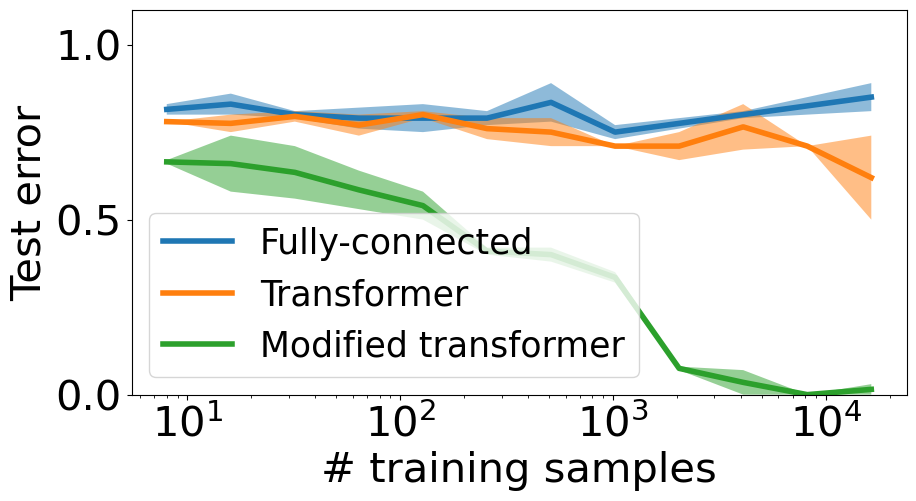

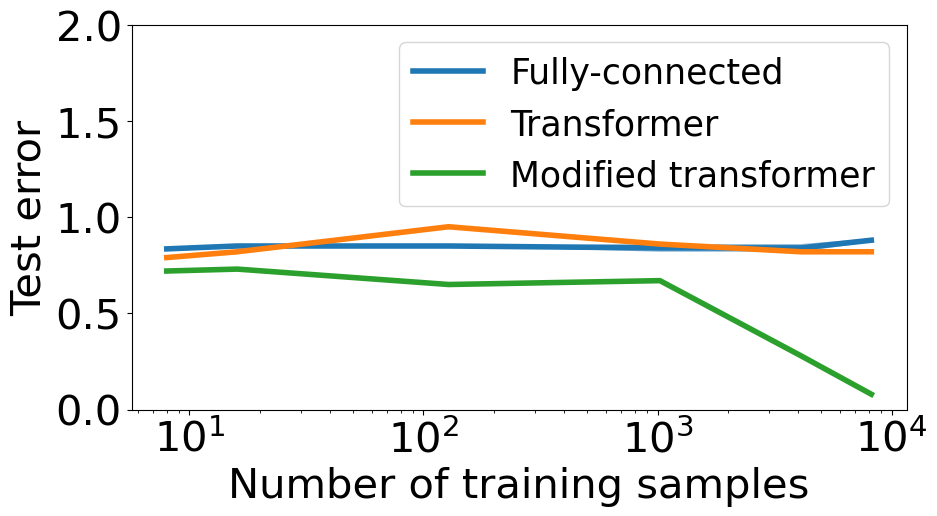

In [10]:
def task_add_transformertied_counting_trainid(lrs=None, ns=None, L=5, num_trials=5,wkwq_id_mult=1,wvwo_id_mult=1,config_func=get_test_err_at_best_val_acc,depth=2,emb_dim=128,label_name=None,epochs=100):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32678, 65536, 131072, 262144]
    
    gen_templ = gen_counting_templates(L)
    
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                depthstr = ''
                if depth != 2:
                    depthstr = f'_depth{depth}'
                emb_dim_str = ''
                if emb_dim != 128:
                    emb_dim_str = f'_embdim{emb_dim}'
                config = {('logging', 'task_name') : f'counting{L}_tiedembunemb_trainwkwqid{wkwq_id_mult}_trainwvwoid{wvwo_id_mult}_trainsamples{n}_epochs{epochs}{depthstr}{emb_dim_str}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): gen_templ['templates'],
                          ('data', 'wildcards'): gen_templ['wildcards'],
                          ('data', 'template_probs'): gen_templ['template_probs'],
                          ('data', 'template_labels'): gen_templ['template_labels'],
                          ('data', 'label_type'): 'multiclass',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): epochs,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'weight_decay'): 0,
                          ('training', 'num_workers'): 8,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer_tiedembeddingunembedding',
                          ('model', 'embed_dim'): emb_dim,
                          ('model', 'depth'): depth,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : True,
                          ('model', 'wvwo_id_mult') : wvwo_id_mult,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, WVWO {wvwo_id_mult}, {emb_dim_str}, {depthstr}, '
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}n',f'{label_name}lr',num_trials,config_func=config_func)
    else:
        label_name = label_name
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials,config_func=config_func)
    
L = 5
task_add_fcnet_depth2_counting(ns=[8,16,32,64,128,256,512,1024,4096,16384], L=L, num_trials=2, lrs=[1e-3], label_name='Fully-connected')
task_add_transformertied_counting_trainid(ns=[8,16,32,64,128,256,512,1024,2048,4096,8192,16384],lrs=[0.001], L=L, num_trials=2, wkwq_id_mult=0, wvwo_id_mult=0, depth=4,emb_dim=512,label_name='Transformer')
task_add_transformertied_counting_trainid(ns=[8,16,32,64,128,256,512,1024,2048,4096,8192,16384],lrs=[0.001], L=L, num_trials=2, wkwq_id_mult=10, wvwo_id_mult=10, depth=4,emb_dim=512,label_name='Modified transformer')

plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)

plot_ylim = [(0,1.1)] * len(plot_ylim)
# plot_labelx = [None]*len(plot_labelx)
# plot_labely = [None]*len(plot_labely)
plot_config_dict(plot2=False,labelx1='# training samples',labely1='Test error',override_labels=True,
                savefile1='figs/counting_5.pdf',figsize=(10,5)) # legend_loc='none'

L = 7
task_add_fcnet_depth2_counting(ns=[8,16,128,1024,4096,8192], L=L, num_trials=2, lrs=[1e-3], label_name='Fully-connected')
task_add_transformertied_counting_trainid(ns=[8,16,128,1024,4096,8192],lrs=[0.001], L=L, num_trials=1, wkwq_id_mult=0, wvwo_id_mult=0, depth=4,emb_dim=512,label_name='Transformer')
task_add_transformertied_counting_trainid(ns=[8,16,128,1024,4096,8192],lrs=[0.001], L=L, num_trials=1, wkwq_id_mult=10, wvwo_id_mult=10, depth=4,emb_dim=512,label_name='Modified transformer')


plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)
plot_config_dict(plot2=False,labelx1='Number of training samples',labely1='Test error',override_labels=True,
                savefile1='figs/counting_7.pdf',figsize=(10,5))

## Associative memory python program

In [11]:
def task_add_fcnet_depth2_teaser2(ns=None, lrs = [1e-3], num_trials = 3, config_func=get_test_err_at_best_val_acc, label_name=''):
    configs = {}
    if ns is None:
        ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    depth = 2
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'teaser2_tiedembunemb_fcnet{depth}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                           ('data', 'templates'): ['#="$";?="%";print(#)', '#="$";?="%";print(?)'],
                           ('data', 'wildcards'): '#?$%',
                           ('data', 'template_probs'): [0.5, 0.5],
                           ('data', 'template_labels'): ['$', '%'],
                           ('data', 'label_type'): 'multiclass',

                           ('data', 'num_train_samples'): n,
                           ('data', 'train_substitution_alphabet_size') : n,
                           ('data', 'num_val_samples'): 100,
                           ('data', 'val_substitution_alphabet_size') : 100,
                           ('data', 'num_test_samples'): 100,
                           ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', label_name, num_trials=num_trials, logscale2=True,config_func=config_func)

    
def task_add_fcnetshared_depth2_teaser2(ns=None, lrs = [1e-3], num_trials = 3, config_func=get_test_err_at_best_val_acc, label_name=''):
    configs = {}
    if ns is None:
        ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    depth = 2
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'teaser2_tiedembunemb_fcnetshared{depth}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                           ('data', 'templates'): ['#="$";?="%";print(#)', '#="$";?="%";print(?)'],
                           ('data', 'wildcards'): '#?$%',
                           ('data', 'template_probs'): [0.5, 0.5],
                           ('data', 'template_labels'): ['$', '%'],
                           ('data', 'label_type'): 'multiclass',

                           ('data', 'num_train_samples'): n,
                           ('data', 'train_substitution_alphabet_size') : n,
                           ('data', 'num_val_samples'): 100,
                           ('data', 'val_substitution_alphabet_size') : 100,
                           ('data', 'num_test_samples'): 100,
                           ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp_sharedembedding',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', label_name, num_trials=num_trials, logscale2=True,config_func=config_func)

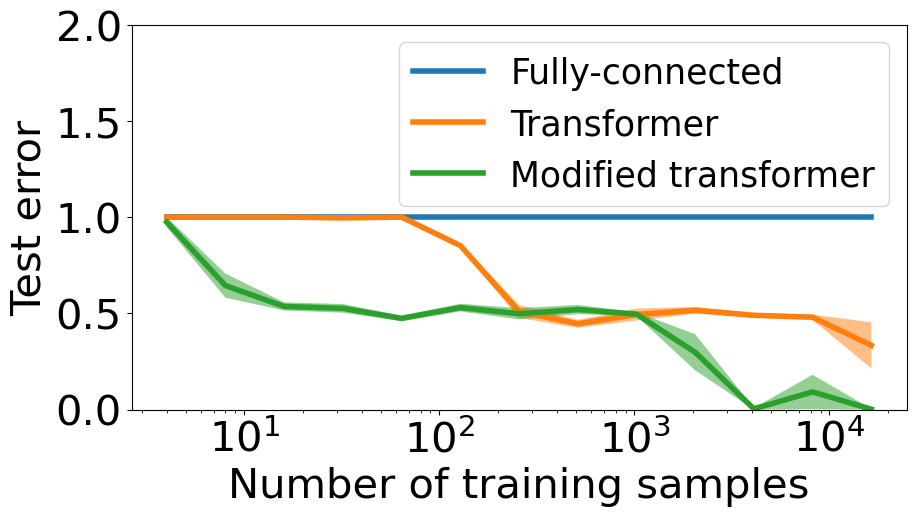

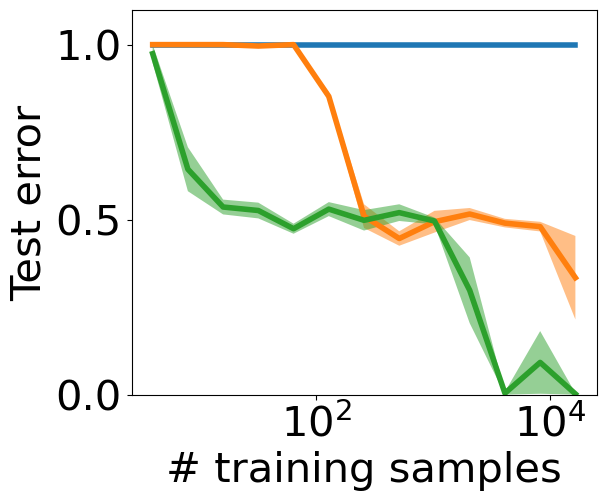

In [12]:
def task_add_transformertied_teaser2_trainid(lrs=None, ns=None, num_trials=5,wkwq_id_mult=1,wvwo_id_mult=1,config_func=get_test_err_at_best_val_acc,depth=2,emb_dim=128,label_name=None,epochs=100):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32678, 65536, 131072, 262144]
    
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                depthstr = ''
                if depth != 2:
                    depthstr = f'_depth{depth}'
                emb_dim_str = ''
                if emb_dim != 128:
                    emb_dim_str = f'_embdim{emb_dim}'
                config = {('logging', 'task_name') : f'teaser2upd_tiedembunemb_trainwkwqid{wkwq_id_mult}_trainwvwoid{wvwo_id_mult}_trainsamples{n}_epochs{epochs}{depthstr}{emb_dim_str}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#="$";?="%";print(#)', '#="$";?="%";print(?)'],
                          ('data', 'wildcards'): '#?$%',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): ['$', '%'],
                          ('data', 'label_type'): 'multiclass',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): epochs,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'weight_decay'): 0,
                          ('training', 'num_workers'): 8,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer_tiedembeddingunembedding',
                          ('model', 'embed_dim'): emb_dim,
                          ('model', 'depth'): depth,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : True,
                          ('model', 'wvwo_id_mult') : wvwo_id_mult,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, WVWO {wvwo_id_mult}, {emb_dim_str}, {depthstr}, '
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}n',f'{label_name}lr',num_trials,config_func=config_func)
    else:
        label_name = label_name
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials,config_func=config_func)

task_add_fcnetshared_depth2_teaser2(ns=[4,8,16,32,64,128,256,512,1024,4096,16384], num_trials=2, lrs=[1e-3], label_name='Fully-connected')
task_add_transformertied_teaser2_trainid(ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192,16384], lrs=[0.001], num_trials=5, wkwq_id_mult=0, wvwo_id_mult=0, depth=4,emb_dim=128,label_name='Transformer')
task_add_transformertied_teaser2_trainid(ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192,16384], lrs=[0.001], num_trials=5, wkwq_id_mult=10, wvwo_id_mult=10, depth=4,emb_dim=128,label_name='Modified transformer')
plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)


plot_config_dict(plot2=False,labelx1='Number of training samples',labely1='Test error',override_labels=True,
                savefile1='figs/teaser2.pdf',figsize=(10,5))


task_add_fcnetshared_depth2_teaser2(ns=[4,8,16,32,64,128,256,512,1024,4096,16384], num_trials=2, lrs=[1e-3], label_name='Fully-connected')
task_add_transformertied_teaser2_trainid(ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192,16384], lrs=[0.001], num_trials=5, wkwq_id_mult=0, wvwo_id_mult=0, depth=4,emb_dim=128,label_name='Transformer')
task_add_transformertied_teaser2_trainid(ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192,16384], lrs=[0.001], num_trials=5, wkwq_id_mult=10, wvwo_id_mult=10, depth=4,emb_dim=128,label_name='Modified transformer')

plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)


plot_ylim = [(0,1.1)] * len(plot_ylim)

plot_config_dict(plot2=False,labelx1='# training samples',labely1='Test error',override_labels=True,
                savefile1='figs/teaser2_slide.pdf',figsize=(6,5), legend_loc='none')

## Same/different classification

In [13]:
def task_add_fcnet_depth2_samedifferentclass(ns=None, lrs = [1e-3], num_trials = 3, config_func=get_test_err_at_best_val_acc, label_name=''):
    configs = {}
    if ns is None:
        ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    depth = 2
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'samedifferentclass_tiedembunemb_fcnet{depth}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                           ('data', 'templates'): ['##', '#?'],
                           ('data', 'wildcards'): '#?',
                           ('data', 'template_probs'): [0.5, 0.5],
                           ('data', 'template_labels'): ['A', 'B'],
                           ('data', 'label_type'): 'multiclass',

                           ('data', 'num_train_samples'): n,
                           ('data', 'train_substitution_alphabet_size') : n,
                           ('data', 'num_val_samples'): 100,
                           ('data', 'val_substitution_alphabet_size') : 100,
                           ('data', 'num_test_samples'): 100,
                           ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', label_name, num_trials=num_trials, logscale2=True,config_func=config_func)

    
def task_add_fcnetshared_depth2_samedifferentclass(ns=None, lrs = [1e-3], num_trials = 3, config_func=get_test_err_at_best_val_acc, label_name=''):
    configs = {}
    if ns is None:
        ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    depth = 2
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'samedifferentclass_tiedembunemb_fcnetshared{depth}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                           ('data', 'templates'): ['##', '#?'],
                           ('data', 'wildcards'): '#?',
                           ('data', 'template_probs'): [0.5, 0.5],
                           ('data', 'template_labels'): ['A', 'B'],
                           ('data', 'label_type'): 'multiclass',

                           ('data', 'num_train_samples'): n,
                           ('data', 'train_substitution_alphabet_size') : n,
                           ('data', 'num_val_samples'): 100,
                           ('data', 'val_substitution_alphabet_size') : 100,
                           ('data', 'num_test_samples'): 100,
                           ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp_sharedembedding',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', label_name, num_trials=num_trials, logscale2=True,config_func=config_func)

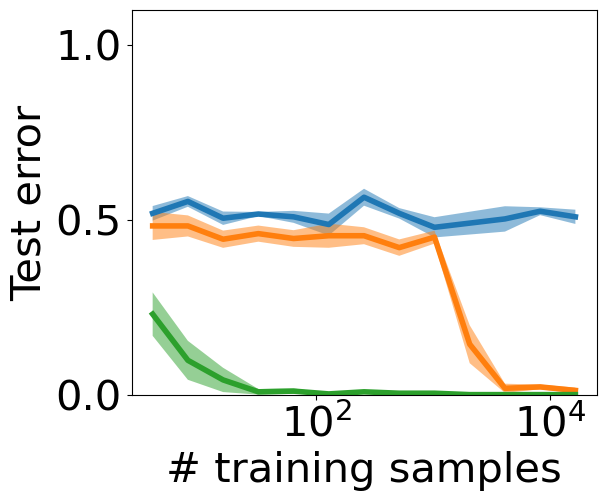

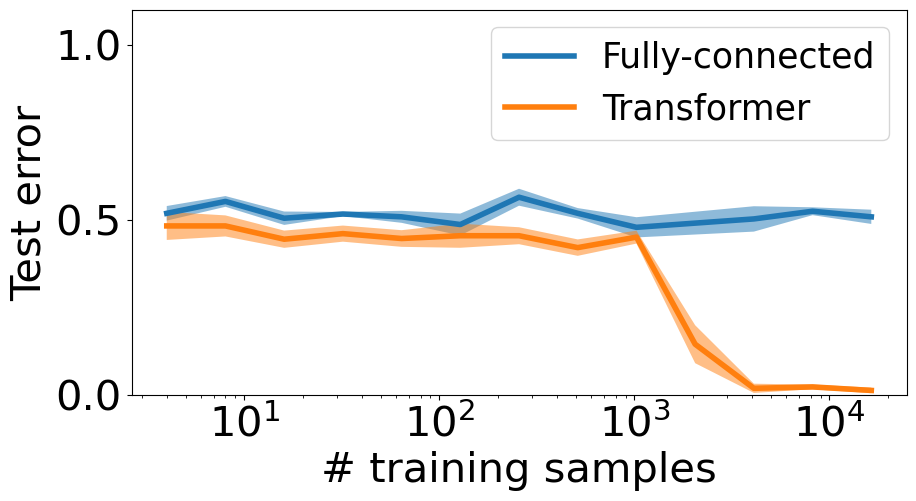

In [14]:
def task_add_transformertied_samedifferentclass_trainid(lrs=None, ns=None, batch_size=1024, num_trials=5,wkwq_id_mult=1,wvwo_id_mult=1,config_func=get_test_err_at_best_val_acc,depth=2,emb_dim=128,label_name=None,epochs=100):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32678, 65536, 131072, 262144]
    
    batch_size_str = ''
    if batch_size != 1024:
        batch_size_str = f'_batch{batch_size}'
    
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                depthstr = ''
                if depth != 2:
                    depthstr = f'_depth{depth}'
                emb_dim_str = ''
                if emb_dim != 128:
                    emb_dim_str = f'_embdim{emb_dim}'
                config = {('logging', 'task_name') : f'samedifferentclass_tiedembunemb_trainwkwqid{wkwq_id_mult}_trainwvwoid{wvwo_id_mult}_trainsamples{n}{batch_size_str}_epochs{epochs}{depthstr}{emb_dim_str}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#?', '##'],
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): ['A', 'B'],
                          ('data', 'label_type'): 'multiclass',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): epochs,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'weight_decay'): 0,
                          ('training', 'num_workers'): 8,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer_tiedembeddingunembedding',
                          ('model', 'embed_dim'): emb_dim,
                          ('model', 'depth'): depth,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : True,
                          ('model', 'wvwo_id_mult') : wvwo_id_mult,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, WVWO {wvwo_id_mult}, {emb_dim_str}, {depthstr}, '
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}n',f'{label_name}lr',num_trials,config_func=config_func)
    else:
        label_name = label_name
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials,config_func=config_func)
    

task_add_fcnet_depth2_samedifferentclass(ns=[4,8,16,32,64,128,256,512,1024,4096,8192, 16384], num_trials=5, lrs=[1e-3], label_name='Fully-connected')
task_add_transformertied_samedifferentclass_trainid(ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192,16384], lrs=[0.001], num_trials=5, wkwq_id_mult=0, wvwo_id_mult=0, depth=4,emb_dim=256,label_name='Transformer')
task_add_transformertied_samedifferentclass_trainid(ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192,16384], lrs=[0.001], num_trials=5, wkwq_id_mult=10, wvwo_id_mult=10, depth=4,emb_dim=256,label_name='Modified transformer')


plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)

plot_ylim = [(0,1.1)] * len(plot_ylim)

plot_config_dict(plot2=False,labelx1='# training samples',labely1='Test error',override_labels=True,
                savefile1='figs/samedifferentclass_slide.pdf',figsize=(6,5), legend_loc='none') # ,legend_loc='none'

task_add_fcnet_depth2_samedifferentclass(ns=[4,8,16,32,64,128,256,512,1024,4096,8192, 16384], num_trials=5, lrs=[1e-3], label_name='Fully-connected')
task_add_transformertied_samedifferentclass_trainid(ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192,16384], lrs=[0.001], num_trials=5, wkwq_id_mult=0, wvwo_id_mult=0, depth=4,emb_dim=256,label_name='Transformer')
# task_add_transformertied_samedifferentclass_trainid(ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192,16384], lrs=[0.001], num_trials=5, wkwq_id_mult=10, wvwo_id_mult=10, depth=4,emb_dim=256,label_name='Modified transformer')


plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)

plot_ylim = [(0,1.1)] * len(plot_ylim)

plot_config_dict(plot2=False,labelx1='# training samples',labely1='Test error',override_labels=True,
                savefile1='figs/samedifferentclass_slidefull.pdf',figsize=(10,5)) # ,legend_loc='none'

## Same/different task

In [15]:
def task_add_fcnet_depth3_samedifferent(ns=None, lrs = [1e-3], num_trials = 3, config_func=get_test_at_best_val, label_name=''):
    configs = {}
    if ns is None:
        ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    depth = 3
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'samedifferent_mlp_depth{depth}_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['##', '#$'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', label_name, num_trials=num_trials, logscale2=True,config_func=config_func)

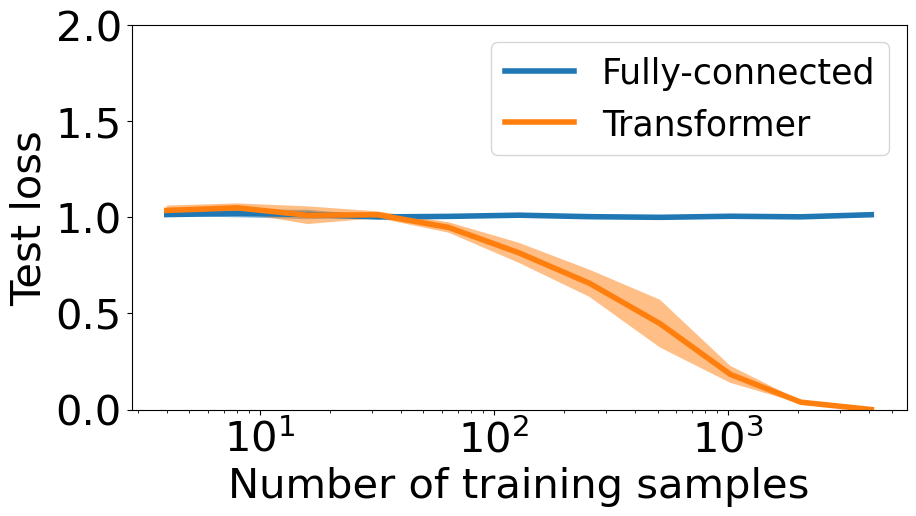

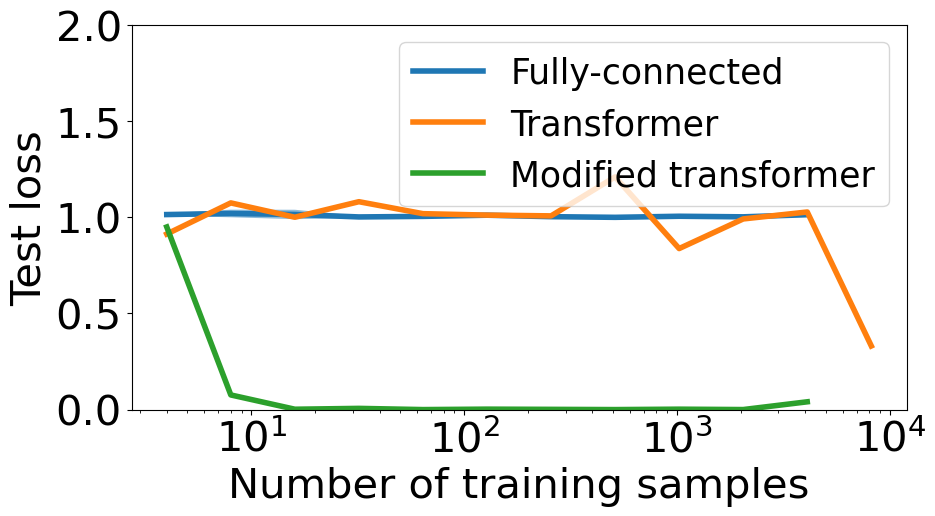

In [16]:
def task_add_transformer_samedifferent_trainwkwqid(lrs=None, ns=None, num_trials=5,wkwq_id_mult=1,label_name=None,depth=None,embed_dim=128):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    
    embed_dim_str = ''
    if embed_dim != 128:
        embed_dim_str = f'_embeddim{embed_dim}'
    
    if depth is None:
        depth = 2
        depth_str = ''
    else:
        depth_str = f'_depth{depth}'
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'samedifferentupd_trainwkwqid{wkwq_id_mult}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}{depth_str}{embed_dim_str}',
                          ('data', 'templates'): ['## ', '#? '],
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): embed_dim,
                          ('model', 'depth'): depth,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : False,
                          ('model', 'wvwo_id_mult') : 0,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, '
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}n',f'{label_name}lr',num_trials)
    else:
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials)
        
# task_add_transformer_teaser_trainwkwqid(lrs=[0.001],ns=[16, 32, 64, 128, 256], num_trials=2, wkwq_id_mult=1)
# task_add_transformer_teaser_trainwkwqid(lrs=[0.001],ns=[16, 32, 64], num_trials=2, wkwq_id_mult=100)
# task_add_transformer_samedifferent(lrs=[0.001], num_trials=5, label_name='Transformer')
# task_add_transformer_samedifferent(lrs=[0.001],ns=[4,16,64,256,512,1024,4096],num_trials=2, label_name='Transformer')

 # see improvement as KQ identity hyperparameter increases --> comparison of symbols becomes easier to represent
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,16,64], num_trials=2, wkwq_id_mult=1,label_name='Transformer + 1KQ identity')
task_add_fcnet_depth3_samedifferent(ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, lrs=[1e-3], label_name='Fully-connected')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[128,256,512,1024], num_trials=1, wkwq_id_mult=0,label_name='Transformer4',depth=4) ## Sanity check -- no change
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[128,256,512,1024], num_trials=1, wkwq_id_mult=0,label_name='Transformer3',depth=3) ## Sanity check -- no change
task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=0,label_name='Transformer')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=10,label_name='Modified transformer')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.0001], ns=[4,16,64], num_trials=1, wkwq_id_mult=10,label_name='Transformer + 10KQ identity')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.01], ns=[4,16,64], num_trials=1, wkwq_id_mult=10,label_name='Transformer + 10KQ identity')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,16,64], num_trials=3, wkwq_id_mult=100,label_name='Transformer + 100KQ identity')


plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)

plot_config_dict(title1=None,
                 plot2=False,labelx1='Number of training samples',labely1='Test loss',override_labels=True,
                 savefile1='figs/samedifferent.pdf',figsize=(10,5))



# task_add_fcnet_depth3_samedifferent(ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, lrs=[1e-3], label_name='Fully-connected')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=0,label_name='Transformer')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=10,label_name='Modified transformer')

task_add_fcnet_depth3_samedifferent(ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, lrs=[1e-3], label_name='Fully-connected')
task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096,8192], embed_dim=512, num_trials=1, wkwq_id_mult=0,label_name='Transformer')
task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], embed_dim=512, num_trials=1, wkwq_id_mult=10,label_name='Modified transformer')
plot_config_dict(title1=None,
                 plot2=False,labelx1='Number of training samples',labely1='Test loss',override_labels=True,
                 savefile1='figs/samedifferent_mod.pdf',figsize=(10,5))

## AABB vs. ABAB

In [17]:
def task_add_fcnet_depth3_abab_vs_aabb(ns=None, lrs = [1e-3], num_trials = 3, config_func=get_test_at_best_val, label_name=''):
    configs = {}
    if ns is None:
        ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    depth = 3
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'abab_vs_aabbupd_mlp_depth{depth}_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['##$$ ', '#$#$ '],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', label_name, num_trials=num_trials, logscale2=True,config_func=config_func)

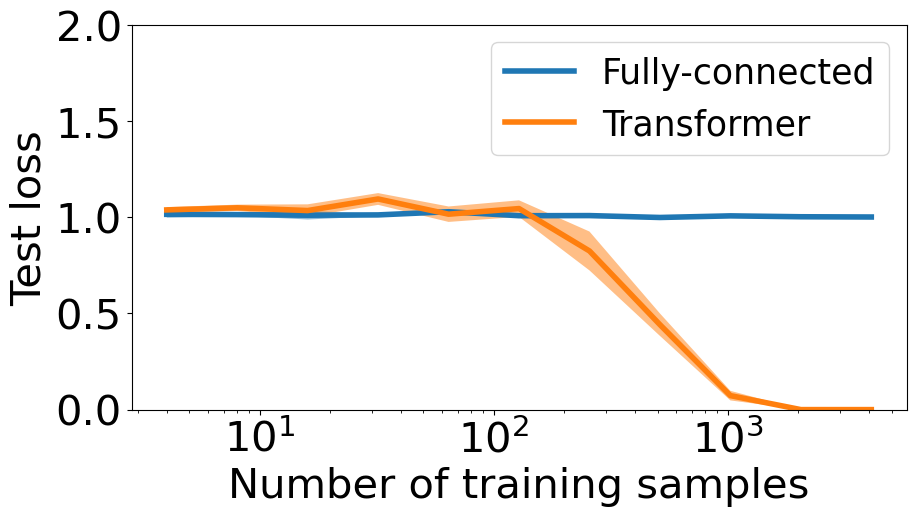

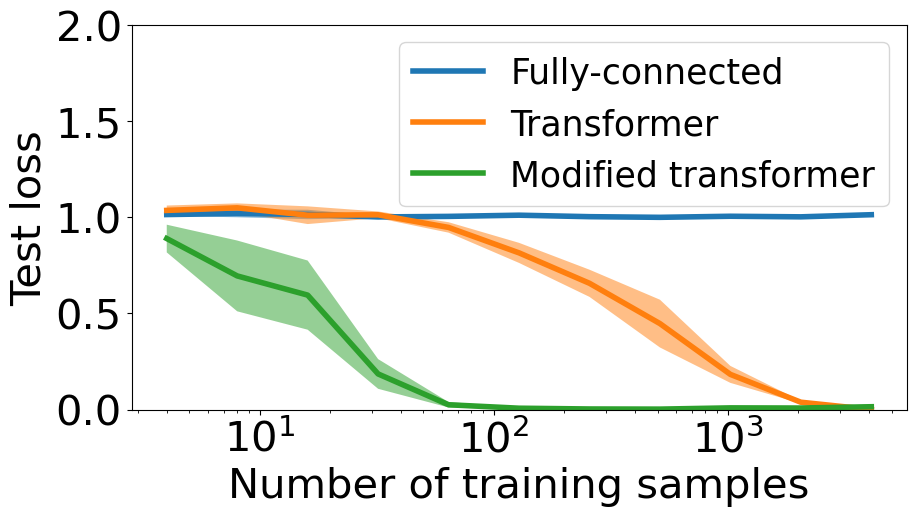

In [18]:
def task_add_transformer_abab_vs_aabb_trainwkwqid(lrs=None, ns=None, num_trials=5,wkwq_id_mult=1,label_name=None,depth=None):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    
    if depth is None:
        depth = 2
        depth_str = ''
    else:
        depth_str = f'_depth{depth}'
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'abab_vs_aabb_upd_trainwkwqid{wkwq_id_mult}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}{depth_str}',
                          ('data', 'templates'): ['##?? ', '#?#? '],
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): depth,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : False,
                          ('model', 'wvwo_id_mult') : 0,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, '
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}n',f'{label_name}lr',num_trials)
    else:
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials)
        
# task_add_transformer_teaser_trainwkwqid(lrs=[0.001],ns=[16, 32, 64, 128, 256], num_trials=2, wkwq_id_mult=1)
# task_add_transformer_teaser_trainwkwqid(lrs=[0.001],ns=[16, 32, 64], num_trials=2, wkwq_id_mult=100)
# task_add_transformer_samedifferent(lrs=[0.001], num_trials=5, label_name='Transformer')
# task_add_transformer_samedifferent(lrs=[0.001],ns=[4,16,64,256,512,1024,4096],num_trials=2, label_name='Transformer')

 # see improvement as KQ identity hyperparameter increases --> comparison of symbols becomes easier to represent
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,16,64], num_trials=2, wkwq_id_mult=1,label_name='Transformer + 1KQ identity')
task_add_fcnet_depth3_abab_vs_aabb(ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=3, lrs=[1e-3], label_name='Fully-connected')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[128,256,512,1024], num_trials=1, wkwq_id_mult=0,label_name='Transformer4',depth=4) ## Sanity check -- no change
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[128,256,512,1024], num_trials=1, wkwq_id_mult=0,label_name='Transformer3',depth=3) ## Sanity check -- no change
task_add_transformer_abab_vs_aabb_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=0,label_name='Transformer')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=10,label_name='Modified transformer')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.0001], ns=[4,16,64], num_trials=1, wkwq_id_mult=10,label_name='Transformer + 10KQ identity')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.01], ns=[4,16,64], num_trials=1, wkwq_id_mult=10,label_name='Transformer + 10KQ identity')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,16,64], num_trials=3, wkwq_id_mult=100,label_name='Transformer + 100KQ identity')


plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)

plot_config_dict(title1=None,
                 plot2=False,labelx1='Number of training samples',labely1='Test loss',override_labels=True,
                 savefile1='figs/samedifferent.pdf',figsize=(10,5))



task_add_fcnet_depth3_samedifferent(ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, lrs=[1e-3], label_name='Fully-connected')
task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=0,label_name='Transformer')
task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=10,label_name='Modified transformer')
plot_config_dict(title1=None,
                 plot2=False,labelx1='Number of training samples',labely1='Test loss',override_labels=True,
                 savefile1='figs/samedifferent_mod.pdf',figsize=(10,5))

## Teaser figure (associative memory python program)

#### Transformer

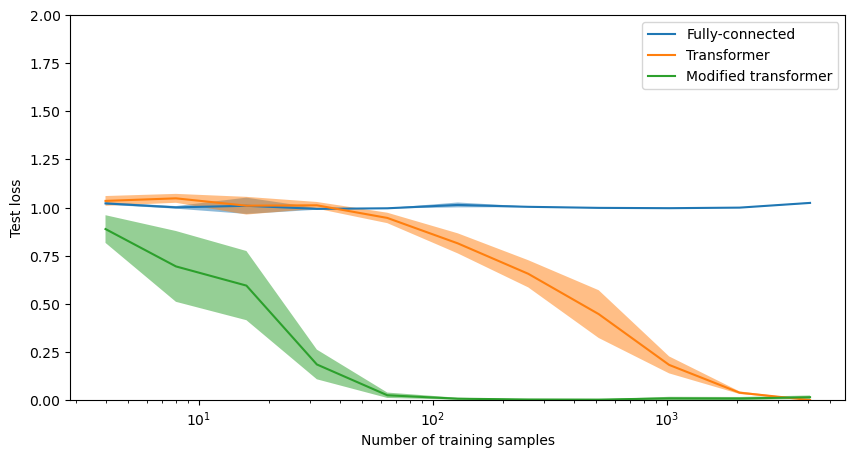

In [19]:
def task_add_transformer_samedifferent_trainwkwqid(lrs=None, ns=None, num_trials=5,wkwq_id_mult=1,label_name=None):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'samedifferentupd_trainwkwqid{wkwq_id_mult}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['## ', '#? '],
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : False,
                          ('model', 'wvwo_id_mult') : 0,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, '
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}n',f'{label_name}lr',num_trials)
    else:
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials)

 # see improvement as KQ identity hyperparameter increases --> comparison of symbols becomes easier to represent
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,16,64], num_trials=2, wkwq_id_mult=1,label_name='Transformer + 1KQ identity')
task_add_fcnet_depth3_samedifferent(ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=3, lrs=[1e-3], label_name='Fully-connected')
task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=0,label_name='Transformer')
task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,8,16,32,64,128,256,512,1024,2048,4096], num_trials=5, wkwq_id_mult=10,label_name='Modified transformer')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.0001], ns=[4,16,64], num_trials=1, wkwq_id_mult=10,label_name='Transformer + 10KQ identity')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.01], ns=[4,16,64], num_trials=1, wkwq_id_mult=10,label_name='Transformer + 10KQ identity')
# task_add_transformer_samedifferent_trainwkwqid(lrs=[0.001], ns=[4,16,64], num_trials=3, wkwq_id_mult=100,label_name='Transformer + 100KQ identity')


plt.rcdefaults()

plot_config_dict(title1=None,
                 plot2=False,labelx1='Number of training samples',labely1='Test loss',override_labels=True,
                 savefile1='figs/samedifferent.pdf',figsize=(10,5))

In [20]:
def task_add_transformer_teaser(lrs=None, ns=None, num_trials=5,label_name=None):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'teaser_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['# = 1; ? = -1; print(#)', '# = 1; ? = -1; print(?)'],
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    if label_name is None:
        label_name = f''
        add_to_plot_config_dict(configs,ns,lrs,f'n',f'lr',num_trials)
    else:
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials)
# task_add_transformer_teaser(lrs=[0.001],num_trials=5)
# plot_config_dict()

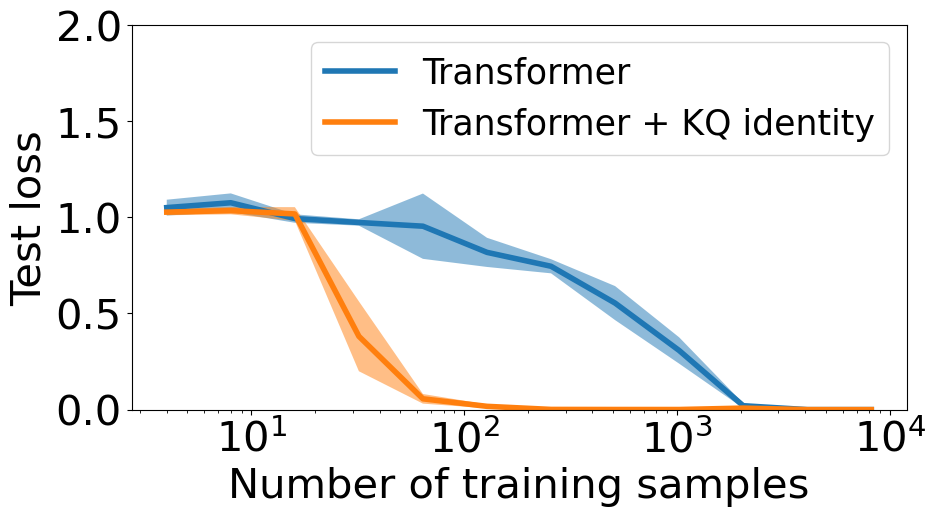

In [21]:
def task_add_transformer_teaser_trainwkwqid(lrs=None, ns=None, num_trials=5,wkwq_id_mult=1,label_name=None):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'teaser_trainwkwqid{wkwq_id_mult}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['# = 1; ? = -1; print(#)', '# = 1; ? = -1; print(?)'],
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : False,
                          ('model', 'wvwo_id_mult') : 0,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, '
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}n',f'{label_name}lr',num_trials)
    else:
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials)
        
task_add_transformer_teaser(lrs=[0.001], num_trials=5, label_name='Transformer')
task_add_transformer_teaser_trainwkwqid(lrs=[0.001], num_trials=5, wkwq_id_mult=10,label_name='Transformer + KQ identity')


plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)

plot_config_dict(title1=None,
                 plot2=False,labelx1='Number of training samples',labely1='Test loss',override_labels=True,
                 savefile1='figs/teaser1.pdf',figsize=(10,5))

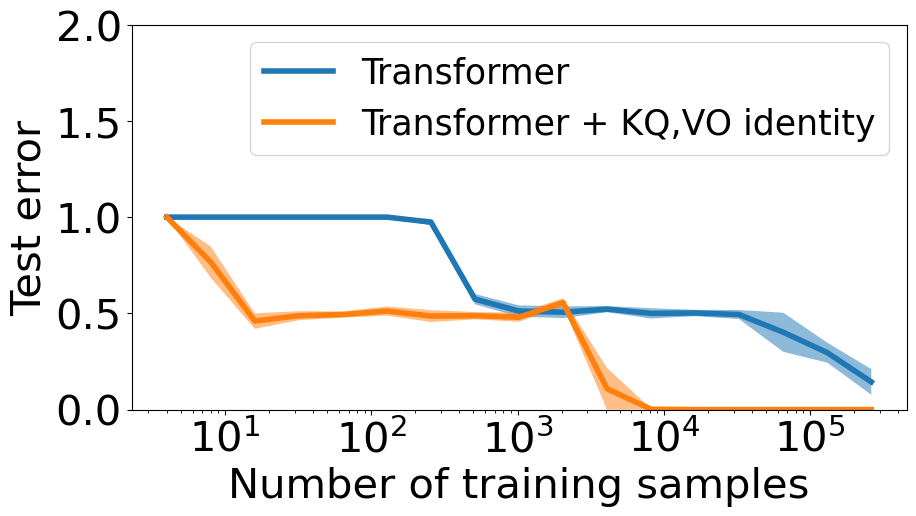

In [22]:
def task_add_transformertied_teaser2_trainid(lrs=None, ns=None, num_trials=5,wkwq_id_mult=1,wvwo_id_mult=1,config_func=get_test_err_at_best_val_acc,depth=2,emb_dim=128,label_name=None,epochs=100):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8,16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32678, 65536, 131072, 262144]
    
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                depthstr = ''
                if depth != 2:
                    depthstr = f'_depth{depth}'
                emb_dim_str = ''
                if emb_dim != 128:
                    emb_dim_str = f'_embdim{emb_dim}'
                config = {('logging', 'task_name') : f'teaser2upd_tiedembunemb_trainwkwqid{wkwq_id_mult}_trainwvwoid{wvwo_id_mult}_trainsamples{n}_epochs{epochs}{depthstr}{emb_dim_str}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#="$";?="%";print(#)', '#="$";?="%";print(?)'],
                          ('data', 'wildcards'): '#?$%',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): ['$', '%'],
                          ('data', 'label_type'): 'multiclass',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): epochs,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'weight_decay'): 0,
                          ('training', 'num_workers'): 8,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer_tiedembeddingunembedding',
                          ('model', 'embed_dim'): emb_dim,
                          ('model', 'depth'): depth,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : True,
                          ('model', 'wvwo_id_mult') : wvwo_id_mult,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, WVWO {wvwo_id_mult}, {emb_dim_str}, {depthstr}, '
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}n',f'{label_name}lr',num_trials,config_func=config_func)
    else:
        label_name = label_name
        add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials,config_func=config_func)
    
# task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=1, wkwq_id_mult=0, wvwo_id_mult=0, depth=2,emb_dim=128,label_name='transformer,dim128')
# task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=1, wkwq_id_mult=0, wvwo_id_mult=0, depth=2,emb_dim=512, label_name='transformer,dim512')
# task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=1, wkwq_id_mult=10, wvwo_id_mult=0, depth=2,emb_dim=512,label_name='transformer+KQ identity,dim512')
# task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=1, wkwq_id_mult=0, wvwo_id_mult=1, depth=2,emb_dim=512,label_name='transformer+VO1 identity,dim512')
# task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=1, wkwq_id_mult=0, wvwo_id_mult=10, depth=2,emb_dim=512,label_name='transformer+VO10 identity,dim512')
# task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=1, wkwq_id_mult=10, wvwo_id_mult=10, depth=2,emb_dim=512,label_name='transformer+KQ,VO10 identity,dim512')
# task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=1, wkwq_id_mult=10, wvwo_id_mult=1, depth=2,emb_dim=512,label_name='transformer+KQ,VO1 identity,dim512')
# label_name='transformer identity,depth4,dim512',
# label_name='transformer+KQ,VO10 identity,depth4,dim512',
task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=5, wkwq_id_mult=0, wvwo_id_mult=0, depth=4,emb_dim=512,label_name='Transformer')
task_add_transformertied_teaser2_trainid(lrs=[0.001], num_trials=5, wkwq_id_mult=10, wvwo_id_mult=10, depth=4,emb_dim=512,label_name='Transformer + KQ,VO identity')

plt.rcdefaults()
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
plt.rc('legend', fontsize=25)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title
plt.rc('lines', linewidth=4)
plot_config_dict(plot2=False,labelx1='Number of training samples',labely1='Test error',override_labels=True,
                savefile1='figs/teaser2.pdf',figsize=(10,5))

### RNN

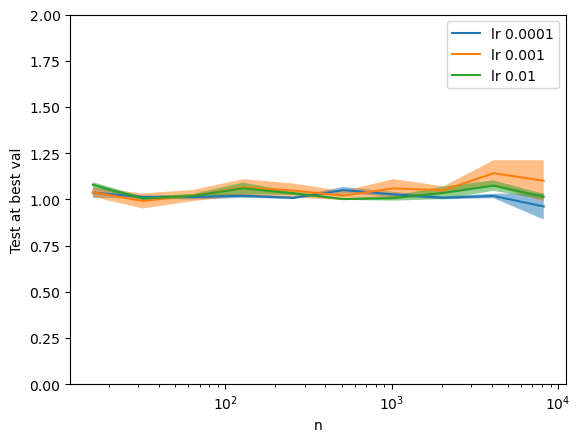

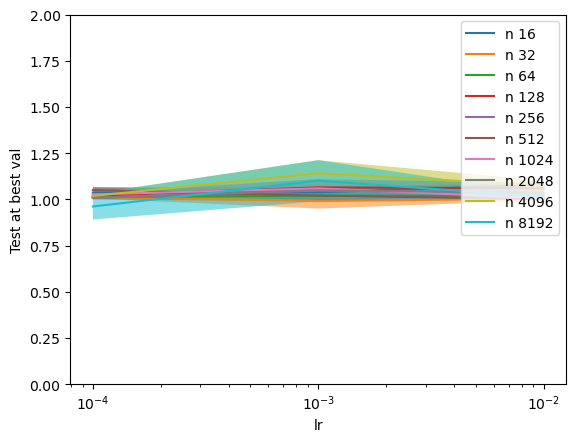

In [23]:
configs = {}
lrs = [1e-2, 1e-3, 1e-4]
ns = [16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
num_trials = 5
hidden_dim = 512
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'teaser_rnn_trainsamples{n}_trainsas{n}_lr{lr}_hiddendim{hidden_dim}_trial{trialnum}',
                      ('data', 'templates'): ['# = 1; ? = -1; print(#)', '# = 1; ? = -1; print(?)'],
                      ('data', 'wildcards'): '#?',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      
                      ('model', 'type'): 'rnn',
                      ('model', 'hidden_dim'): hidden_dim,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials)
plt.rcdefaults()
plot_config_dict()

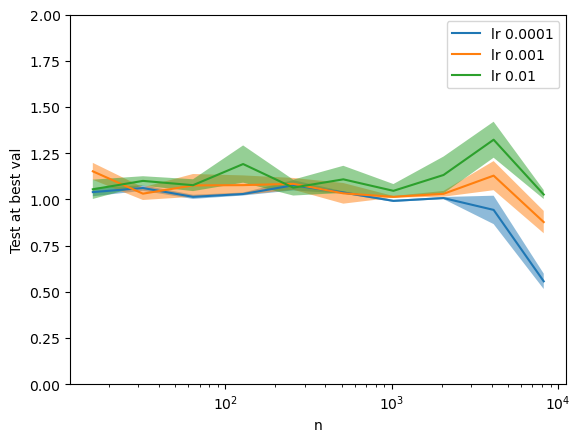

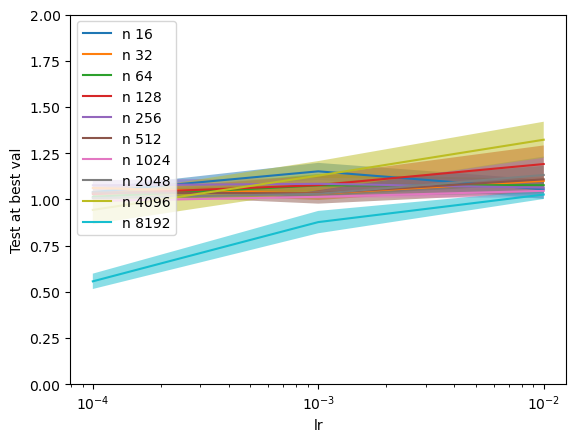

In [26]:
configs = {}
lrs = [1e-2, 1e-3, 1e-4]
ns = [16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
num_trials = 5
hidden_dim = 512
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'teaser_lstm_trainsamples{n}_trainsas{n}_lr{lr}_hiddendim{hidden_dim}_trial{trialnum}',
                      ('data', 'templates'): ['# = 1; ? = -1; print(#)', '# = 1; ? = -1; print(?)'],
                      ('data', 'wildcards'): '#?',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      
                      ('model', 'type'): 'lstm',
                      ('model', 'hidden_dim'): hidden_dim,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials)
plot_config_dict()

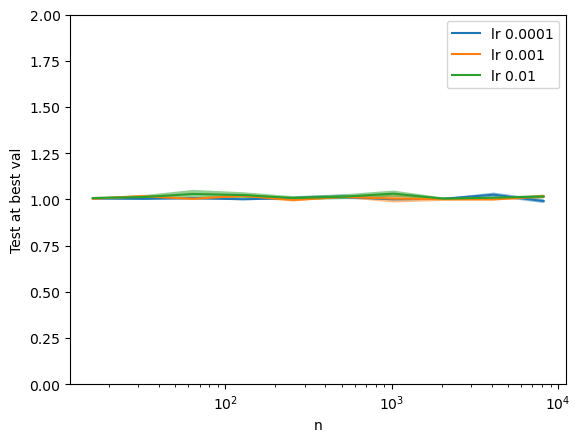

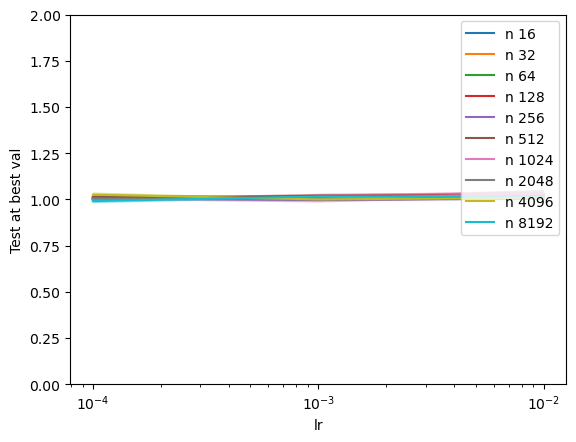

In [27]:
configs = {}
lrs = [1e-2, 1e-3, 1e-4]
ns = [16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
num_trials = 5
hidden_dim = 512
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'teaser_mlp_trainsamples{n}_trainsas{n}_lr{lr}_hiddendim{hidden_dim}_trial{trialnum}',
                      ('data', 'templates'): ['# = 1; ? = -1; print(#)', '# = 1; ? = -1; print(?)'],
                      ('data', 'wildcards'): '#?',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      
                      ('model', 'type'): 'mlp',
                      ('model', 'depth') : 3,
                      ('model', 'hidden_dim'): hidden_dim,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials)
plot_config_dict()

## Copying

64
128
256
512
1024
2048
4096


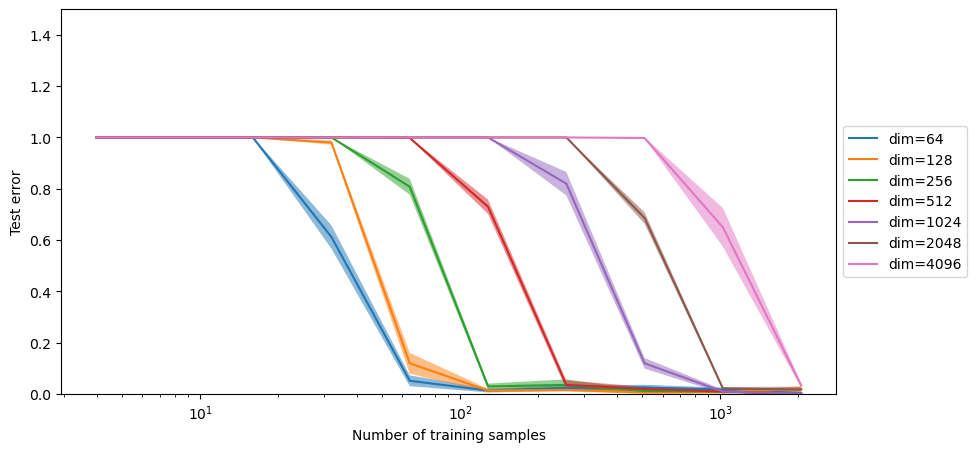

64
128
256
512
1024
2048
4096


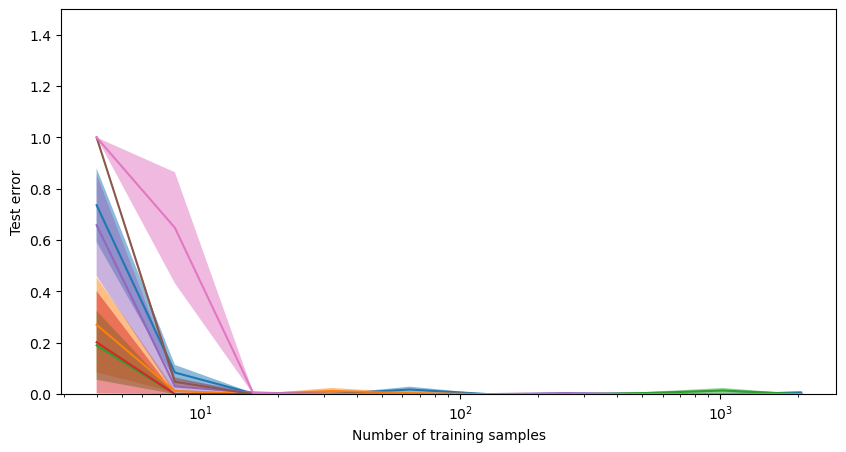

In [28]:
def task_add_transformertied_copyout_trainid(lrs=None, ns=None, num_trials=5,wkwq_id_mult=1,wvwo_id_mult=1,config_func=get_test_err_at_best_val_acc,depth=2,emb_dim=128,label_name=None,epochs=100,trainsas_tmplt=None):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
    if ns is None:
        ns = [4,8, 16, 32, 64, 128, 256, 512, 1024, 2048] #  , 4096, 8192, 4096, 8192, 16384,32678, 65536, 131072, 262144
    
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                # trainsas = min(8192,n)
                if trainsas_tmplt is None:
                    trainsas = n
                else:
                    trainsas = trainsas_tmplt
                # else:
                #     trainsas = 8192
                # trainsas = n
                depthstr = ''
                if depth != 2:
                    depthstr = f'_depth{depth}'
                emb_dim_str = ''
                if emb_dim != 128:
                    emb_dim_str = f'_embdim{emb_dim}'
                config = {('logging', 'task_name') : f'copyout_tiedembunemb_trainwkwqid{wkwq_id_mult}_trainwvwoid{wvwo_id_mult}_trainsamples{n}_epochs{epochs}{depthstr}{emb_dim_str}_trainsas{trainsas}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#'],
                          ('data', 'wildcards'): '#',
                          ('data', 'template_probs'): [1],
                          ('data', 'template_labels'): ['#'],
                          ('data', 'label_type'): 'multiclass',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : trainsas,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): epochs,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'weight_decay'): 0,
                          ('training', 'num_workers'): 8,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer_tiedembeddingunembedding',
                          ('model', 'embed_dim'): emb_dim,
                          ('model', 'depth'): depth,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : True,
                          ('model', 'wvwo_id_mult') : wvwo_id_mult,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
                # print(emb_dim,n)
    if label_name is None:
        label_name = f'WKWQ {wkwq_id_mult}, WVWO {wvwo_id_mult}, {emb_dim_str}, {depthstr}'
    else:
        label_name = label_name
    add_to_plot_config_dict(configs,ns,lrs,f'{label_name}',f'{label_name}',num_trials,config_func=config_func, ylim=(0,1.5))

clear_plot_config_dict()
emb_dim_to_lr = {64 : 1e-3, 256 : 1e-3, 1024 : 1e-3, 4096 : 1e-4, 128 : 1e-3, 512 : 1e-3, 2048 : 1e-4}
for emb_dim in [64, 128, 256, 512, 1024, 2048, 4096]:
    print(emb_dim)
    task_add_transformertied_copyout_trainid(lrs=[emb_dim_to_lr[emb_dim]], num_trials=5, wkwq_id_mult=0, wvwo_id_mult=0, depth=2,emb_dim=emb_dim,label_name=f'dim={emb_dim}')
plot_config_dict(plot2=False, labelx1='Number of training samples', labely1='Test error', override_labels=True,figsize=(10,5),legend_loc='right',
                 savefile1='figs/transformer_copy_fail.pdf')
for emb_dim in [64, 128, 256, 512, 1024, 2048, 4096]:
    print(emb_dim)
    task_add_transformertied_copyout_trainid(lrs=[emb_dim_to_lr[emb_dim]], num_trials=5, wkwq_id_mult=0, wvwo_id_mult=10, depth=2,emb_dim=emb_dim,label_name=f'dim={emb_dim}')
plot_config_dict(plot2=False, labelx1='Number of training samples', labely1='Test error', override_labels=True, figsize=(10,5),legend_loc='none',
                 savefile1='figs/transformer_copy_success.pdf')

## Effect of transformer training hyperparameters

We run a set of experiments by specifying a list of config files. The per-epoch train, validation, and test losses are saved after the experiment is run.

#### Grid-search learning rate and number of samples/vocab size, associative memory

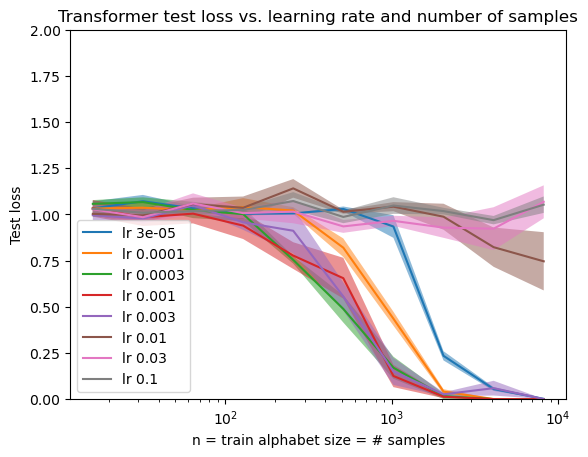

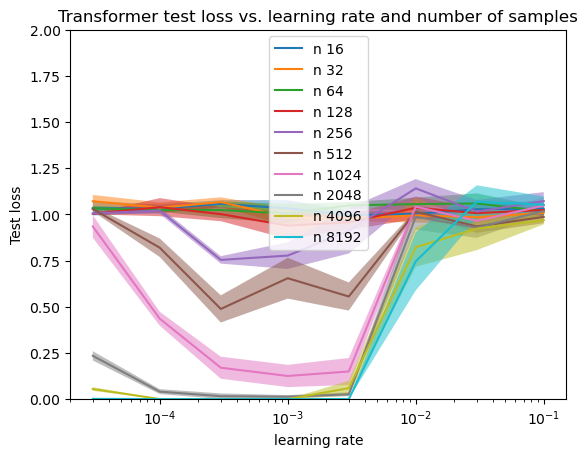

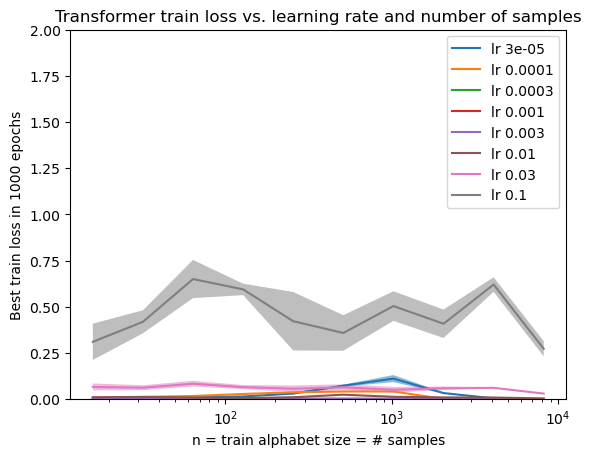

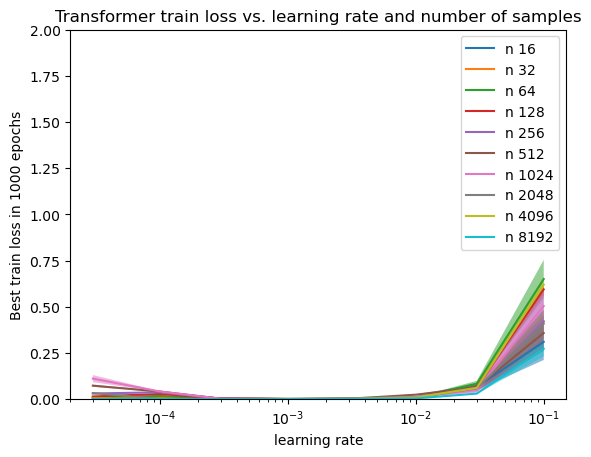

In [29]:
configs = {}
lrs = [3e-5,1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
ns = [16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
num_trials = 5
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'assoc_memory_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True)

plt.rcdefaults()
plot_config_dict(title1='Transformer test loss vs. learning rate and number of samples',
                 labelx1='n = train alphabet size = # samples', savefile1='figs/transformer_lr_n_1_gotu.pdf',
                 labely1='Test loss',
                 
                 title2='Transformer test loss vs. learning rate and number of samples',
                 labelx2='learning rate', savefile2='figs/transformer_lr_n_2_gotu.pdf',
                 labely2='Test loss',)

add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_best_train)
plot_config_dict(title1 = 'Transformer train loss vs. learning rate and number of samples',
                labelx1='n = train alphabet size = # samples', savefile1='figs/transformer_lr_n_1_train.pdf',
                labely1='Best train loss in 1000 epochs',
                 
                title2 = 'Transformer train loss vs. learning rate and number of samples',
                labelx2='learning rate', savefile2='figs/transformer_lr_n_2_train.pdf',
                labely2='Best train loss in 1000 epochs',)

#### Grid-search learning rate and depth, associative memory

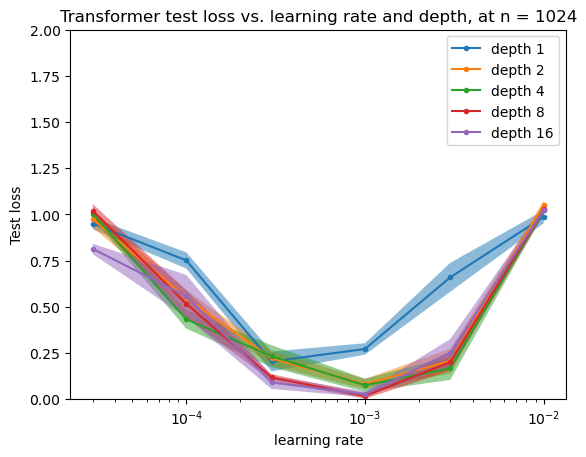

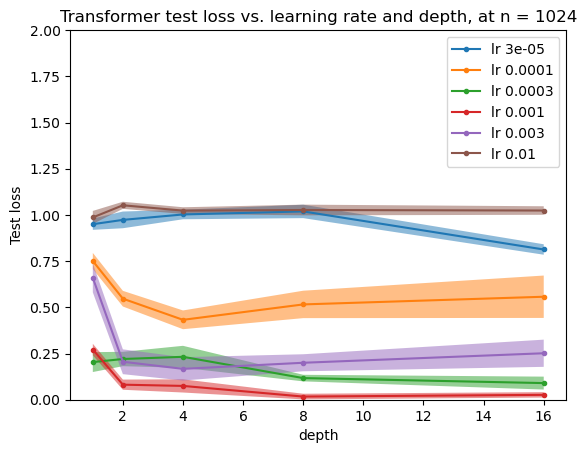

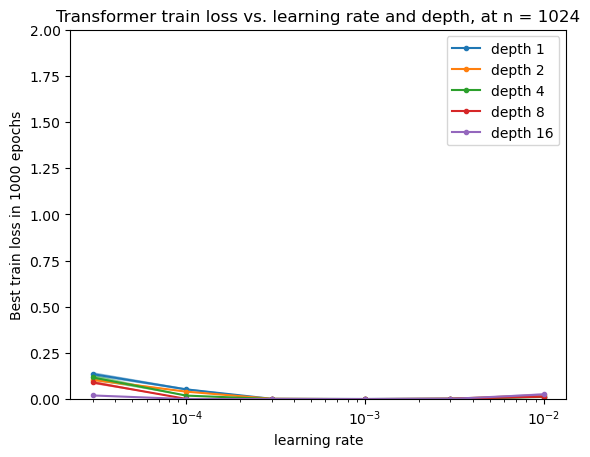

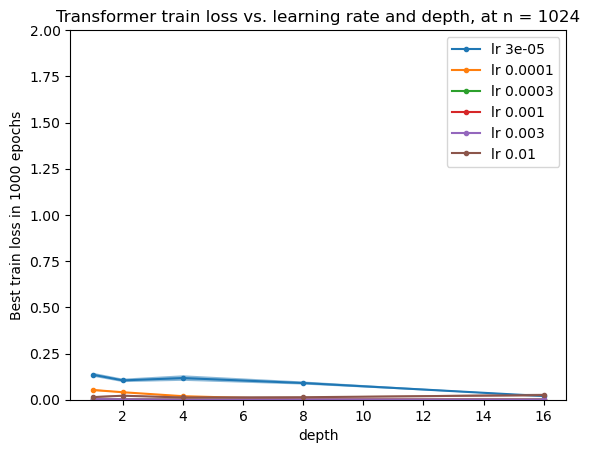

In [30]:
configs = {}
lrs = [3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
n = 1024 # A number of samples where results are not always perfect
num_trials = 5
depths = [1,2,4,8,16]
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for depth in depths:
            config = {('logging', 'task_name') : f'assoc_memory_trainsamples{n}_trainsas{n}_lr{lr}_depth{depth}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): depth,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(lr, depth, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs,lrs,depths,'lr','depth',num_trials,logscale2=False)

curr_title = f'Transformer test loss vs. learning rate and depth, at n = {n}'
plot_config_dict(title1=curr_title,
                 labelx1='learning rate', savefile1=f'figs/transformer_lr_depth_1_n{n}_gotu.pdf',
                 labely1='Test loss',
                 
                 title2=curr_title,
                 labelx2='depth', savefile2=f'figs/transformer_lr_depth_2_n{n}_gotu.pdf',
                 labely2='Test loss',
                 marker='.')

add_to_plot_config_dict(configs,lrs,depths,'lr','depth',num_trials,logscale2=False,config_func=get_best_train)

curr_title = f'Transformer train loss vs. learning rate and depth, at n = {n}'
plot_config_dict(title1=curr_title,
                 labelx1='learning rate', savefile1=f'figs/transformer_lr_depth_1_n{n}_train.pdf',
                 labely1='Best train loss in 1000 epochs',
                 
                 title2=curr_title,
                 labelx2='depth', savefile2=f'figs/transformer_lr_depth_2_n{n}_train.pdf',
                 labely2='Best train loss in 1000 epochs',
                 marker='.')

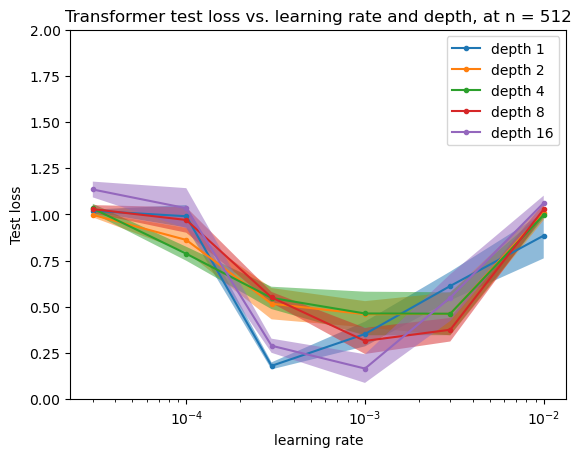

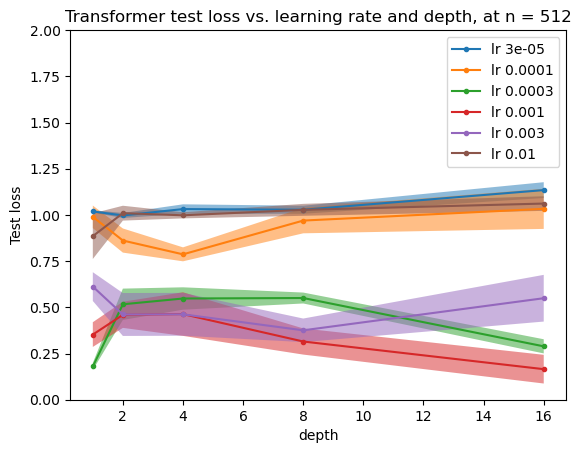

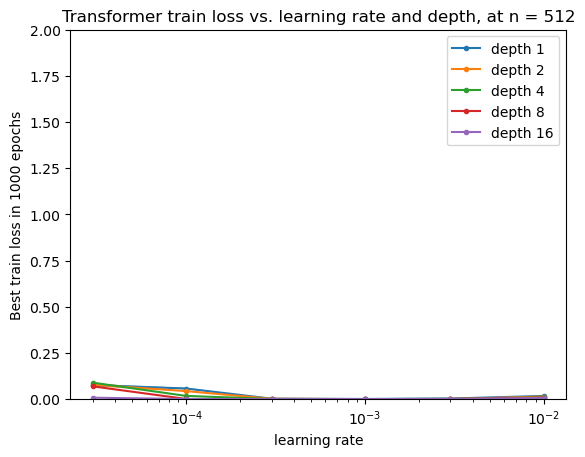

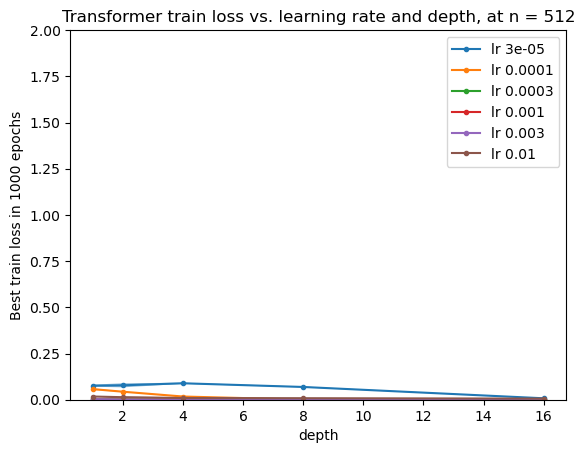

In [31]:
configs = {}
lrs = [3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
n = 512 # A number of samples where results are not always perfect
num_trials = 5
depths = [1,2,4,8,16]
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for depth in depths:
            config = {('logging', 'task_name') : f'assoc_memory_trainsamples{n}_trainsas{n}_lr{lr}_depth{depth}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): depth,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(lr, depth, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs,lrs,depths,'lr','depth',num_trials,logscale2=False)

curr_title = f'Transformer test loss vs. learning rate and depth, at n = {n}'
plot_config_dict(title1=curr_title,
                 labelx1='learning rate', savefile1=f'figs/transformer_lr_depth_1_n{n}_gotu.pdf',
                 labely1='Test loss',
                 
                 title2=curr_title,
                 labelx2='depth', savefile2=f'figs/transformer_lr_depth_2_n{n}_gotu.pdf',
                 labely2='Test loss',
                 marker='.')

add_to_plot_config_dict(configs,lrs,depths,'lr','depth',num_trials,logscale2=False,config_func=get_best_train)

curr_title = f'Transformer train loss vs. learning rate and depth, at n = {n}'
plot_config_dict(title1=curr_title,
                 labelx1='learning rate', savefile1=f'figs/transformer_lr_depth_1_n{n}_train.pdf',
                 labely1='Best train loss in 1000 epochs',
                 
                 title2=curr_title,
                 labelx2='depth', savefile2=f'figs/transformer_lr_depth_2_n{n}_train.pdf',
                 labely2='Best train loss in 1000 epochs',
                 marker='.')

#### Grid-search learning rate and num heads, associative memory

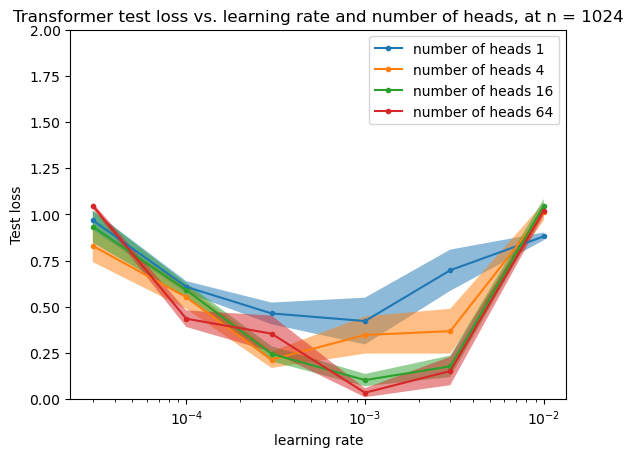

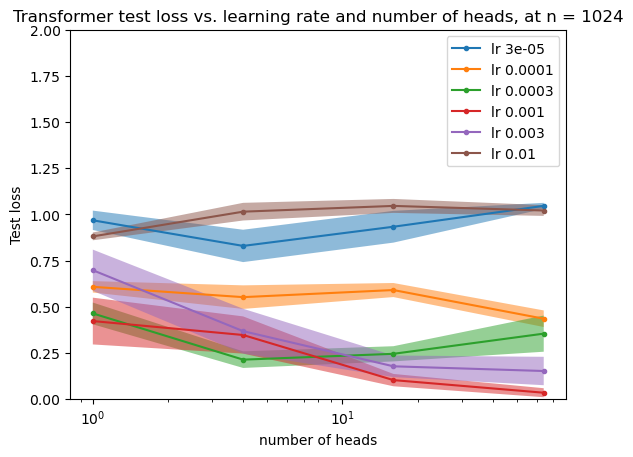

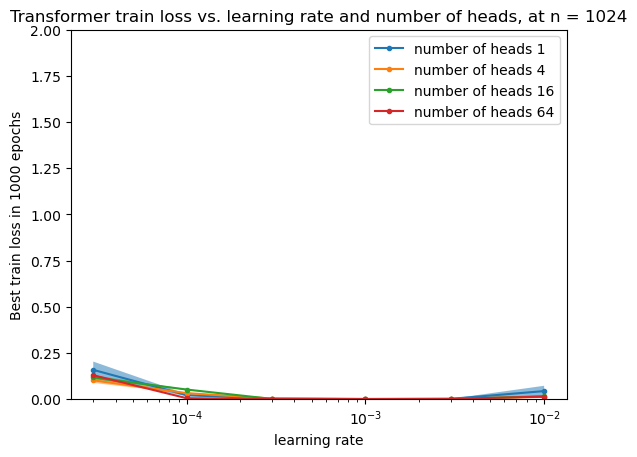

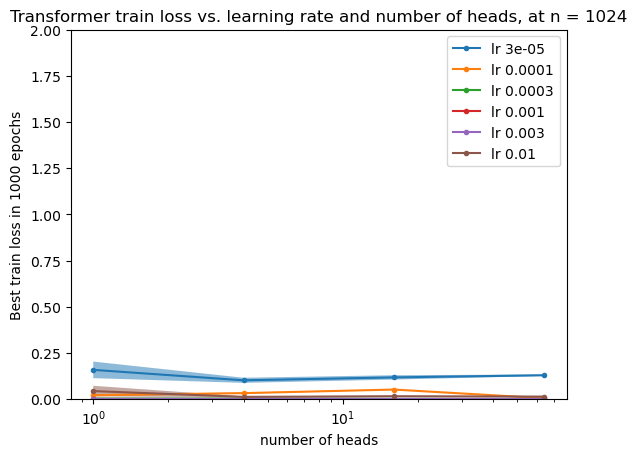

In [32]:
configs = {}
lrs = [3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
n = 1024 # A number of samples where results are not always perfect
num_heads_list = [1, 4, 16, 64]
num_trials = 5
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for num_heads in num_heads_list:
            config = {('logging', 'task_name') : f'assoc_memory_trainsamples{n}_trainsas{n}_lr{lr}_numheads{num_heads}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): num_heads,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(lr, num_heads, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs,lrs,num_heads_list,'lr','number of heads',num_trials)

curr_title = f'Transformer test loss vs. learning rate and number of heads, at n = {n}'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lr_numheads_1_n{n}_gotu.pdf',
                 labely1='Test loss',
                 labelx1 = 'learning rate',
                 
                 title2=curr_title,
                 savefile2=f'figs/transformer_lr_numheads_2_n{n}_gotu.pdf',
                 labely2='Test loss',
                 labelx2 = 'number of heads',
                marker='.')

add_to_plot_config_dict(configs,lrs,num_heads_list,'lr','number of heads',num_trials,config_func=get_best_train)

curr_title = f'Transformer train loss vs. learning rate and number of heads, at n = {n}'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lr_numheads_1_n{n}_train.pdf',
                 labely1='Best train loss in 1000 epochs',
                 labelx1 = 'learning rate',
                 
                 title2=curr_title,
                 savefile2=f'figs/transformer_lr_numheads_2_n{n}_train.pdf',
                 labely2='Best train loss in 1000 epochs',
                 labelx2 = 'number of heads',
                marker='.')

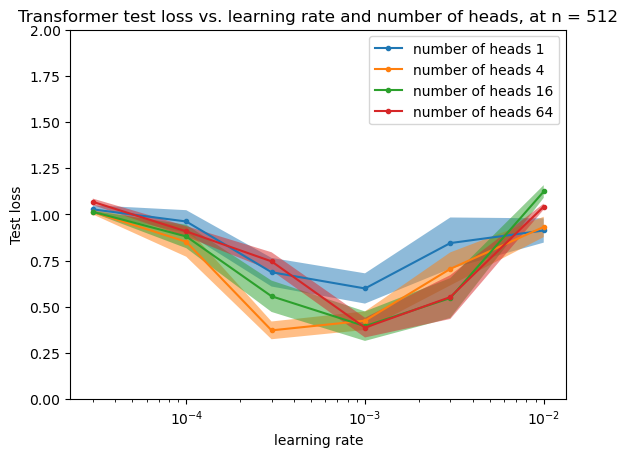

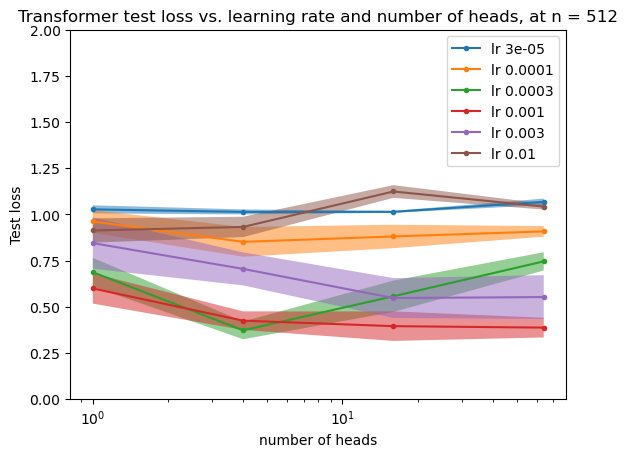

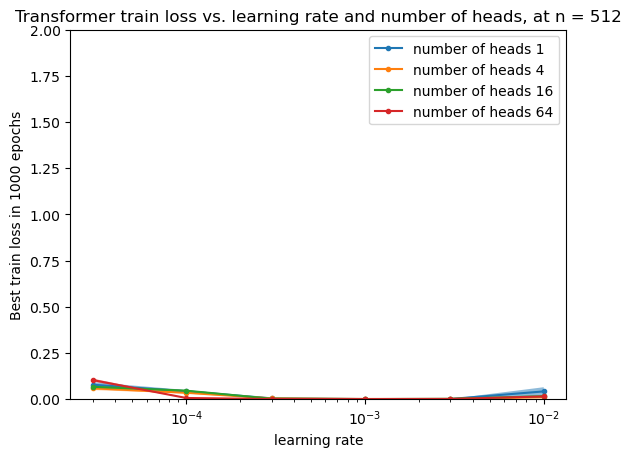

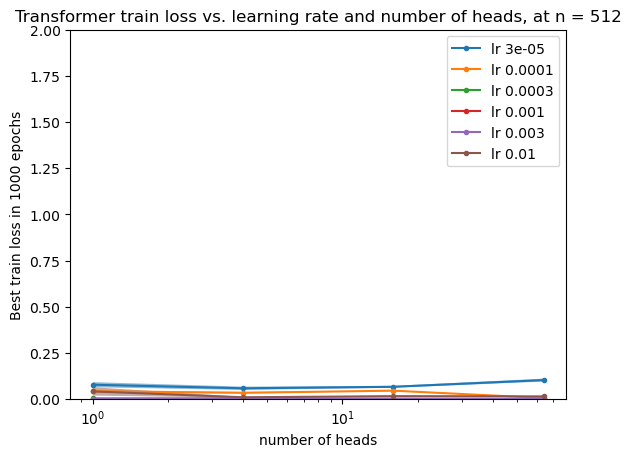

In [33]:
configs = {}
lrs = [3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
n = 512 # A number of samples where results are not always perfect
num_heads_list = [1, 4, 16, 64]
num_trials = 5
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for num_heads in num_heads_list:
            config = {('logging', 'task_name') : f'assoc_memory_trainsamples{n}_trainsas{n}_lr{lr}_numheads{num_heads}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): num_heads,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(lr, num_heads, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs,lrs,num_heads_list,'lr','number of heads',num_trials)

curr_title = f'Transformer test loss vs. learning rate and number of heads, at n = {n}'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lr_numheads_1_n{n}_gotu.pdf',
                 labely1='Test loss',
                 labelx1 = 'learning rate',
                 
                 title2=curr_title,
                 savefile2=f'figs/transformer_lr_numheads_2_n{n}_gotu.pdf',
                 labely2='Test loss',
                 labelx2 = 'number of heads',
                marker='.')

add_to_plot_config_dict(configs,lrs,num_heads_list,'lr','number of heads',num_trials,config_func=get_best_train)

curr_title = f'Transformer train loss vs. learning rate and number of heads, at n = {n}'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lr_numheads_1_n{n}_train.pdf',
                 labely1='Best train loss in 1000 epochs',
                 labelx1 = 'learning rate',
                 
                 title2=curr_title,
                 savefile2=f'figs/transformer_lr_numheads_2_n{n}_train.pdf',
                 labely2='Best train loss in 1000 epochs',
                 labelx2 = 'number of heads',
                marker='.')

#### Grid-search learning rate and embed_dim, associative memory

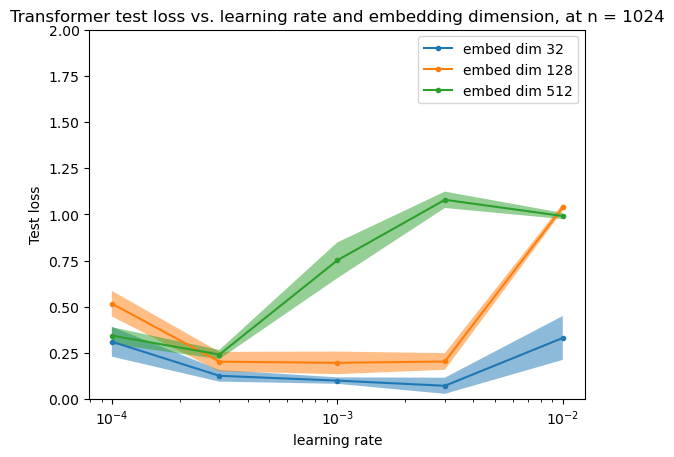

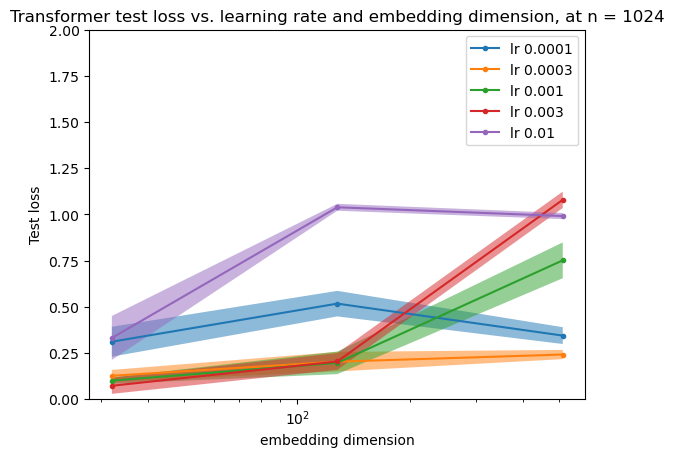

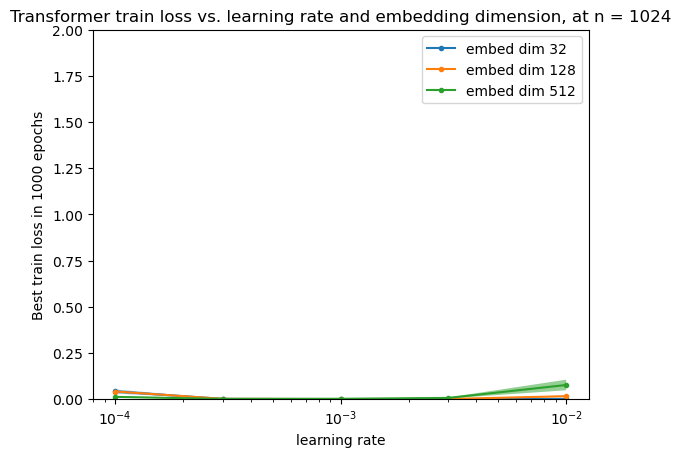

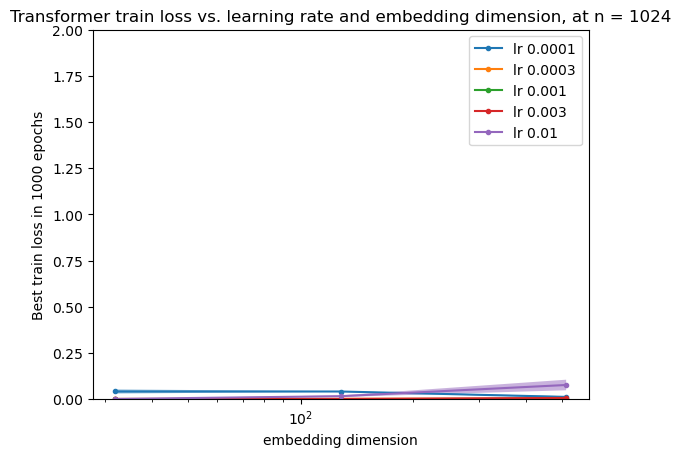

In [34]:
configs = {}
lrs = [1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
n = 1024 # A number of samples where results are not always perfect
embed_dims = [32, 128, 512]
num_trials = 5
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for embed_dim in embed_dims:
            config = {('logging', 'task_name') : f'assoc_memory_trainsamples{n}_trainsas{n}_lr{lr}_embeddims{embed_dim}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): embed_dim,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(lr, embed_dim, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

            
add_to_plot_config_dict(configs,lrs,embed_dims,'lr','embed dim',num_trials)

curr_title = f'Transformer test loss vs. learning rate and embedding dimension, at n = {n}'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lr_embeddim_1_n{n}_gotu.pdf',
                 labely1='Test loss',
                 labelx1 = 'learning rate',
                 
                 title2=curr_title,
                 savefile2=f'figs/transformer_lr_embeddim_2_n{n}_gotu.pdf',
                 labely2='Test loss',
                 labelx2 = 'embedding dimension',
                marker='.')

add_to_plot_config_dict(configs,lrs,embed_dims,'lr','embed dim',num_trials,config_func=get_best_train)

curr_title = f'Transformer train loss vs. learning rate and embedding dimension, at n = {n}'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lr_embeddim_1_n{n}_train.pdf',
                 labely1='Best train loss in 1000 epochs',
                 labelx1 = 'learning rate',
                 
                 title2=curr_title,
                 savefile2=f'figs/transformer_lr_embeddim_2_n{n}_train.pdf',
                 labely2='Best train loss in 1000 epochs',
                 labelx2 = 'embedding dimension',
                marker='.')

#### Grid-search learning rate and batch-size, associative memory

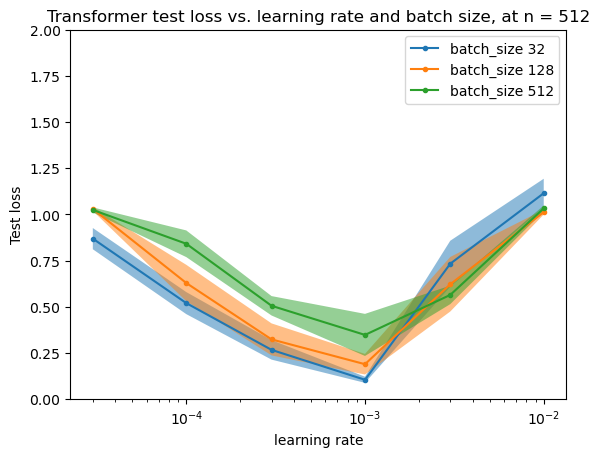

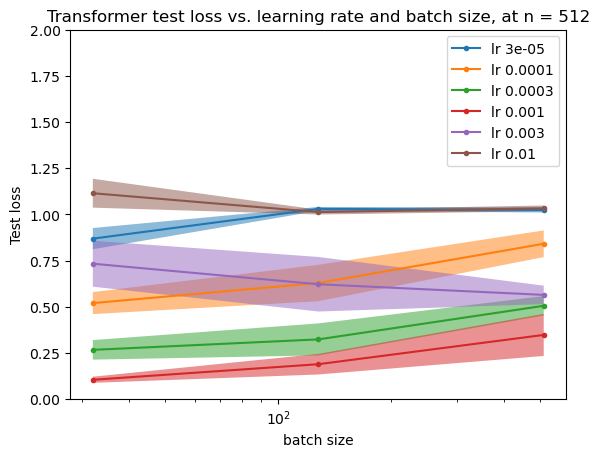

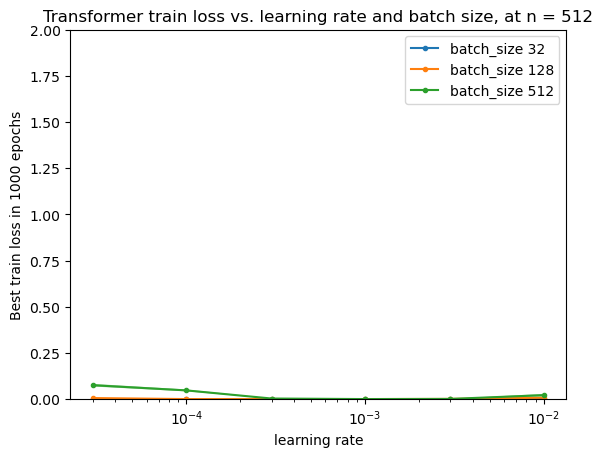

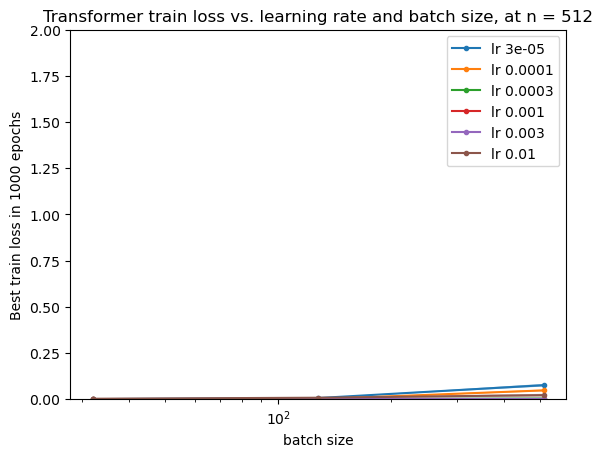

In [37]:
configs = {}
lrs = [3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
n = 512 # A number of samples where results are not always perfect
batch_sizes = [32, 128, 512]
num_trials = 5
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for batch_size in batch_sizes:
            config = {('logging', 'task_name') : f'assoc_memory_trainsamples{n}_trainsas{n}_lr{lr}_batchsize{batch_size}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): batch_size,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(lr, batch_size, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs,lrs,batch_sizes,'lr','batch_size',num_trials)

curr_title = f'Transformer test loss vs. learning rate and batch size, at n = {n}'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lr_batchsize_1_n{n}.pdf',
                 labely1='Test loss',
                 labelx1='learning rate',
                 
                 title2=curr_title,
                 savefile2=f'figs/transformer_lr_batchsize_2_n{n}.pdf',
                 labely2='Test loss',
                 labelx2='batch size',
                 marker ='.')

add_to_plot_config_dict(configs,lrs,batch_sizes,'lr','batch_size',num_trials,config_func=get_best_train)

curr_title = f'Transformer train loss vs. learning rate and batch size, at n = {n}'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lr_batchsize_1_n{n}_train.pdf',
                 labely1='Best train loss in 1000 epochs',
                 labelx1 = 'learning rate',
                 
                 title2=curr_title,
                 savefile2=f'figs/transformer_lr_batchsize_2_n{n}_train.pdf',
                 labely2='Best train loss in 1000 epochs',
                 labelx2 = 'batch size',
                 marker='.')

#### LR vs. n for smaller batch-size

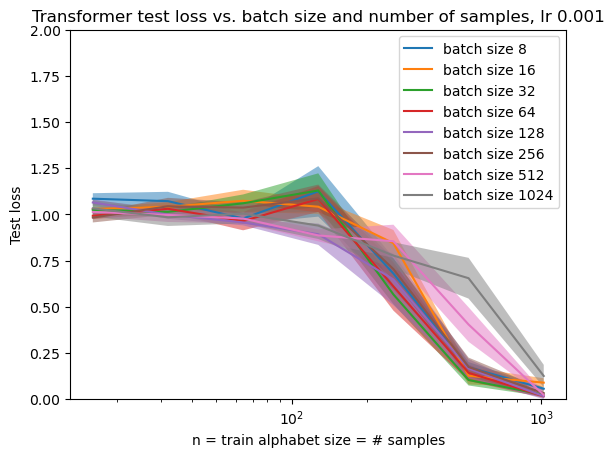

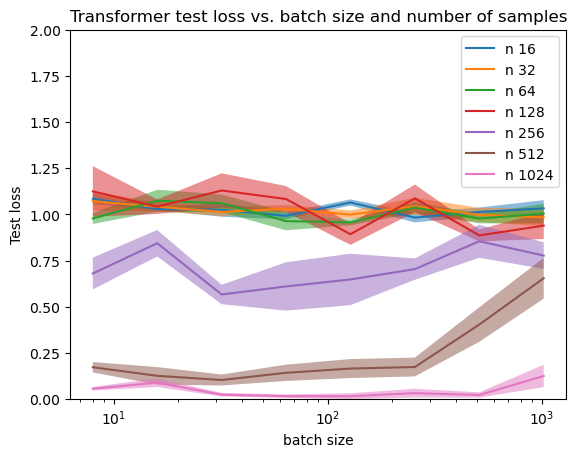

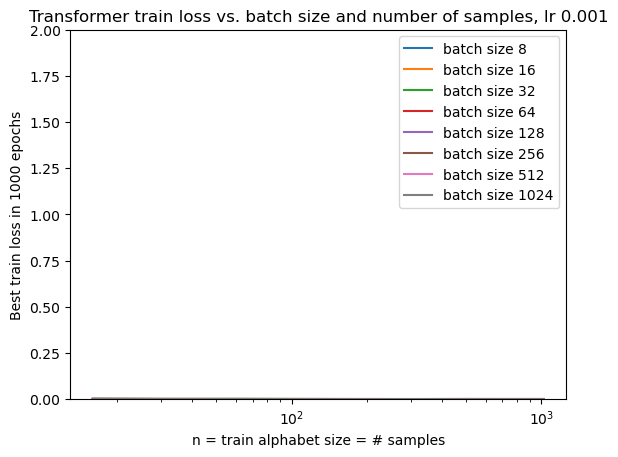

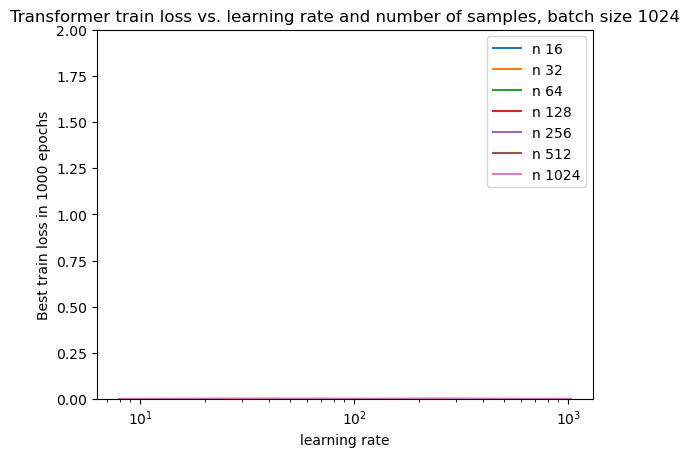

In [36]:

lr = 1e-3
ns = [16, 32, 64, 128, 256, 512, 1024]
num_trials = 5
lrs.sort()
batch_sizes = [8, 16, 32, 64, 128, 256, 512, 1024]
configs = {}
for trialnum in range(num_trials):
    for batch_size in batch_sizes:
        for n in ns:
            batchsize_str = ''
            if batch_size != 1024:
                batchsize_str = f'batchsize{batch_size}_'
            config = {('logging', 'task_name') : f'assoc_memory_{n}trainsamples_{n}trainsas_lr{lr}_{batchsize_str}trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): batch_size,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, batch_size, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs, ns, batch_sizes, f'n', f'batch size', num_trials, logscale1=True, logscale2=True)

plot_config_dict(title1=f'Transformer test loss vs. batch size and number of samples, lr {lr}',
                 labelx1='n = train alphabet size = # samples', savefile1='figs/transformer_batchsize_n_1_gotu.pdf',
                 labely1='Test loss',

                 title2=f'Transformer test loss vs. batch size and number of samples',
                 labelx2='batch size', savefile2='figs/transformer_batchsize_n_2_gotu.pdf',
                 labely2='Test loss',)

add_to_plot_config_dict(configs, ns, batch_sizes, 'n', 'batch size', num_trials, logscale1=True, logscale2=True, config_func=get_best_train)
plot_config_dict(title1 = f'Transformer train loss vs. batch size and number of samples, lr {lr}',
                labelx1='n = train alphabet size = # samples', savefile1='figs/transformer_batchsize_n_1_train.pdf',
                labely1='Best train loss in 1000 epochs',

                title2 = f'Transformer train loss vs. learning rate and number of samples, batch size {batch_size}',
                labelx2='learning rate', savefile2='figs/transformer_batchsize_n_2_train.pdf',
                labely2='Best train loss in 1000 epochs',)

## Effect of complexity of template-matching task

### Compare various ad hoc tasks

#### Associative memory task (ABA vs. ABB)

In [38]:
def task_add_assoc_memory_abridged(config_func=get_test_at_best_val):
    configs = {}
    lrs = [1e-3]
    # ns = [16, 64, 256, 1024, 4096] # , 8192
    ns = [8, 32, 128, 512, 2048, 8192]
    num_trials = 5
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', 'ABA vs. ABB, lr', num_trials, logscale1=True, logscale2=True,config_func=config_func)

#### AABB vs. ABAB task

In [39]:
def task_add_aabb_vs_abab(config_func=get_test_at_best_val):
    configs = {}
    lrs = [1e-3]
    # ns = [16, 64, 256, 1024, 4096] # , 8192
    ns = [8, 32, 128, 512, 2048, 8192]
    num_trials = 5
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'aabb_vs_abab_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['AABB', 'ABAB'],
                          ('data', 'wildcards'): 'AB',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', 'AABB vs. ABAB, lr', num_trials, logscale1=True, logscale2=True, config_func=config_func)

#### Majority vote task, abridged

In [40]:
def task_add_majority_abridged(config_func=get_test_at_best_val):
    lrs = [1e-3]
    # ns = [16, 64, 256, 1024, 4096] # , 8192
    ns = [8, 32, 128, 512, 2048, 8192]
    num_trials = 5
    lrs.sort()

    for majority_len in [2,4,6,8]:
        configs = {}
        for trialnum in range(num_trials):
            for lr in lrs:
                for n in ns:
                    templates = [''.join(x) for x in itertools.product(['#','?'],repeat=majority_len) if x[0] == '#']
                    template_labels = [1 if x.count('#') > x.count('?') else -1 for x in templates]
                    n_templ = len(templates)
                    config = {('logging', 'task_name') : f'majority{majority_len}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                              ('data', 'templates'): templates,
                              ('data', 'wildcards'): '#?',
                              ('data', 'template_probs'): [1/n_templ for i in range(n_templ)],
                              ('data', 'template_labels'): template_labels,
                              ('data', 'label_type'): 'regression',

                              ('data', 'num_train_samples'): n,
                              ('data', 'train_substitution_alphabet_size') : n,
                              ('data', 'num_val_samples'): 100,
                              ('data', 'val_substitution_alphabet_size') : 100,
                              ('data', 'num_test_samples'): 100,
                              ('data', 'test_substitution_alphabet_size') : 100,

                              ('training', 'lr'): lr,
                              ('training', 'epochs'): 1000,
                              ('training', 'lr_peak_epoch'): 5,
                              ('training', 'batch_size'): 1024,
                              ('training', 'momentum'): 0.9,
                              ('training', 'weight_decay'): 0,
                              ('training', 'label_smoothing'): 0.1,
                              ('training', 'num_workers'): 8,
                              ('training', 'warmup_epochs'): 15,
                              ('training', 'eval_cadence'): 1,
                              ('training', 'optimizer'): 'adam',
                              ('training', 'lazy') : False,

                              ('model', 'type'): 'transformer',
                              ('model', 'embed_dim'): 128,
                              ('model', 'depth'): 2,
                              ('model', 'num_heads'): 16,
                              ('model', 'dropout'): 0,
                              ('model', 'attn_mult'): 1.0,
                              ('model', 'alpha') : 1,
                             }
                    configs[(n, lr, trialnum)] = config
                    # # print(config[('logging', 'task_name')])
                    run_experiment_from_config(config, verbose=False)
        add_to_plot_config_dict(configs,ns,lrs,f'n',f'length-{majority_len} majority, lr', num_trials, logscale1=True,logscale2=True, config_func=config_func)

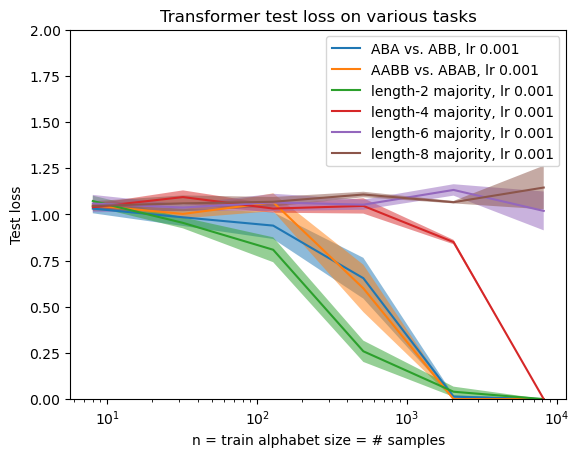

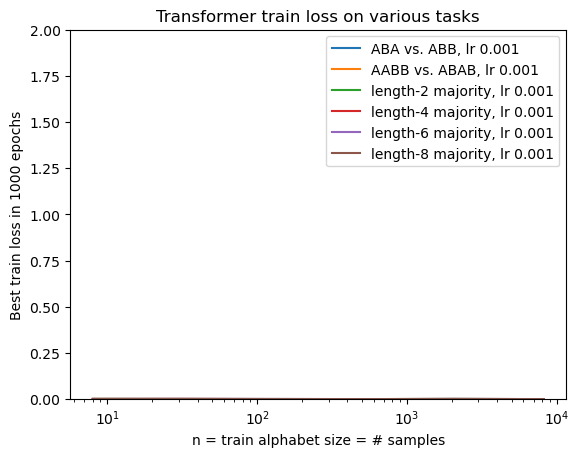

In [41]:
task_add_assoc_memory_abridged()
task_add_aabb_vs_abab()
task_add_majority_abridged()

curr_title = 'Transformer test loss on various tasks'
plot_config_dict(title1=curr_title, title2=curr_title, savefile1=f'figs/various_tasks_1_gotu.pdf',
                labelx1='n = train alphabet size = # samples',
                labely1='Test loss',plot2=False)

task_add_assoc_memory_abridged(get_best_train)
task_add_aabb_vs_abab(get_best_train)
task_add_majority_abridged(get_best_train)

curr_title = 'Transformer train loss on various tasks'
plot_config_dict(title1=curr_title, title2=curr_title, savefile1=f'figs/various_tasks_1_train.pdf',
                labelx1='n = train alphabet size = # samples',
                labely1='Best train loss in 1000 epochs',plot2=False)

#### Random template tasks

In [42]:
def get_random_templates(n_templ, len_templ, W_size, R_size, label_type='regression'):
    R_alpha = 'ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz'
    W_alpha = '!@#$%^&*()'
    assert(R_size < len(R_alpha))
    assert(W_size < len(W_alpha))
    
    alphabet = R_alpha[:R_size] + W_alpha[:W_size]
    
    templates = []
    num_collisions = 10000
    while len(templates) < n_templ:
        curr_templ = ''
        for j in range(len_templ):
            curr_idx = np.random.randint(0,R_size+W_size)
            curr_templ += alphabet[curr_idx]
        templ_equiv = False
        for templ in templates:
            if are_templates_equivalent(curr_templ, templ, W_alpha):
                templ_equiv = True
                break
        if templ_equiv:
            num_collisions -= 1
            if num_collisions < 0:
                assert(False), "Too many collisions while generating"
            continue
        templates.append(curr_templ)
        
    template_probs = [1/n_templ for i in range(n_templ)]
    
    if label_type == 'regression':
        # Choose random labels and then center/normalize them so that a priori the best test error is 1
        v = np.random.rand(n_templ)
        v = v - np.mean(v)
        v = v / math.sqrt(np.mean(v**2))
        # +1, -1 labels
        template_labels = list(v)
    elif label_type == 'multiclass':
        assert(False), "Not yet implemented"
    else:
        assert(False)
        
    return {'templates' : templates,
            'wildcards' : [W_alpha[i] for i in range(W_size)],
            'template_probs' : template_probs,
            'template_labels' : template_labels}

##### 2 random templates, 2 wildcards, increasing length

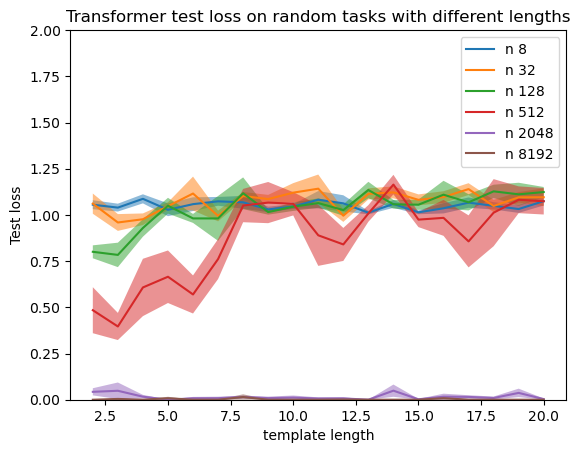

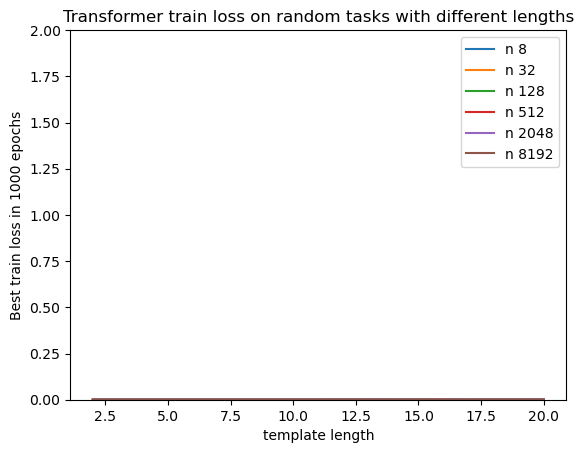

In [43]:
lr = 1e-3
ns = [8, 32, 128, 512, 2048, 8192]
num_trials = 5
lrs.sort()


W_size=2
R_size=0
n_templ=2

# len_templs = [2,3,4,5,6,7,8,9,10,15,20]
len_templs = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
configs = {}

for trialnum in range(num_trials):
    for len_templ in len_templs:
        for n in ns:
            templ_dict = get_random_templates(n_templ=n_templ, len_templ=len_templ, W_size=W_size,R_size=R_size, label_type='regression')
            config = {('logging', 'task_name') : f'random_ntempl{n_templ}_lentempl{len_templ}_W{W_size}_R{R_size}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): templ_dict['templates'],
                      ('data', 'wildcards'): templ_dict['wildcards'],
                      ('data', 'template_probs'): templ_dict['template_probs'],
                      ('data', 'template_labels'): templ_dict['template_labels'],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, len_templ, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs, ns, len_templs, 'n', 'template len', num_trials, logscale1=True, logscale2=False)
curr_title = 'Transformer test loss on random tasks with different lengths'
plot_config_dict(title1=curr_title, title2=curr_title,
                 savefile1=f'figs/randomtemplate_length_1_gotu.pdf',
                 savefile2=f'figs/randomtemplate_length_2_gotu.pdf',
                labelx1='n = train alphabet size = # samples',
                labelx2='template length',
                labely1='Test loss',
                labely2='Test loss',
                # marker='.',
                plot1=False)

add_to_plot_config_dict(configs, ns, len_templs, 'n', 'template len', num_trials, logscale1=True, logscale2=False,config_func=get_best_train)
curr_title = 'Transformer train loss on random tasks with different lengths'
plot_config_dict(title1=curr_title, title2=curr_title,
                 savefile1=f'figs/randomtemplate_length_1_train.pdf',
                 savefile2=f'figs/randomtemplate_length_2_train.pdf',
                labelx1='n = train alphabet size = # samples',
                labelx2='template length',
                labely1='Best train loss in 1000 epochs',
                labely2='Best train loss in 1000 epochs',
                # marker='.',
                plot1=False)

##### Two random templates, fixed length, different number of wildcards

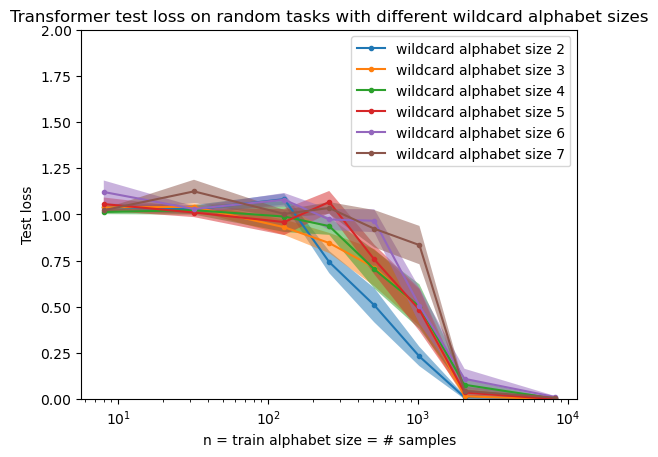

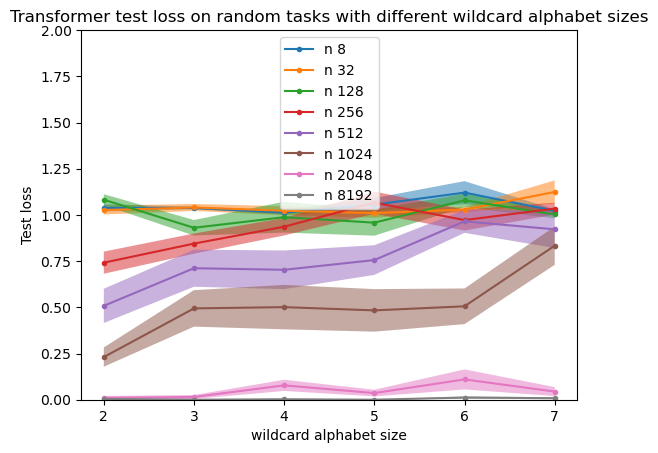

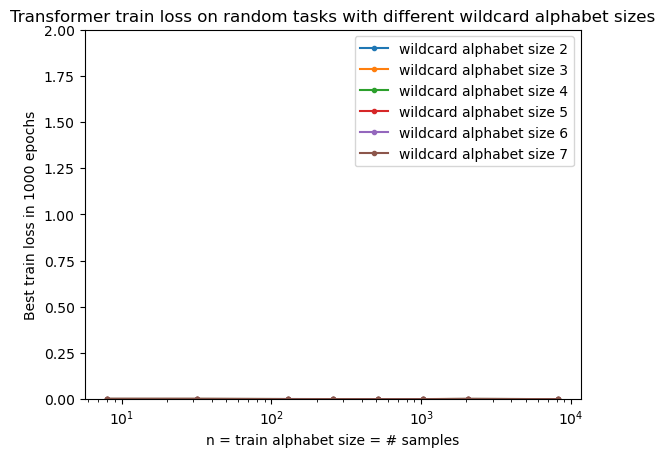

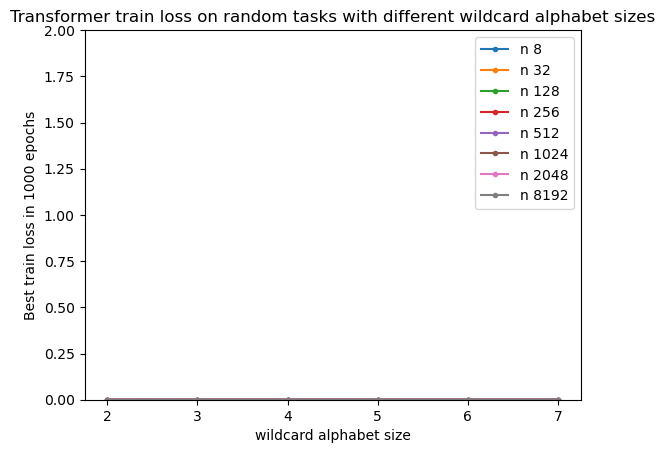

In [44]:
lr = 1e-3
ns = [8, 32, 128, 256, 512, 1024, 2048, 8192]
num_trials = 10
lrs.sort()

R_size=0
n_templ=2
W_sizes = [2,3,4,5,6,7]
len_templ = 5
configs = {}

for trialnum in range(num_trials):
    for W_size in W_sizes:
        for n in ns:
            templ_dict = get_random_templates(n_templ=n_templ, len_templ=len_templ, W_size=W_size,R_size=R_size, label_type='regression')
            config = {('logging', 'task_name') : f'random_ntempl{n_templ}_lentempl{len_templ}_W{W_size}_R{R_size}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): templ_dict['templates'],
                      ('data', 'wildcards'): templ_dict['wildcards'],
                      ('data', 'template_probs'): templ_dict['template_probs'],
                      ('data', 'template_labels'): templ_dict['template_labels'],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, W_size, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs, ns, W_sizes, 'n', 'wildcard alphabet size', num_trials, logscale1=True, logscale2=False)
curr_title = 'Transformer test loss on random tasks with different wildcard alphabet sizes'
plot_config_dict(title1=curr_title, title2=curr_title,
                 savefile1=f'figs/randomtemplate_Wsize_1_gotu.pdf',
                 savefile2=f'figs/randomtemplate_Wsize_2_gotu.pdf',
                labelx1='n = train alphabet size = # samples',
                labelx2='wildcard alphabet size',
                labely1='Test loss',
                labely2='Test loss',
                marker='.')

add_to_plot_config_dict(configs, ns, W_sizes, 'n', 'wildcard alphabet size', num_trials, logscale1=True, logscale2=False,config_func=get_best_train)
curr_title = 'Transformer train loss on random tasks with different wildcard alphabet sizes'
plot_config_dict(title1=curr_title, title2=curr_title,
                 savefile1=f'figs/randomtemplate_Wsize_1_train.pdf',
                 savefile2=f'figs/randomtemplate_Wsize_2_train.pdf',
                labelx1='n = train alphabet size = # samples',
                labelx2='wildcard alphabet size',
                labely1='Best train loss in 1000 epochs',
                labely2='Best train loss in 1000 epochs',
                marker='.')

##### Two templates, 2 wildcard tokens, some regular tokens


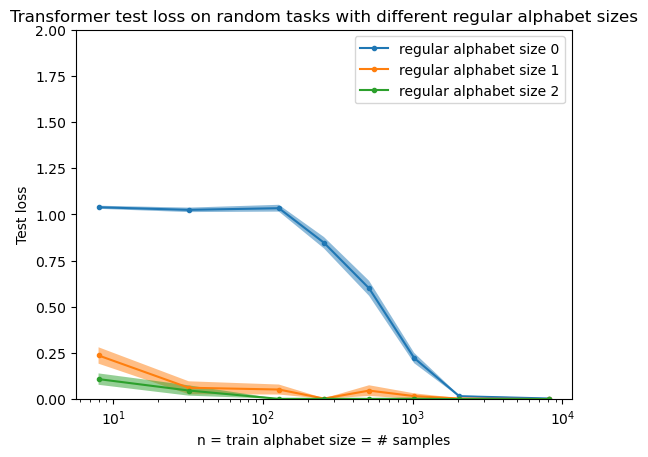

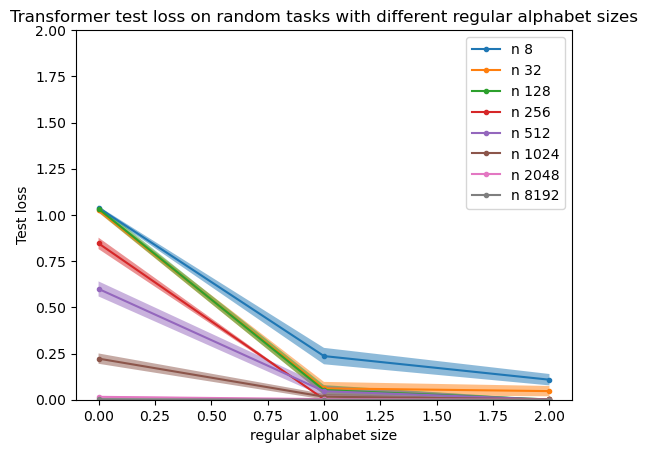

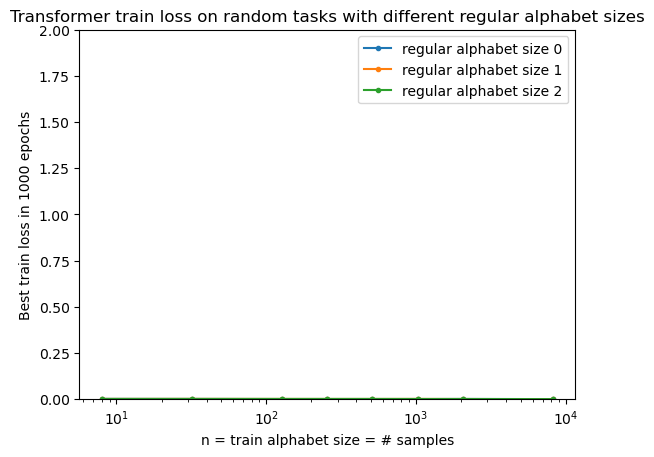

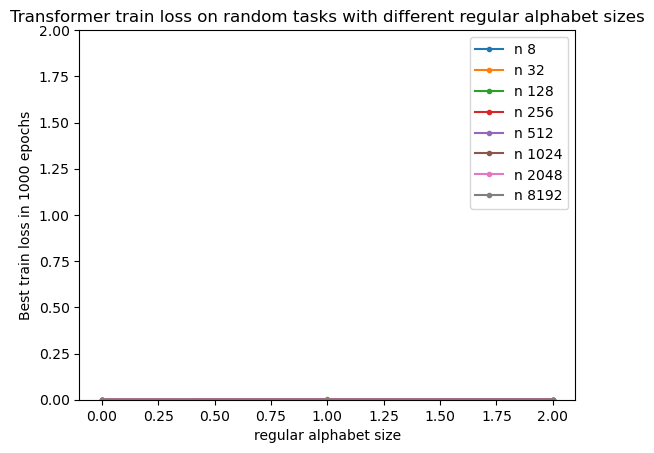

In [45]:
lr = 1e-3
ns = [8, 32, 128, 256, 512, 1024, 2048, 8192]
num_trials = 50
lrs.sort()

R_sizes = [0,1,2]
n_templ=2
W_size=2
len_templ = 5
configs = {}

for trialnum in range(num_trials):
    for R_size in R_sizes:
        for n in ns:
            templ_dict = get_random_templates(n_templ=n_templ, len_templ=len_templ, W_size=W_size,R_size=R_size, label_type='regression')
            config = {('logging', 'task_name') : f'random_ntempl{n_templ}_lentempl{len_templ}_W{W_size}_R{R_size}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): templ_dict['templates'],
                      ('data', 'wildcards'): templ_dict['wildcards'],
                      ('data', 'template_probs'): templ_dict['template_probs'],
                      ('data', 'template_labels'): templ_dict['template_labels'],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, R_size, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs, ns, R_sizes, 'n', 'regular alphabet size', num_trials, logscale1=True, logscale2=False)
curr_title = 'Transformer test loss on random tasks with different regular alphabet sizes'
plot_config_dict(title1=curr_title, title2=curr_title,
                 savefile1=f'figs/randomtemplate_Rsize_1_gotu.pdf',
                 savefile2=f'figs/randomtemplate_Rsize_2_gotu.pdf',
                labelx1='n = train alphabet size = # samples',
                labelx2='regular alphabet size',
                labely1='Test loss',
                labely2='Test loss',
                marker='.')

add_to_plot_config_dict(configs, ns, R_sizes, 'n', 'regular alphabet size', num_trials, logscale1=True, logscale2=False,config_func=get_best_train)
curr_title = 'Transformer train loss on random tasks with different regular alphabet sizes'
plot_config_dict(title1=curr_title, title2=curr_title,
                 savefile1=f'figs/randomtemplate_Rsize_1_train.pdf',
                 savefile2=f'figs/randomtemplate_Rsize_2_train.pdf',
                labelx1='n = train alphabet size = # samples',
                labelx2='regular alphabet size',
                labely1='Best train loss in 1000 epochs',
                labely2='Best train loss in 1000 epochs',
                marker='.')

##### Growing number of templates, 2 wildcard tokens

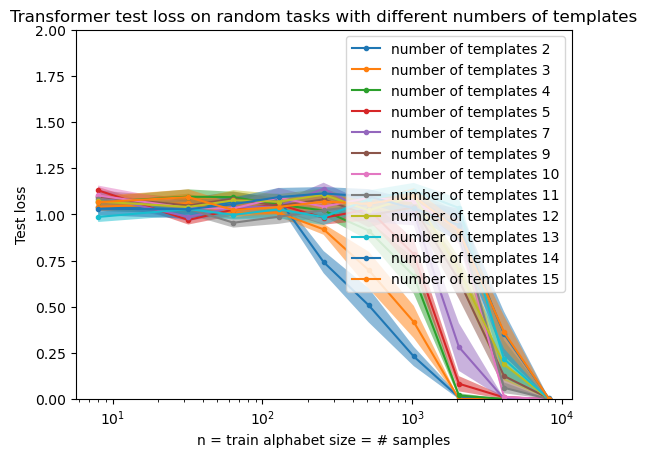

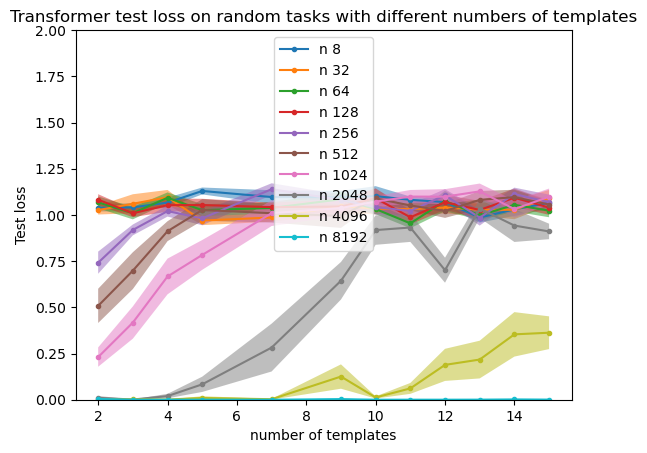

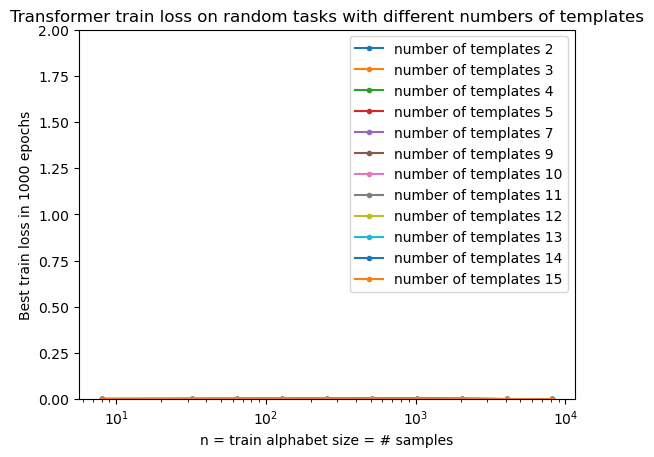

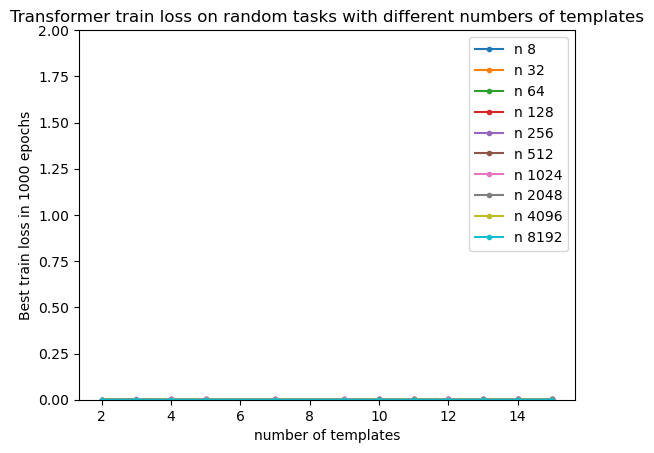

In [46]:
lr = 1e-3
ns = [8, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
num_trials = 10
lrs.sort()

R_size = 0
# n_templs=[2,3,4,5,7,10,15] # ,9, 11,
n_templs=[2,3,4,5,7,9,10,11,12,13,14,15]
W_size=2
len_templ = 5
configs = {}

for trialnum in range(num_trials):
    for n_templ in n_templs:
        for n in ns:
            templ_dict = get_random_templates(n_templ=n_templ, len_templ=len_templ, W_size=W_size,R_size=R_size, label_type='regression')
            config = {('logging', 'task_name') : f'random_ntempl{n_templ}_lentempl{len_templ}_W{W_size}_R{R_size}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): templ_dict['templates'],
                      ('data', 'wildcards'): templ_dict['wildcards'],
                      ('data', 'template_probs'): templ_dict['template_probs'],
                      ('data', 'template_labels'): templ_dict['template_labels'],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'lr_peak_epoch'): 5,
                      ('training', 'batch_size'): 1024,
                      ('training', 'momentum'): 0.9,
                      ('training', 'weight_decay'): 0,
                      ('training', 'label_smoothing'): 0.1,
                      ('training', 'num_workers'): 8,
                      ('training', 'warmup_epochs'): 15,
                      ('training', 'eval_cadence'): 1,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, n_templ, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs, ns, n_templs, 'n', 'number of templates', num_trials, logscale1=True, logscale2=False)
curr_title = 'Transformer test loss on random tasks with different numbers of templates'
plot_config_dict(title1=curr_title, title2=curr_title,
                 savefile1=f'figs/randomtemplate_ntempl_1_gotu.pdf',
                 savefile2=f'figs/randomtemplate_ntempl_2_gotu.pdf',
                labelx1='n = train alphabet size = # samples',
                labelx2='number of templates',
                labely1='Test loss',
                labely2='Test loss',
                marker='.')

add_to_plot_config_dict(configs, ns, n_templs, 'n', 'number of templates', num_trials, logscale1=True, logscale2=False,config_func=get_best_train)
curr_title = 'Transformer train loss on random tasks with different numbers of templates'
plot_config_dict(title1=curr_title, title2=curr_title,
                 savefile1=f'figs/randomtemplate_ntempl_1_train.pdf',
                 savefile2=f'figs/randomtemplate_ntempl_2_train.pdf',
                labelx1='n = train alphabet size = # samples',
                labelx2='number of templates',
                labely1='Best train loss in 1000 epochs',
                labely2='Best train loss in 1000 epochs',
                marker='.')

#### Majority vote task, full runs

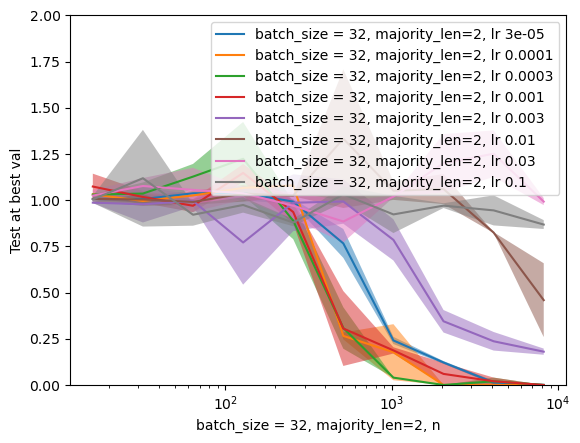

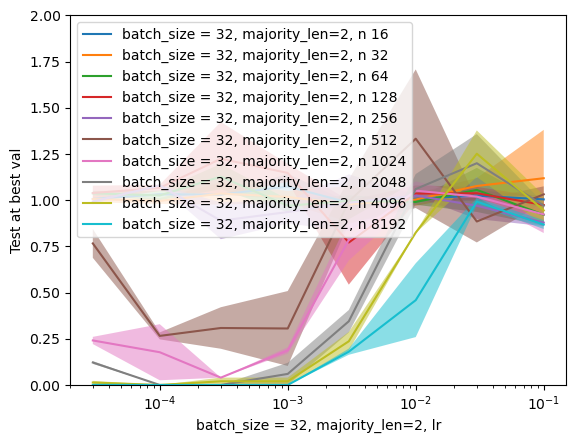

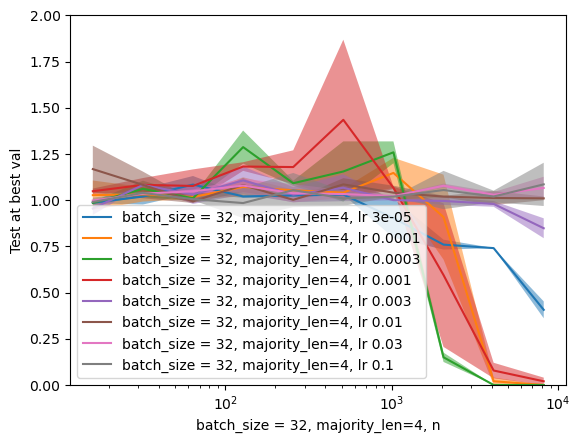

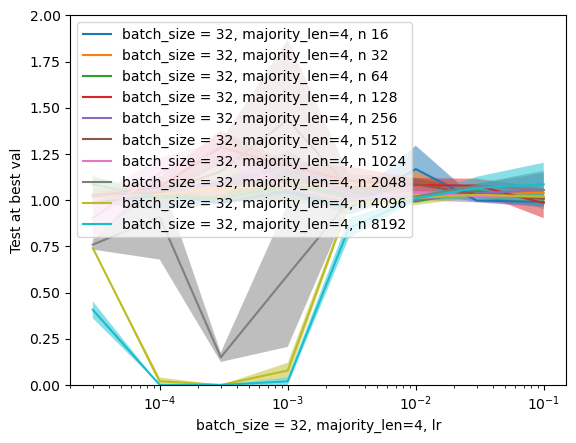

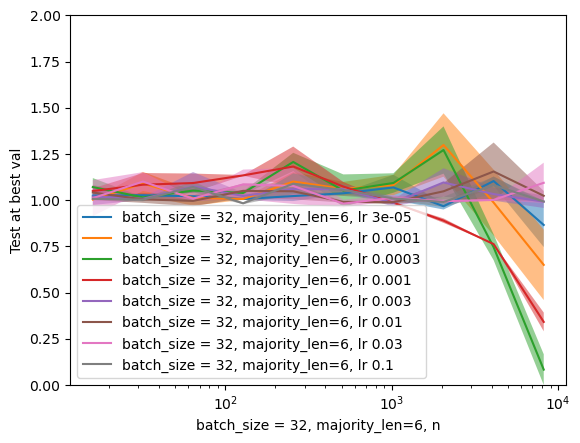

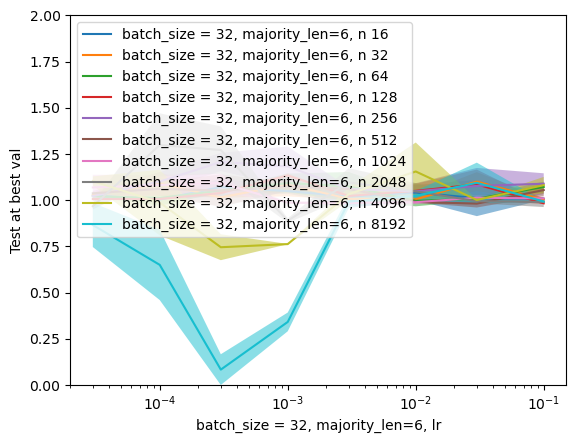

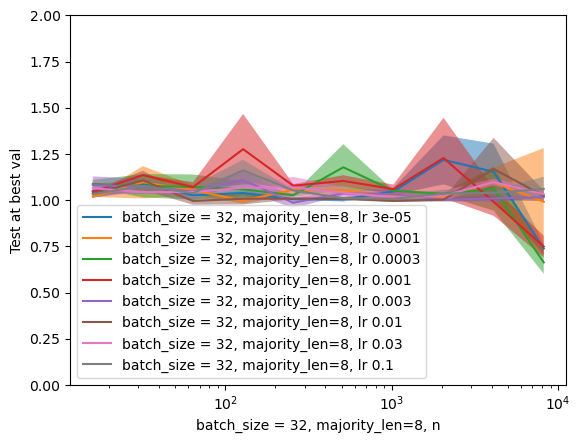

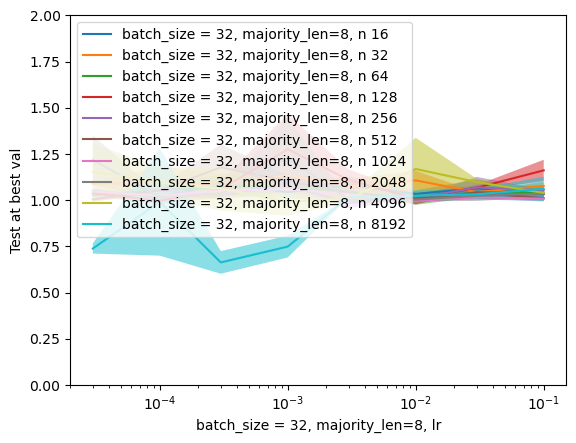

In [47]:
lrs = [3e-5, 1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
ns = [16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
num_trials = 2
lrs.sort()
batch_size = 32

for majority_len in [2,4,6,8]:
    configs = {}
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                templates = [''.join(x) for x in itertools.product(['#','?'],repeat=majority_len) if x[0] == '#']
                template_labels = [1 if x.count('#') > x.count('?') else -1 for x in templates]
                n_templ = len(templates)
                config = {('logging', 'task_name') : f'majority{majority_len}_trainsamples{n}_trainsas{n}_lr{lr}_batchsize{batch_size}_trial{trialnum}',
                          ('data', 'templates'): templates,
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [1/n_templ for i in range(n_templ)],
                          ('data', 'template_labels'): template_labels,
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): batch_size,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                         }
                configs[(n, lr, trialnum)] = config
                # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    clear_plot_config_dict()
    add_to_plot_config_dict(configs,ns,lrs,f'batch_size = {batch_size}, majority_len={majority_len}, n',f'batch_size = {batch_size}, majority_len={majority_len}, lr', num_trials, logscale1=True,logscale2=True)
    plot_config_dict()


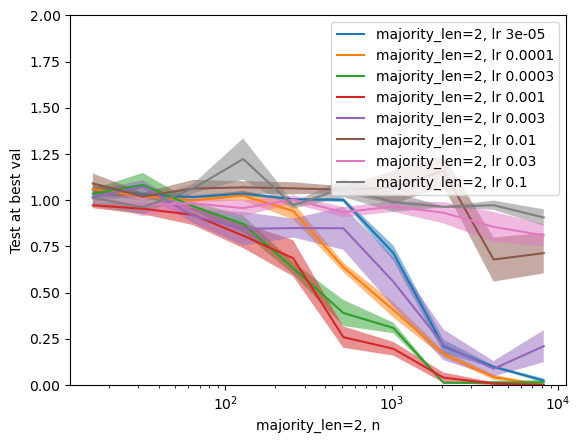

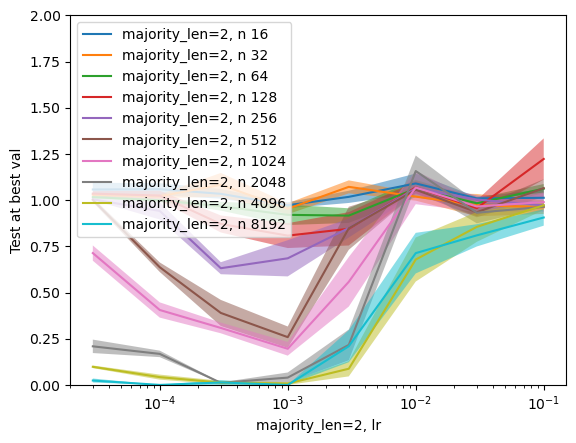

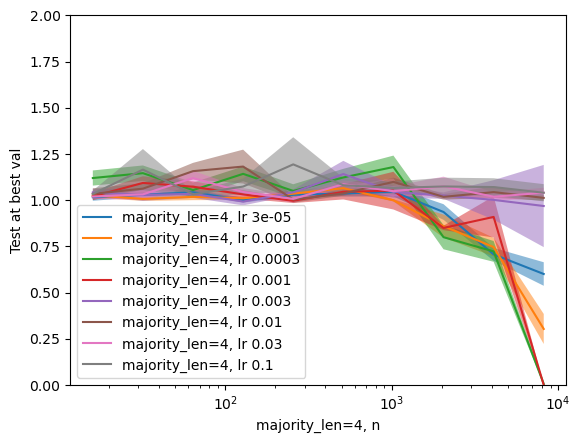

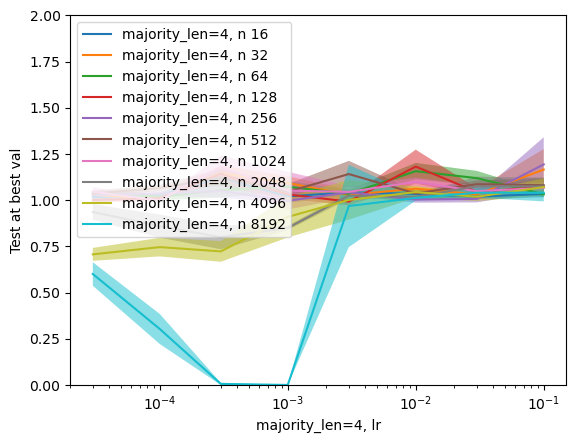

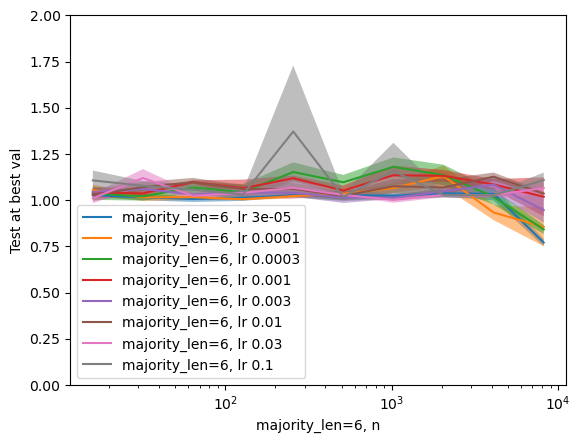

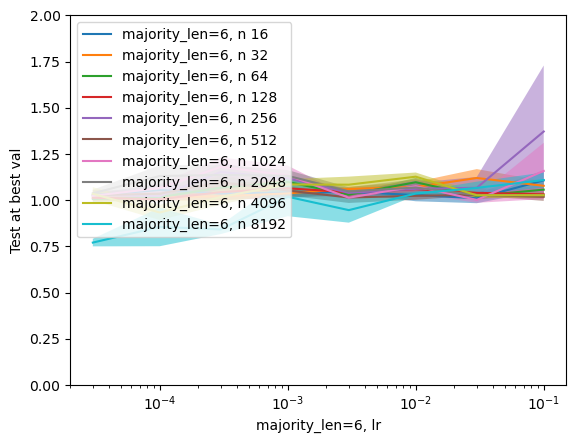

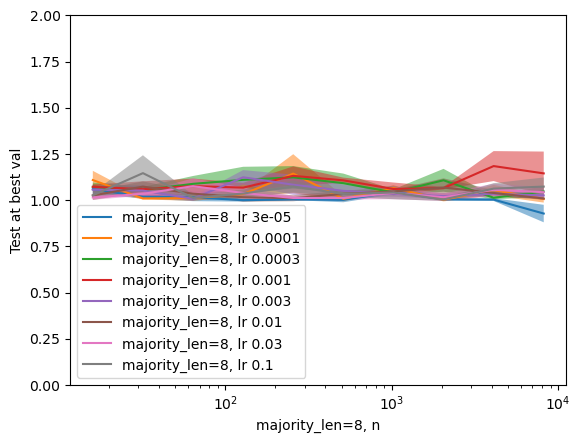

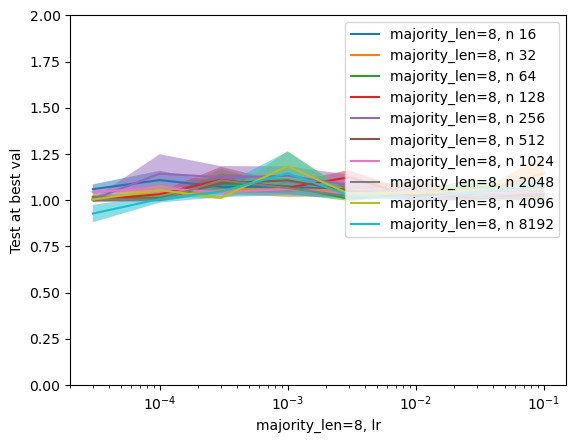

In [48]:
lrs = [3e-5, 1e-3, 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4]
ns = [16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
num_trials = 5
lrs.sort()

for majority_len in [2,4,6,8]:
    configs = {}
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                templates = [''.join(x) for x in itertools.product(['#','?'],repeat=majority_len) if x[0] == '#']
                template_labels = [1 if x.count('#') > x.count('?') else -1 for x in templates]
                n_templ = len(templates)
                config = {('logging', 'task_name') : f'majority{majority_len}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): templates,
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [1/n_templ for i in range(n_templ)],
                          ('data', 'template_labels'): template_labels,
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    clear_plot_config_dict()
    add_to_plot_config_dict(configs,ns,lrs,f'majority_len={majority_len}, n',f'majority_len={majority_len}, lr', num_trials, logscale1=True,logscale2=True)
    plot_config_dict()


## Effect of inductive bias of model

### Other model types

#### Transformer

In [49]:
def task_add_assoc_memory_transformer_abridged(config_func=get_test_at_best_val,lrs=None, num_trials=5, task_label_name=None):
    configs = {}
    if lrs is None:
        lrs = [1e-3, 1e-4, 1e-2]
    ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    if task_label_name is None:
        task_label_name = ''
    else:
        task_label_name = task_label_name + ', '
    add_to_plot_config_dict(configs, ns, lrs, f'{task_label_name}n', f'{task_label_name}lr', num_trials, logscale1=True, logscale2=True,config_func=config_func)

#### Mimetically-initialized transformer

In [50]:
def task_add_assoc_memory_transformer_mimetic_abridged(config_func=get_test_at_best_val,mim_alpha=1, mim_beta=1, lrs=None, num_trials=5,task_label_name=None):
    configs = {}
    if lrs is None:
        lrs = [1e-3] # 1e-3, 1e-4, 1e-2
    ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    mim_alpha = mim_alpha
    mim_beta = mim_beta
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_mimalpha{mim_alpha}_mimbeta{mim_beta}_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'mimetic_init_kq') : True,
                          ('model', 'mimetic_init_kq_alpha') : mim_alpha,
                          ('model', 'mimetic_init_kq_beta') : mim_beta,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    if task_label_name is None:
        task_label_name = f'mimetic{mim_alpha,mim_beta}'
    add_to_plot_config_dict(configs, ns, lrs, f'{task_label_name}, n', f'{task_label_name}, lr', num_trials, logscale1=True, logscale2=True,config_func=config_func)

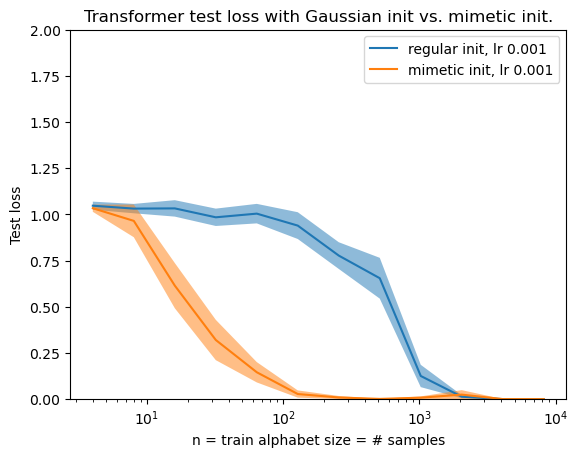

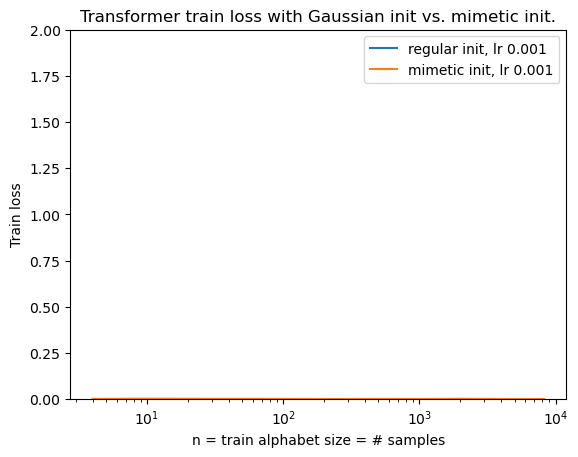

In [51]:
task_add_assoc_memory_transformer_abridged(lrs=[1e-3],num_trials=5, task_label_name='regular init')
task_add_assoc_memory_transformer_mimetic_abridged(mim_alpha=1.0,mim_beta=1.0,num_trials=5,task_label_name='mimetic init')
plot_config_dict(title1='Transformer test loss with Gaussian init vs. mimetic init.',
                 labelx1='n = train alphabet size = # samples',plot2=False,
                 labely1='Test loss',
                savefile1='figs/transformer_mimetic_n_gotu.pdf')

task_add_assoc_memory_transformer_abridged(lrs=[1e-3],num_trials=5,config_func=get_best_train, task_label_name='regular init')
task_add_assoc_memory_transformer_mimetic_abridged(mim_alpha=1.0,mim_beta=1.0,num_trials=5,config_func=get_best_train, task_label_name='mimetic init')
plot_config_dict(title1='Transformer train loss with Gaussian init vs. mimetic init.',
                 labelx1='n = train alphabet size = # samples',plot2=False,
                 labely1='Train loss',
                savefile1='figs/transformer_mimetic_n_train.pdf')

#### Transformer with trainable identity scalings per-head

In [52]:
def task_add_assoc_memory_transformer_trainid(wkwq_id_mult=0,wvwo_id_mult=0,config_func=get_test_at_best_val,lrs=None,num_trials=None,task_label_name=None):
    configs = {}
    if lrs is None:
        lrs = [1e-4, 1e-3] # , , 1e-2
    ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    if num_trials is None:
        num_trials = 5
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                vo_str = ''
                kq_str = ''
                trainable_wkwq_identity = False
                trainable_wvwo_identity = False
                if wkwq_id_mult != 0:
                    kq_str = f'_wkwqmult{wkwq_id_mult}'
                    trainable_wkwq_identity = True
                if wvwo_id_mult != 0:
                    vo_str = f'_wvwomult{wvwo_id_mult}'
                    trainable_wvwo_identity = True
                    
                config = {('logging', 'task_name') : f'assoc_memory{vo_str}{kq_str}_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : trainable_wvwo_identity,
                          ('model', 'wvwo_id_mult') : wvwo_id_mult,
                          ('model', 'trainable_wkwq_identity') : trainable_wkwq_identity,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    if task_label_name is None:
        desc_str = ''
        if wkwq_id_mult != 0:
            desc_str += f'KQ id mult {wkwq_id_mult}'
            if wvwo_id_mult != 0:
                desc_str += ', '
        if wvwo_id_mult != 0:
            desc_str += f'VO id mult {wvwo_id_mult}'
        if len(desc_str) > 0:
            desc_str += ', '
        desc_str = f'KQ {wkwq_id_mult}, VO {wvwo_id_mult}, '
    else:
        desc_str = task_label_name + ', '
    add_to_plot_config_dict(configs, ns, lrs, f'{desc_str}n', f'{desc_str}lr', num_trials, logscale1=True, logscale2=True, config_func=config_func)

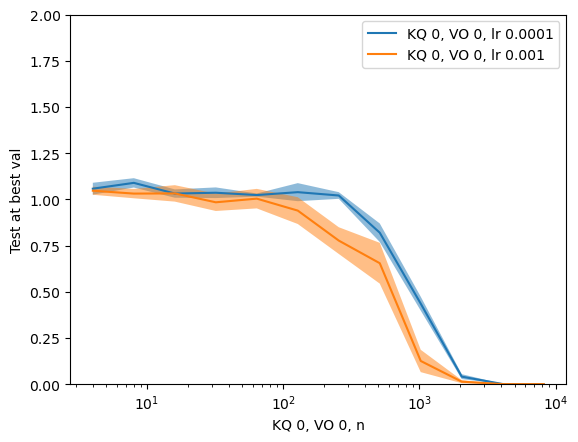

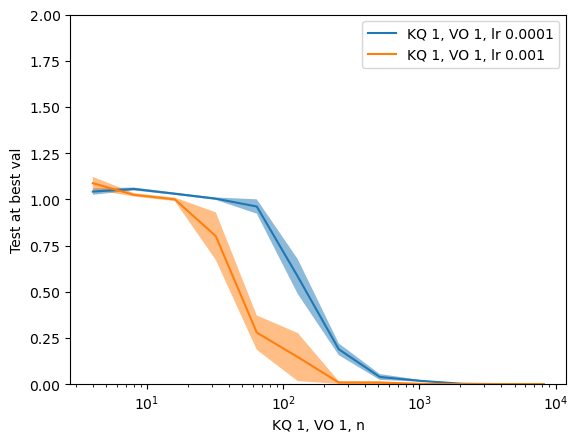

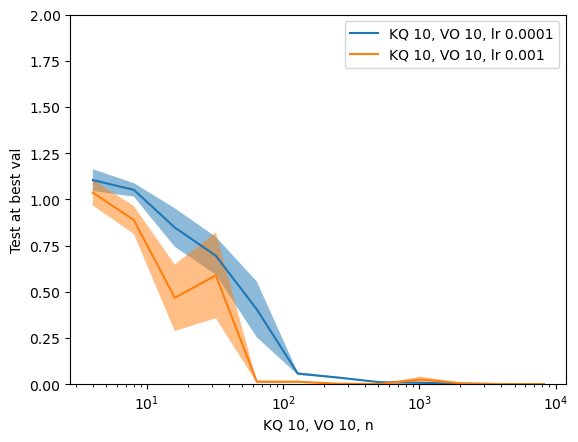

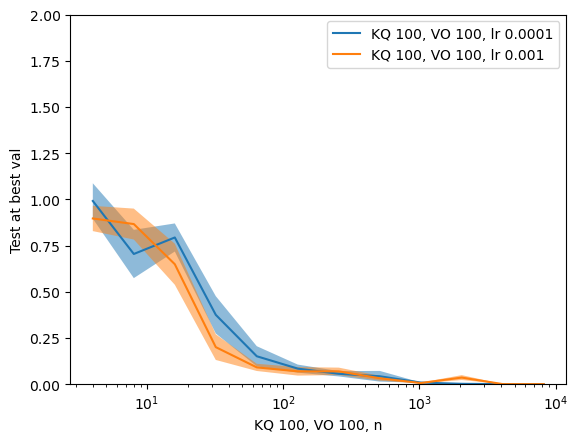

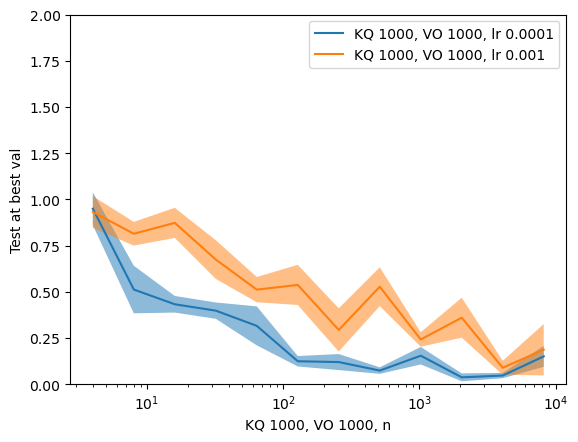

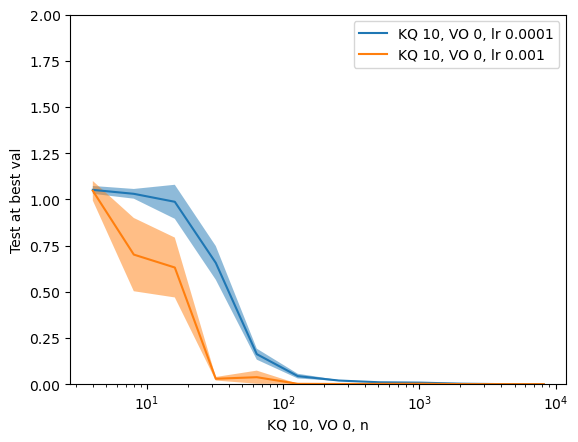

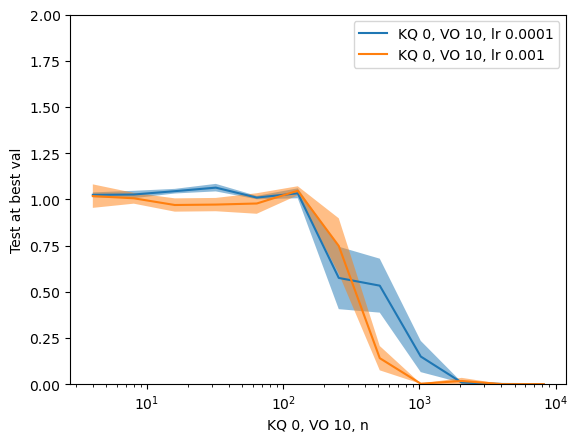

In [53]:
# Plot so that we can figure out best learning rate in each case (1e-3 or 1e-4)
for mult in [0,1,10,100,1000]:
    task_add_assoc_memory_transformer_trainid(wkwq_id_mult=mult,wvwo_id_mult=mult)
    plot_config_dict(plot2=False)
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=10,wvwo_id_mult=0)
plot_config_dict(plot2=False)
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=0,wvwo_id_mult=10)
plot_config_dict(plot2=False)

In [54]:
num_trials=10

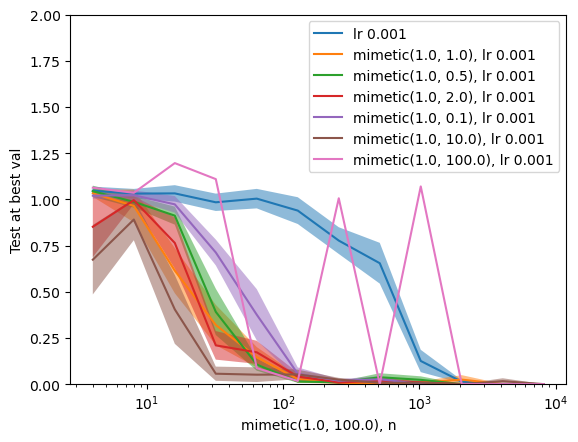

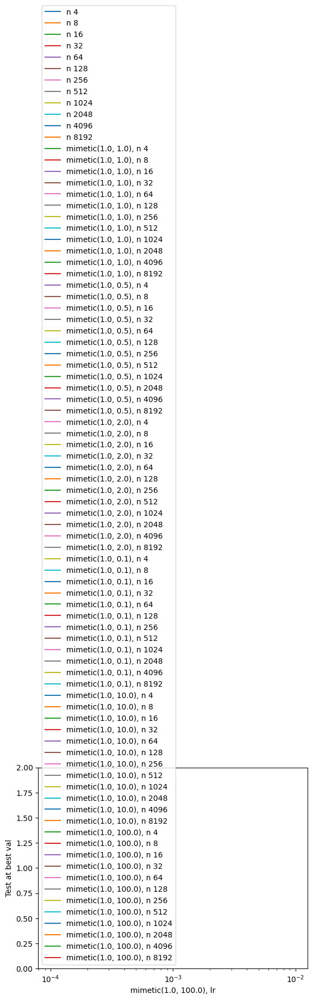

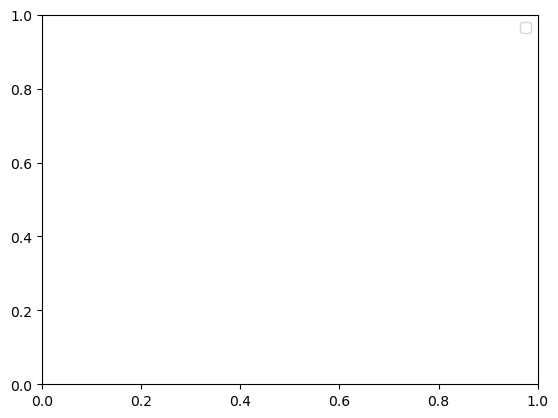

In [55]:
# Plot so that we can figure out best learning rate in each case (1e-3 or 1e-4)
clear_plot_config_dict()
task_add_assoc_memory_transformer_abridged(lrs=[1e-3])
task_add_assoc_memory_transformer_mimetic_abridged(mim_alpha=1.0,mim_beta=1.0,num_trials=5)
task_add_assoc_memory_transformer_mimetic_abridged(mim_alpha=1.0,mim_beta=0.5,num_trials=5)
task_add_assoc_memory_transformer_mimetic_abridged(mim_alpha=1.0,mim_beta=2.0,num_trials=5)
task_add_assoc_memory_transformer_mimetic_abridged(mim_alpha=1.0,mim_beta=0.1,num_trials=5)
task_add_assoc_memory_transformer_mimetic_abridged(mim_alpha=1.0,mim_beta=10.0,num_trials=5)
task_add_assoc_memory_transformer_mimetic_abridged(mim_alpha=1.0,mim_beta=100.0,num_trials=1)
plot_config_dict()
plot_config_dict(plot2=False)

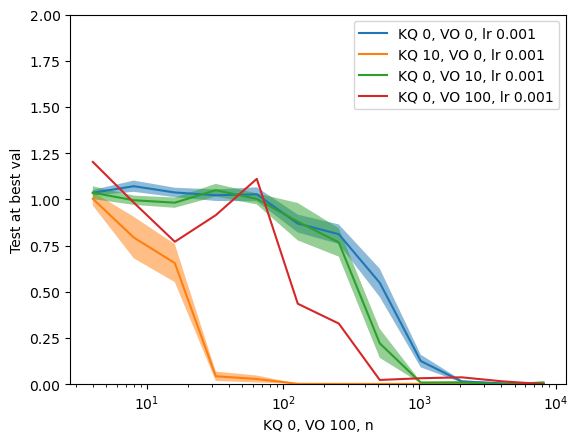

In [56]:
clear_plot_config_dict()
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=0,wvwo_id_mult=0,lrs=[1e-3],num_trials=10)
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=10,wvwo_id_mult=0,lrs=[1e-3],num_trials=10)
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=0,wvwo_id_mult=10,lrs=[1e-3],num_trials=10)
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=0,wvwo_id_mult=100,lrs=[1e-3],num_trials=1)
plot_config_dict(plot2=False)

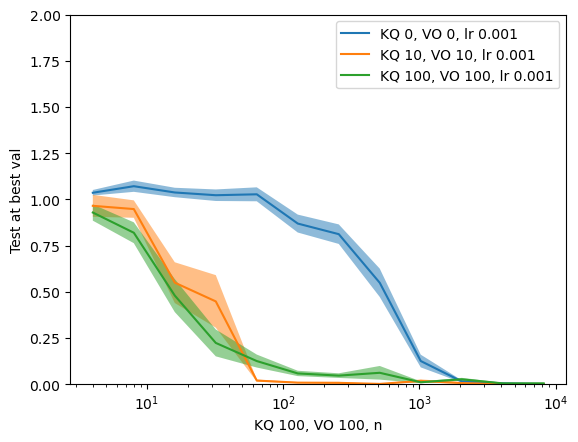

In [57]:
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=0,wvwo_id_mult=0,lrs=[1e-3],num_trials=num_trials)
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=10,wvwo_id_mult=10,lrs=[1e-3],num_trials=num_trials)
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=100,wvwo_id_mult=100,lrs=[1e-3],num_trials=num_trials)
plot_config_dict(plot2=False)

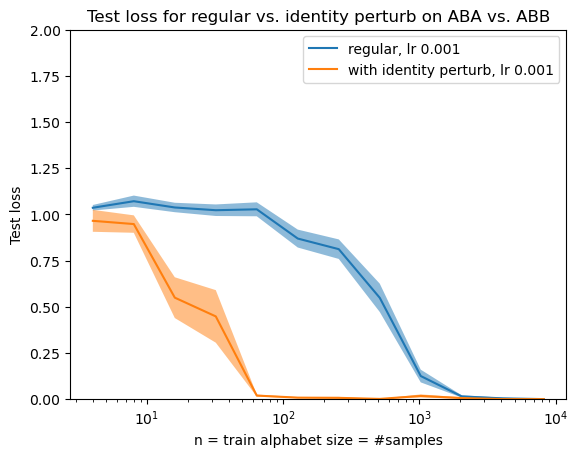

In [58]:
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=0,wvwo_id_mult=0,lrs=[1e-3],num_trials=num_trials,task_label_name='regular')
task_add_assoc_memory_transformer_trainid(wkwq_id_mult=10,wvwo_id_mult=10,lrs=[1e-3],num_trials=num_trials,task_label_name='with identity perturb')
plot_config_dict(plot2=False,labelx1='n = train alphabet size = #samples', labely1='Test loss', title1='Test loss for regular vs. identity perturb on ABA vs. ABB',savefile1='figs/aba_vs_abb_reg_vs_identity_perturb.pdf')

#### FC-net

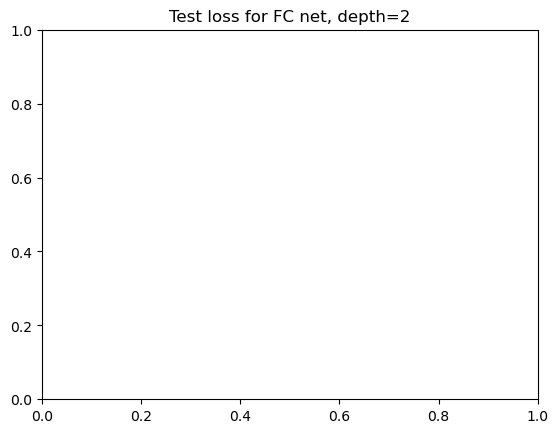

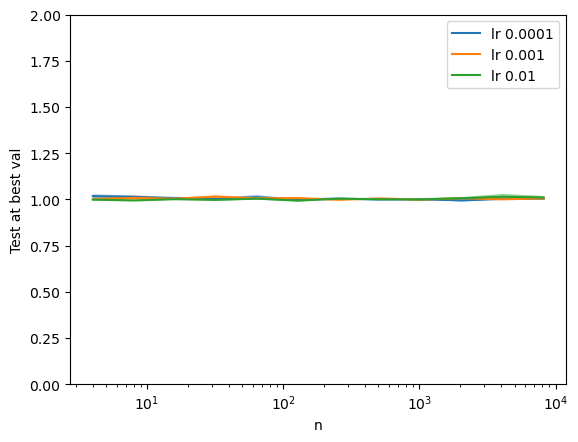

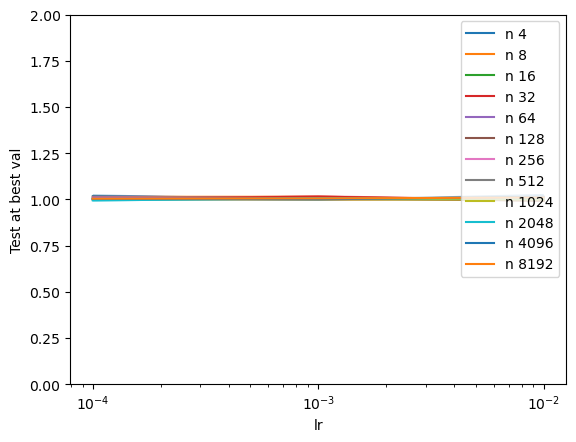

In [59]:
configs = {}
lrs = [1e-4,1e-3,1e-2]
ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
num_trials = 5
depth = 2
hidden_dim = 128
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'assoc_memory_mlp_depth{depth}_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'mlp',
                      ('model', 'hidden_dim'): hidden_dim,
                      ('model', 'depth'): depth,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials=num_trials, logscale2=True)
plt.title(f'Test loss for FC net, depth={depth}')
plot_config_dict()

In [60]:
def task_add_fcnet_depth3_aba_abb(lrs = [1e-3], config_func=get_test_at_best_val, task_label=''):
    configs = {}
    ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    num_trials = 5
    depth = 3
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_mlp_depth{depth}_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', f'{task_label}lr', num_trials=num_trials, logscale2=True,config_func=config_func)
task_add_fcnet_depth3_aba_abb()
# plot_config_dict(title1=f'Test loss for FC net, depth={depth}', labelx1='n = train alphabet size = # samples', labely1='Test loss',savefile1='figs/fc_depth3_aba_vs_abb_gotu.pdf')

# task_add_fcnet_depth3_aba_abb(config_func=get_best_train)
# plot_config_dict(title1=f'Train loss for FC net, depth={depth}', labelx1='n = train alphabet size = # samples', labely1='Train loss',savefile1='figs/fc_depth3_aba_vs_abb_train.pdf')

#### FC-net with shared embedding

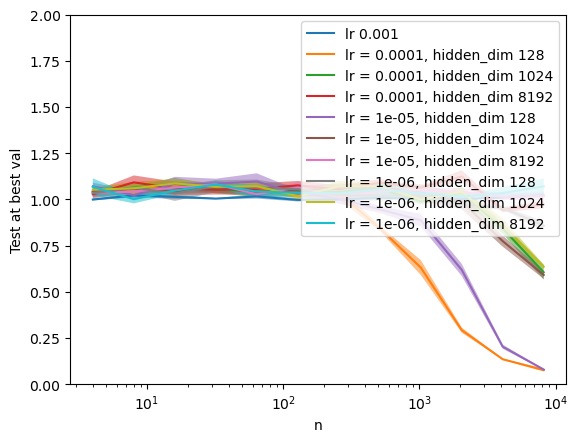

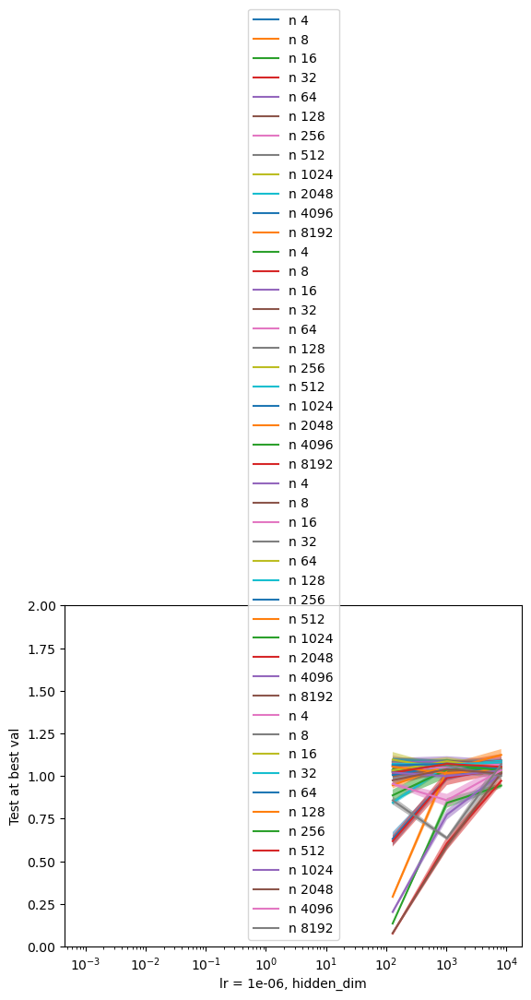

In [61]:
# clear_plot_config_dict()
lrs = [1e-4, 1e-5, 1e-6] # , 1e-6
for lr in lrs:
    configs = {}
    ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    num_trials = 5
    depth = 2
    hidden_dims = [128, 1024, 8192] # 128
    for trialnum in range(num_trials):
        for hidden_dim in hidden_dims:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_mlpsharedembedding_depth{depth}_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp_sharedembedding',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'depth'): depth,
                         }
                configs[(n, hidden_dim, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    add_to_plot_config_dict(configs, ns, hidden_dims, 'n', f'lr = {lr}, hidden_dim', num_trials=num_trials, logscale2=True,ylim=None)
curr_title = f'Test loss for shared embedding FC net, depth={depth}'
# plot_config_dict(title1=curr_title,title2=curr_title)
plot_config_dict()

#### Recurrent net

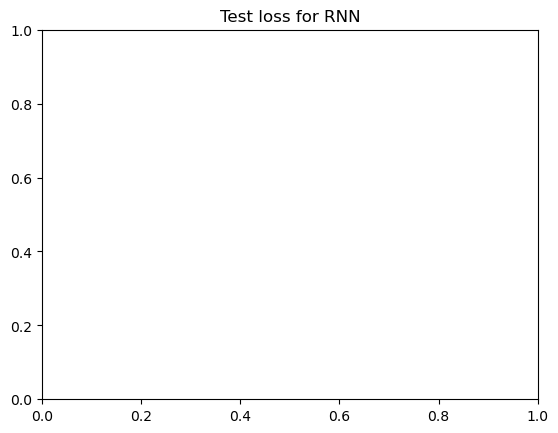

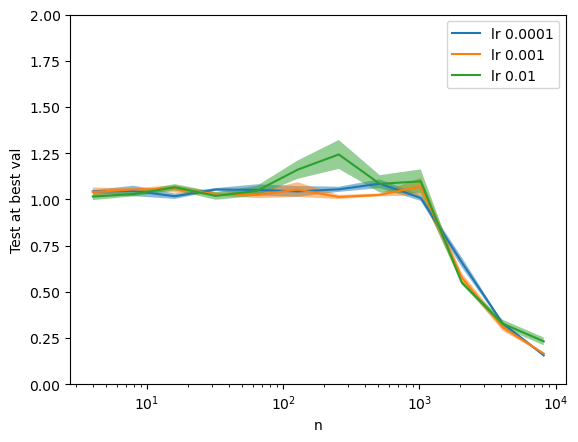

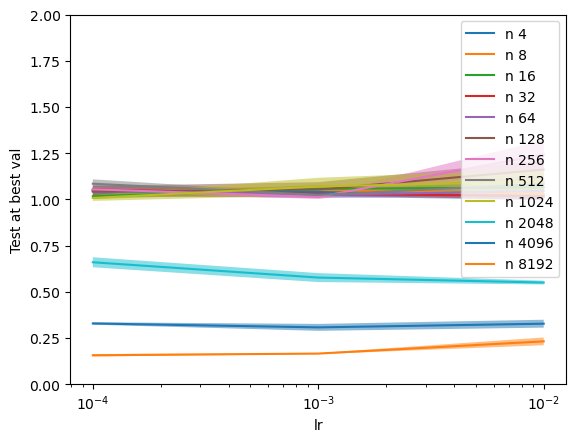

In [62]:
def task_add_rnn_aba_abb(lrs = [1e-4,1e-3,1e-2], task_label='', config_func=get_test_at_best_val):
    configs = {}
    ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    num_trials = 5
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_rnn_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'rnn',
                          ('model', 'hidden_dim'): hidden_dim,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', f'{task_label}lr', num_trials=num_trials, logscale2=True, config_func=config_func)
task_add_rnn_aba_abb()
plt.title(f'Test loss for RNN')
plot_config_dict()

#### LSTM

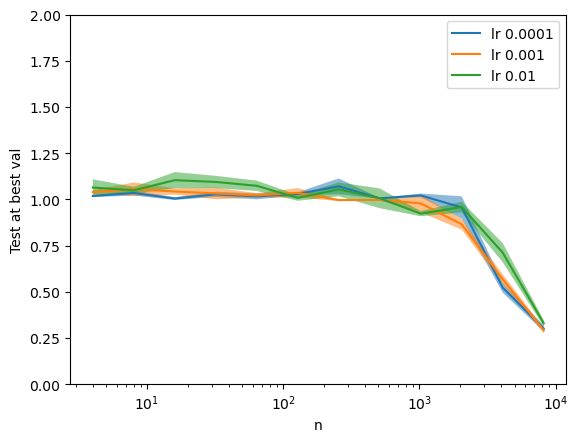

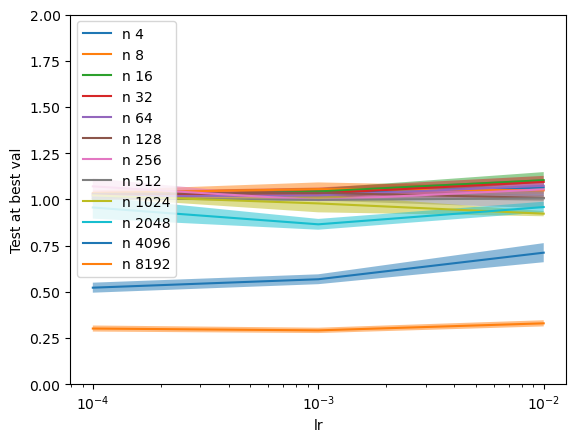

In [63]:
def task_add_lstm_aba_abb(lrs = [1e-4,1e-3,1e-2],task_label='', config_func=get_test_at_best_val):
    configs = {}

    ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
    num_trials = 5
    hidden_dim = 128
    lrs.sort()
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_lstm_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'lstm',
                          ('model', 'hidden_dim'): hidden_dim,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    add_to_plot_config_dict(configs, ns, lrs, 'n', f'{task_label}lr', num_trials=num_trials, logscale2=True, config_func=config_func)
task_add_lstm_aba_abb()
plot_config_dict()

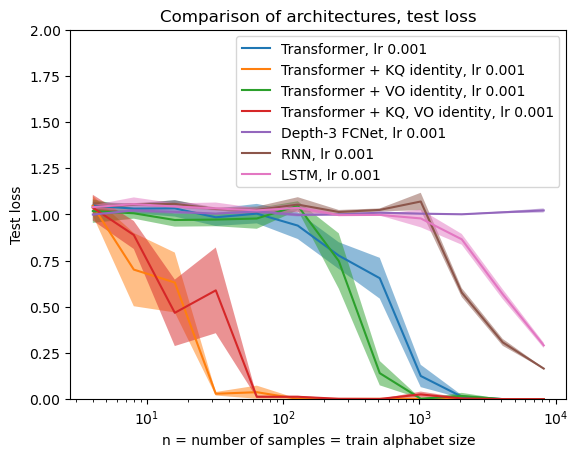

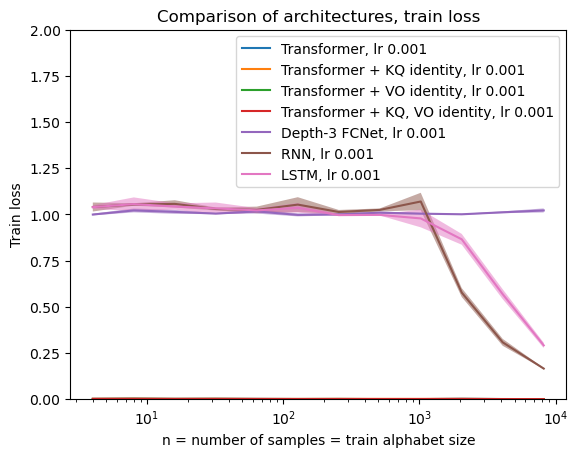

In [64]:
# task_add_assoc_memory_transformer_abridged


task_add_assoc_memory_transformer_trainid(lrs=[0.001],wkwq_id_mult=0,wvwo_id_mult=0, task_label_name='Transformer')
task_add_assoc_memory_transformer_trainid(lrs=[0.001],wkwq_id_mult=10,wvwo_id_mult=0, task_label_name='Transformer + KQ identity')
task_add_assoc_memory_transformer_trainid(lrs=[0.001],wkwq_id_mult=0,wvwo_id_mult=10, task_label_name='Transformer + VO identity')
task_add_assoc_memory_transformer_trainid(lrs=[0.001],wkwq_id_mult=10,wvwo_id_mult=10, task_label_name='Transformer + KQ, VO identity')
task_add_fcnet_depth3_aba_abb(lrs=[0.001],task_label='Depth-3 FCNet, ')
task_add_rnn_aba_abb(lrs=[0.001], task_label='RNN, ')
task_add_lstm_aba_abb(lrs=[0.001],task_label='LSTM, ')
plot_config_dict(title1='Comparison of architectures, test loss',labely1='Test loss', plot2=False, labelx1='n = number of samples = train alphabet size',
                 savefile1=f'figs/diff_architectures_gotu.pdf',)

task_add_assoc_memory_transformer_trainid(lrs=[0.001],wkwq_id_mult=0,wvwo_id_mult=0, task_label_name='Transformer', config_func=get_best_train)
task_add_assoc_memory_transformer_trainid(lrs=[0.001],wkwq_id_mult=10,wvwo_id_mult=0, task_label_name='Transformer + KQ identity', config_func=get_best_train)
task_add_assoc_memory_transformer_trainid(lrs=[0.001],wkwq_id_mult=0,wvwo_id_mult=10, task_label_name='Transformer + VO identity', config_func=get_best_train)
task_add_assoc_memory_transformer_trainid(lrs=[0.001],wkwq_id_mult=10,wvwo_id_mult=10, task_label_name='Transformer + KQ, VO identity', config_func=get_best_train)
task_add_fcnet_depth3_aba_abb(lrs=[0.001],task_label='Depth-3 FCNet, ')
task_add_rnn_aba_abb(lrs=[0.001], task_label='RNN, ')
task_add_lstm_aba_abb(lrs=[0.001],task_label='LSTM, ')
plot_config_dict(title1='Comparison of architectures, train loss',labely1='Train loss', plot2=False, labelx1='n = number of samples = train alphabet size',
                 savefile1=f'figs/diff_architectures_train.pdf',)

### Other model types on majority task

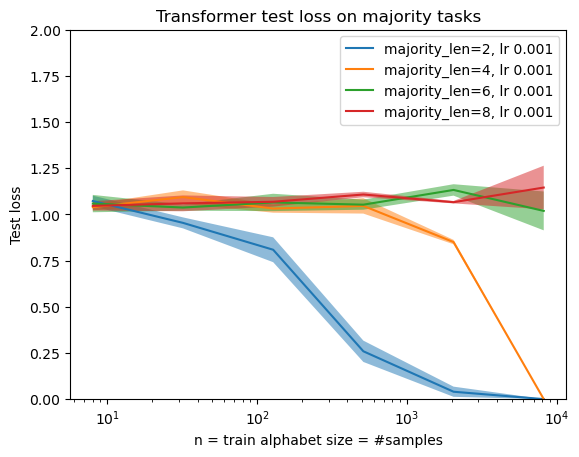

In [65]:
lrs = [1e-3]
# ns = [16, 64, 256, 1024, 4096] # , 8192
ns = [8, 32, 128, 512, 2048, 8192]
num_trials = 5
lrs.sort()

for majority_len in [2,4,6,8]:
    configs = {}
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                templates = [''.join(x) for x in itertools.product(['#','?'],repeat=majority_len) if x[0] == '#']
                template_labels = [1 if x.count('#') > x.count('?') else -1 for x in templates]
                n_templ = len(templates)
                config = {('logging', 'task_name') : f'majority{majority_len}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): templates,
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [1/n_templ for i in range(n_templ)],
                          ('data', 'template_labels'): template_labels,
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    add_to_plot_config_dict(configs,ns,lrs,f'majority_len={majority_len}, n',f'majority_len={majority_len}, lr', num_trials, logscale1=True,logscale2=True)

savename = 'figs/majority_tasks_abridged'
curr_title = 'Transformer test loss on majority tasks'
plot_config_dict(title1=curr_title, title2=curr_title, savefile1=f'{savename}_1.pdf', savefile2=f'{savename}_2.pdf',
                labelx1='n = train alphabet size = #samples',labelx2='lr', labely1='Test loss', plot2=False)


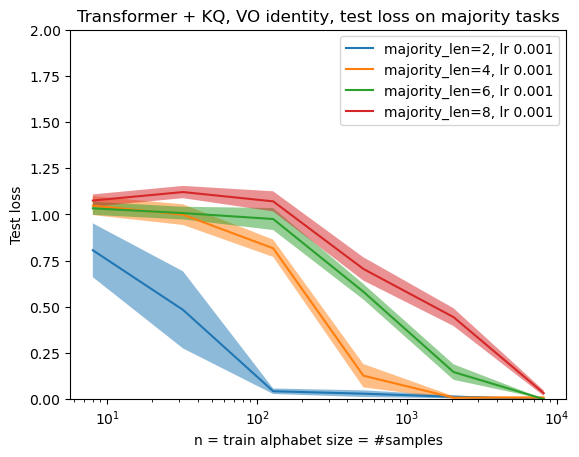

In [66]:
lrs = [1e-3]
ns = [8, 32, 128, 512, 2048, 8192]
num_trials = 5
wkwq_id_mult = 10
wvwo_id_mult = 10
lrs.sort()



for majority_len in [2,4,6,8]:
    configs = {}
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                templates = [''.join(x) for x in itertools.product(['#','?'],repeat=majority_len) if x[0] == '#']
                template_labels = [1 if x.count('#') > x.count('?') else -1 for x in templates]
                n_templ = len(templates)
                config = {('logging', 'task_name') : f'majority{majority_len}_wvwomult{wvwo_id_mult}_wkwqmult{wkwq_id_mult}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): templates,
                          ('data', 'wildcards'): '#?',
                          ('data', 'template_probs'): [1/n_templ for i in range(n_templ)],
                          ('data', 'template_labels'): template_labels,
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'lr_peak_epoch'): 5,
                          ('training', 'batch_size'): 1024,
                          ('training', 'momentum'): 0.9,
                          ('training', 'weight_decay'): 0,
                          ('training', 'label_smoothing'): 0.1,
                          ('training', 'num_workers'): 8,
                          ('training', 'warmup_epochs'): 15,
                          ('training', 'eval_cadence'): 1,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'transformer',
                          ('model', 'embed_dim'): 128,
                          ('model', 'depth'): 2,
                          ('model', 'num_heads'): 16,
                          ('model', 'dropout'): 0,
                          ('model', 'attn_mult'): 1.0,
                          ('model', 'alpha') : 1,
                          ('model', 'trainable_wvwo_identity') : True,
                          ('model', 'wvwo_id_mult') : wvwo_id_mult,
                          ('model', 'trainable_wkwq_identity') : True,
                          ('model', 'wkwq_id_mult') : wkwq_id_mult
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)
    add_to_plot_config_dict(configs,ns,lrs,f'majority_len={majority_len}, n',f'majority_len={majority_len}, lr', num_trials, logscale1=True,logscale2=True)

savename = 'figs/majority_tasks_abridged_transformer_identity_scalings'
curr_title = 'Transformer + KQ, VO identity, test loss on majority tasks'
plot_config_dict(title1=curr_title, title2=curr_title, savefile1=f'{savename}_1.pdf', savefile2=f'{savename}_2.pdf',
                labelx1='n = train alphabet size = #samples',labelx2='lr',plot2=False,
                labely1='Test loss')


## Pretrained model vs. randomly-initialized model

#### GPT-2 grid-search learning rate and number of samples/vocab size

##### GPT-2-small random init

In [67]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
# ns = [16, 64, 256]
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'assoc_memory_gpt2fromscratch_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'from_scratch',
                      ('model', 'name') : 'gpt2',
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()

In [68]:
add_to_plot_config_dict(configs,ns,lrs,'GPT-2 from scratch','GPT-2 from scratch',num_trials,logscale2=True)

##### GPT-2-small pretrained

In [69]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
# ns = [16, 64, 256]
# ns = [32,16,64, 128, 256]
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'assoc_memory_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()

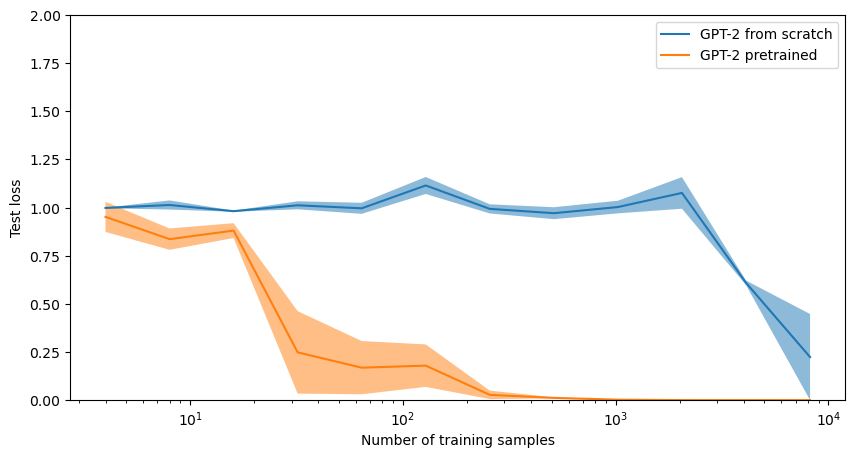

In [70]:
add_to_plot_config_dict(configs,ns,lrs,'GPT-2 pretrained','GPT-2 pretrained',num_trials,logscale2=True)
plot_config_dict(
                 # title1='Test loss of from-scratch GPT-2 vs. pretrained GPT-2',
                 title1=None,
                # labelx1='n = train alphabet size = # samples',
                labelx1='Number of training samples',
                savefile1='figs/gpt2_pretrained_from_scratch_gotu.pdf',
                labely1 = 'Test loss',
                plot2=False, override_labels=True,figsize=(10,5))

## NTK vs. regular training vs. last layer

#### NTK vs. regular training, same vs. different task

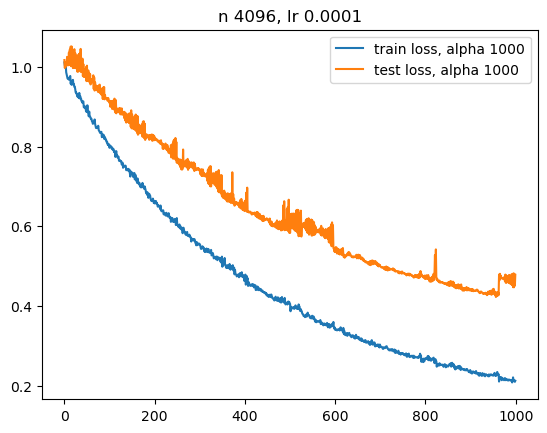

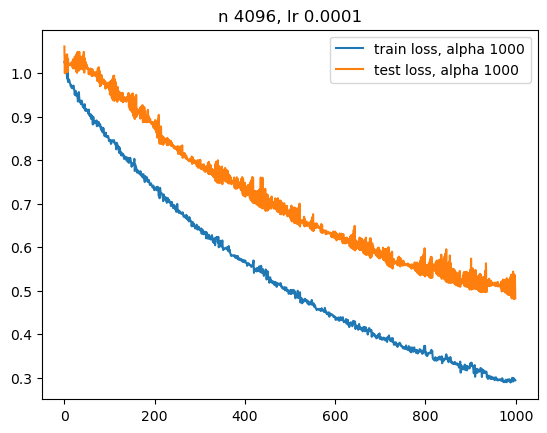

In [71]:
configs = {}
# lr = 5e-5
lr = 1e-4
# ns = [4096,64,16384,256,1024,4096] # A number of samples where results are not always perfect
# ns = [16384]
ns = [4096]
alphas = [1000]
num_heads = 16
depth = 2
num_trials = 2
epochs = 1000
ns.sort()
for trialnum in range(num_trials):
    for n in ns:
        for alpha in alphas:
            optimizer_name = 'adam'
            if optimizer_name == 'adam':
                newlr = lr / alpha
            elif optimizer_name == 'sgd':
                newlr = lr / alpha ** 2
            else:
                assert(False)
            config = {('logging', 'task_name') : f'samedifferent_trainsamples{n}_trainsas{n}_lr{lr}_alpha{alpha}_numheads{num_heads}_epochs{epochs}_depth{depth}_trial{trialnum}',
                      ('data', 'templates'): ['#$', '##'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): newlr, # To get to lazy training limit, since we train with Adam
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      # ('training', 'weight_decay'): 0,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer_name,
                      ('training', 'lazy') : True,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): depth,
                      ('model', 'num_heads'): num_heads, # originally 16
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : alpha,
                     }
            configs[(n, alpha, trialnum)] = config
            # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
            plt.plot(tr_l, label=f'train loss, alpha {alpha}')
            plt.plot(ts_l, label=f'test loss, alpha {alpha}')
        plt.title(f'n {n}, lr {lr}')
        plt.legend()
        plt.show()


#### NTK vs. regular training, Transformer model, associative memory

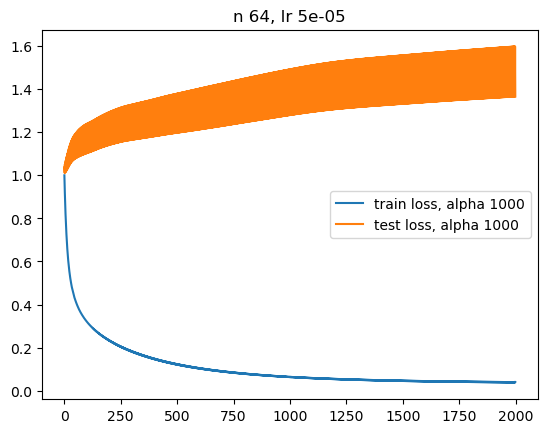

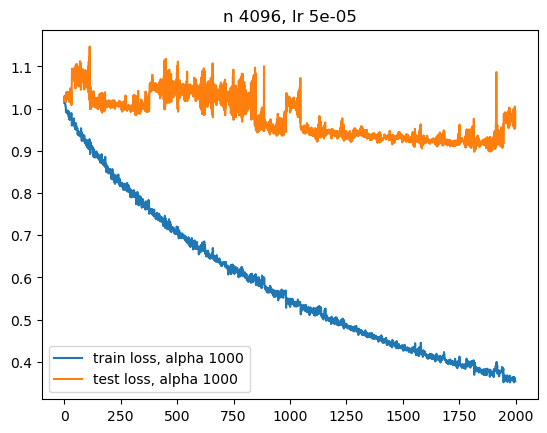

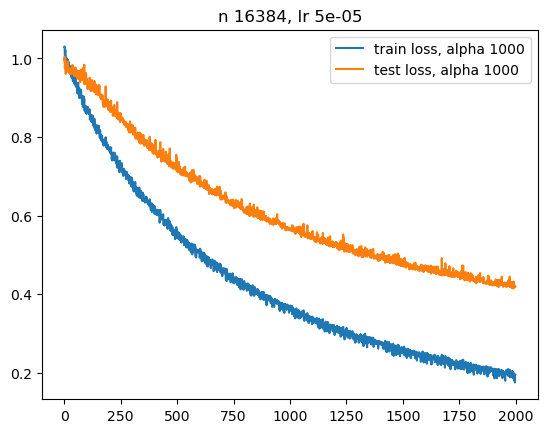

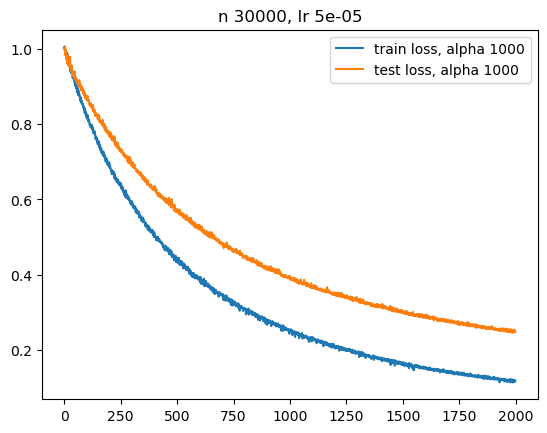

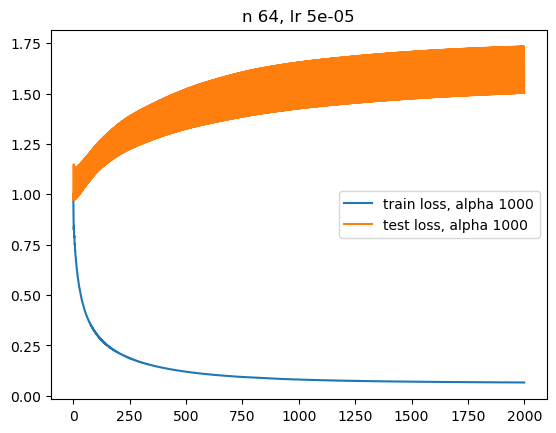

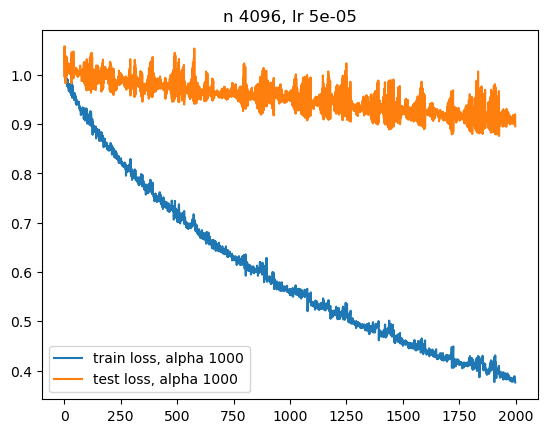

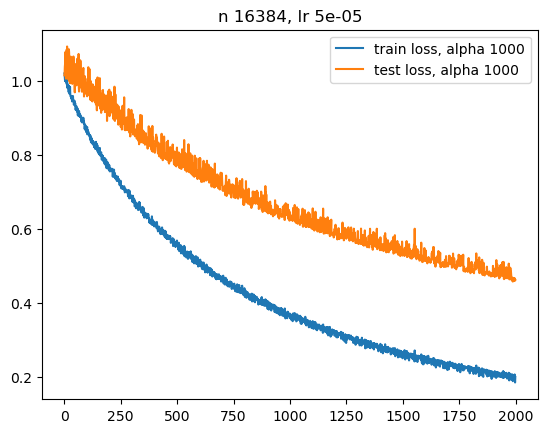

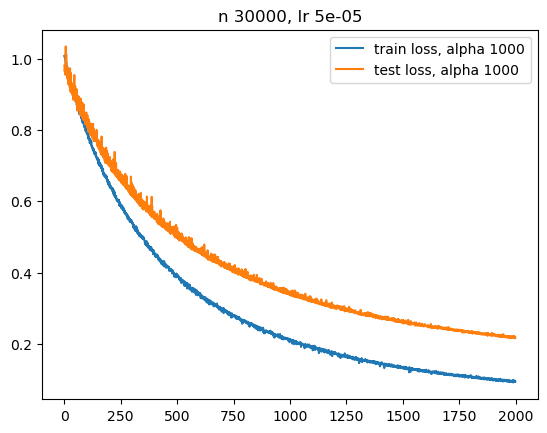

In [72]:
configs = {}
lr = 5e-5
# ns = [4096,64,16384,256,1024,4096] # A number of samples where results are not always perfect
# ns = [16384]
ns = [4096,16384,30000,64,]
alphas = [1000]
num_heads = 64
depth = 2
num_trials = 2
epochs = 2000
ns.sort()
for trialnum in range(num_trials):
    for n in ns:
        for alpha in alphas:
            optimizer_name = 'adam'
            if optimizer_name == 'adam':
                newlr = lr / alpha
            elif optimizer_name == 'sgd':
                newlr = lr / alpha ** 2
            else:
                assert(False)
            config = {('logging', 'task_name') : f'assoc_memory_trainsamples{n}_trainsas{n}_lr{lr}_alpha{alpha}_numheads{num_heads}_epochs{epochs}_depth{depth}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): newlr, # To get to lazy training limit, since we train with Adam
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      # ('training', 'weight_decay'): 0,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer_name,
                      ('training', 'lazy') : True,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): depth,
                      ('model', 'num_heads'): num_heads, # originally 16
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : alpha,
                     }
            configs[(n, alpha, trialnum)] = config
            # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
            plt.plot(tr_l, label=f'train loss, alpha {alpha}')
            plt.plot(ts_l, label=f'test loss, alpha {alpha}')
        plt.title(f'n {n}, lr {lr}')
        plt.legend()
        plt.show()


#### NTK vs. regular training for pre-trained GPT-2 WITH dropout, associative memory

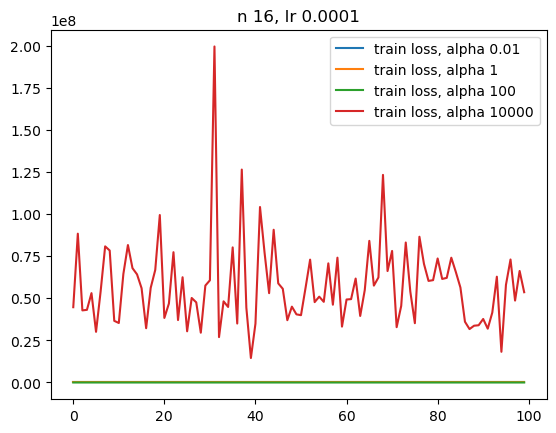

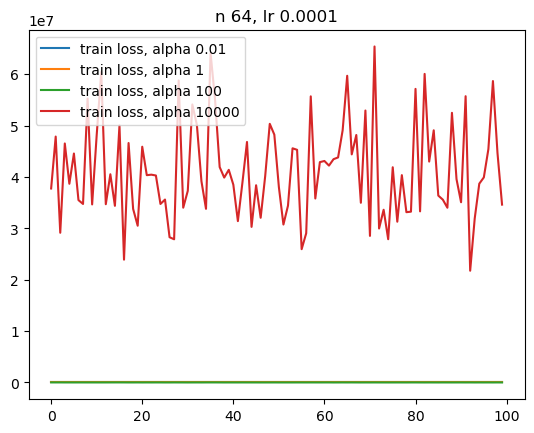

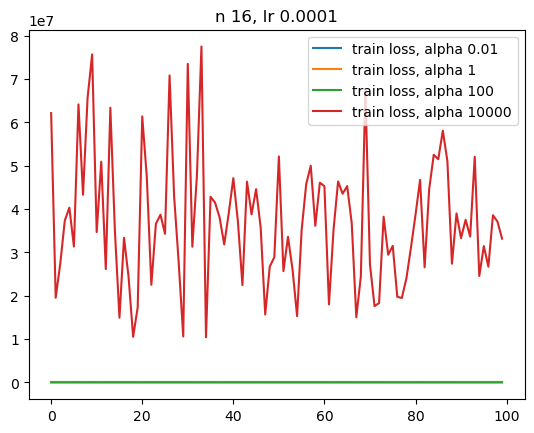

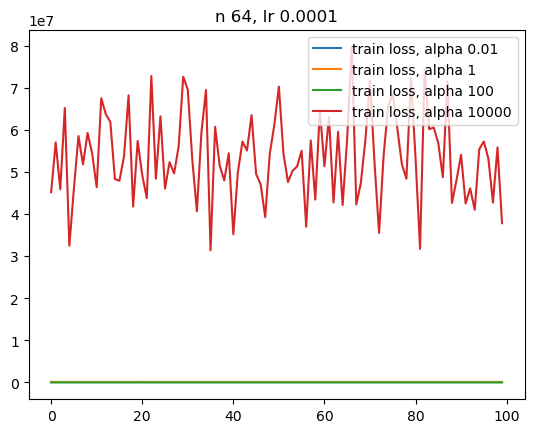

In [73]:
configs = {}
lr = 1e-4
# ns = [4096,64,16384,256,1024,4096] # A number of samples where results are not always perfect
# ns = [16384]
# ns = [4096,16384,30000,64,16]
ns = [16,64] # ,256
alphas = [0.01,1,100,10000]
num_trials = 2
epochs = 100
no_dropout = False
ns.sort()
for trialnum in range(num_trials):
    for n in ns:
        for alpha in alphas:
            optimizer_name = 'adam'
            if optimizer_name == 'adam':
                newlr = lr / alpha
            elif optimizer_name == 'sgd':
                newlr = lr / alpha ** 2
            else:
                assert(False)
            if no_dropout:
                no_dropout_str = '_nodropout'
            else:
                no_dropout_str = ''
            config = {('logging', 'task_name') : f'assoc_memory_gpt2{no_dropout_str}_trainsamples{n}_trainsas{n}_lr{lr}_alpha{alpha}_epochs{epochs}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): newlr, # To get to lazy training limit, since we train with Adam
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      # ('training', 'weight_decay'): 0,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer_name,
                      ('training', 'lazy') : True,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'no_dropout') : no_dropout,
                      ('model', 'alpha') : alpha,
                     }
            configs[(n, alpha, trialnum)] = config
            # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
            plt.plot(tr_l, label=f'train loss, alpha {alpha}')
            # plt.plot(ts_l, label=f'test loss, alpha {alpha}')
        plt.title(f'n {n}, lr {lr}')
        plt.legend()
        plt.show()


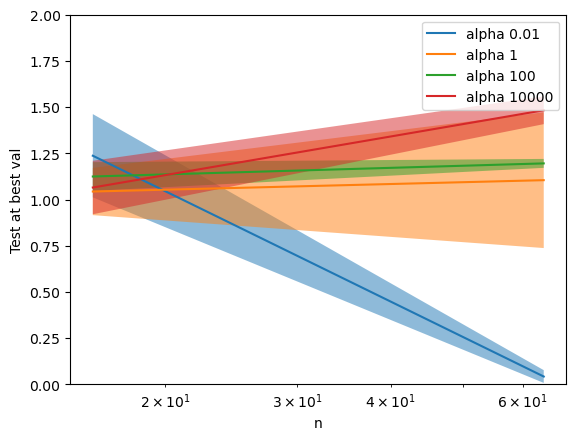

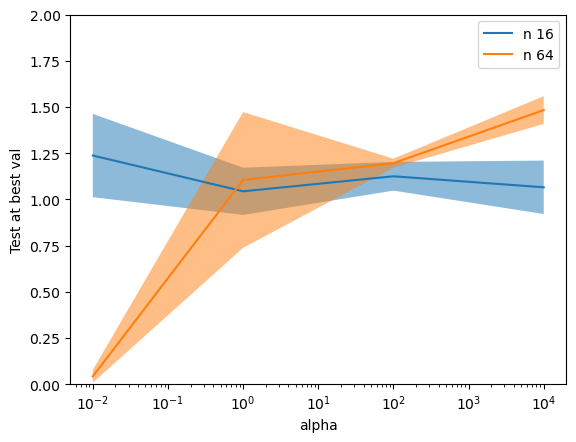

In [74]:
add_to_plot_config_dict(configs,ns,alphas,'n','alpha',num_trials)
plot_config_dict()

#### NTK vs. regular training for pre-trained GPT-2, associative memory

Base LR 0.001


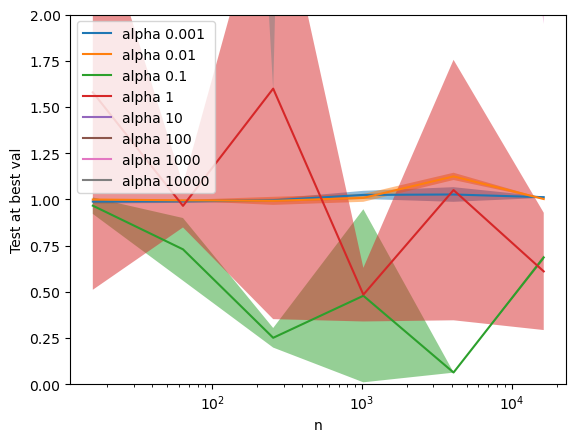

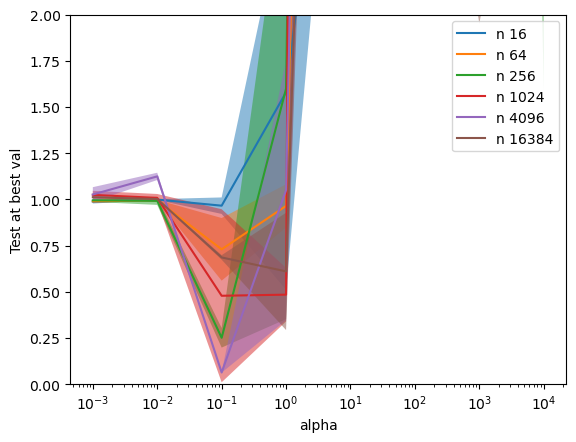

Base LR 0.0001


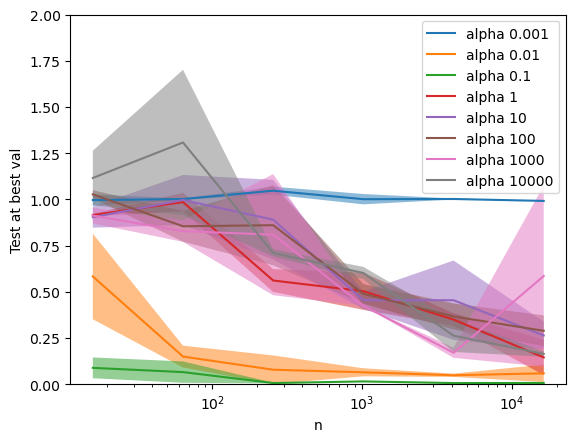

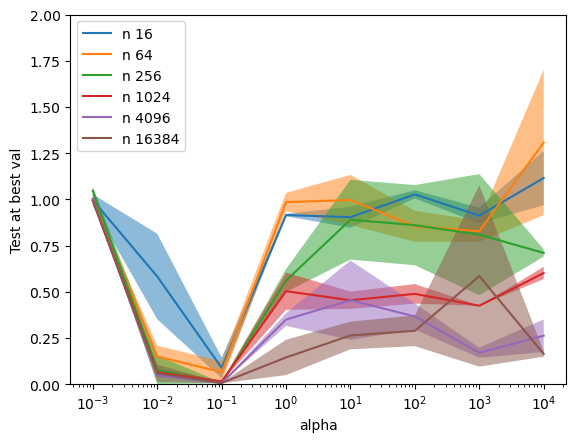

Base LR 1e-05


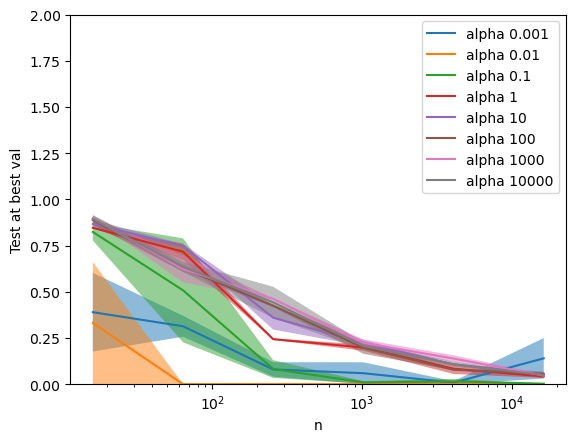

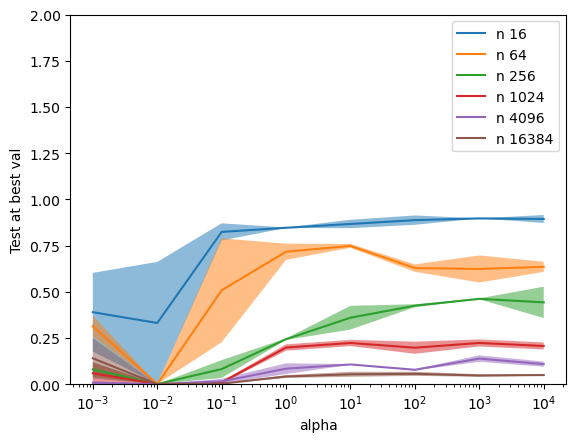

In [75]:
ns = [16,64,256,1024,4096,16384]
alphas = [0.001,0.01,0.1,1,10,100,1000,10000]
num_trials = 2
epochs = 200
no_dropout = True
ns.sort()
for lr in [1e-3, 1e-4, 1e-5]: # , 1e-6
    configs = {}
    for trialnum in range(num_trials):
        for n in ns:
            for alpha in alphas:
                optimizer_name = 'adam'
                if optimizer_name == 'adam':
                    newlr = lr / alpha
                elif optimizer_name == 'sgd':
                    newlr = lr / alpha ** 2
                else:
                    assert(False)
                if no_dropout:
                    no_dropout_str = '_nodropout'
                else:
                    no_dropout_str = ''
                config = {('logging', 'task_name') : f'assoc_memory_gpt2{no_dropout_str}_trainsamples{n}_trainsas{n}_lr{lr}_alpha{alpha}_epochs{epochs}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): newlr, # To get to lazy training limit, since we train with Adam
                          ('training', 'epochs'): epochs,
                          ('training', 'batch_size'): 1024,
                          # ('training', 'weight_decay'): 0,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): optimizer_name,
                          ('training', 'lazy') : True,

                          ('model', 'type'): 'pretrained',
                          ('model', 'name') : 'gpt2',
                          ('model', 'no_dropout') : no_dropout,
                          ('model', 'alpha') : alpha,
                         }
                configs[(n, alpha, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
            #     plt.plot(tr_l, label=f'train loss, alpha {alpha}')
            #     # plt.plot(ts_l, label=f'test loss, alpha {alpha}')
            # plt.title(f'n {n}, lr {lr}')
            # plt.legend()
            # plt.show()
    print('Base LR', lr)
    add_to_plot_config_dict(configs,ns,alphas,'n','alpha',num_trials)
    plot_config_dict()

#### NTK vs. regular training for GPT-2 at random init, associative memory

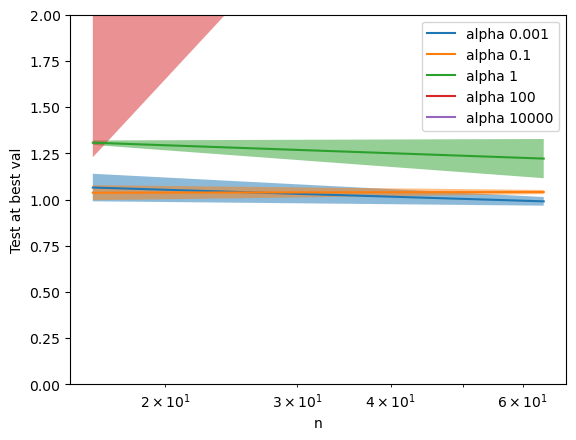

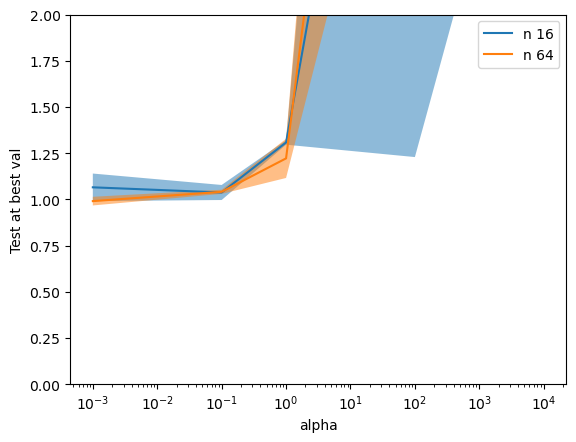

In [76]:
configs = {}
lr = 1e-4
lr = 1e-5
# lr = 1e-6
# ns = [4096,64,16384,256,1024,4096] # A number of samples where results are not always perfect
# ns = [16384]
# ns = [4096,16384,30000,64,16]
ns = [16,64] # 256
# alphas = [0.001,0.01,0.1,1,10,100,1000,10000]
alphas = [0.001,0.1,1,100,10000]
num_trials = 2
epochs = 100
no_dropout = True
ns.sort()
for trialnum in range(num_trials):
    for n in ns:
        for alpha in alphas:
            optimizer_name = 'adam'
            if optimizer_name == 'adam':
                newlr = lr / alpha
            elif optimizer_name == 'sgd':
                newlr = lr / alpha ** 2
            else:
                assert(False)
            if no_dropout:
                no_dropout_str = '_nodropout'
            else:
                no_dropout_str = ''
            config = {('logging', 'task_name') : f'assoc_memory_gpt2_fromscratch{no_dropout_str}_trainsamples{n}_trainsas{n}_lr{lr}_alpha{alpha}_epochs{epochs}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): newlr, # To get to lazy training limit, since we train with Adam
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      # ('training', 'weight_decay'): 0,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer_name,
                      ('training', 'lazy') : True,

                      ('model', 'type'): 'from_scratch',
                      ('model', 'name') : 'gpt2',
                      ('model', 'no_dropout') : no_dropout,
                      ('model', 'alpha') : alpha,
                     }
            configs[(n, alpha, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
        #     plt.plot(tr_l, label=f'train loss, alpha {alpha}')
        #     # plt.plot(ts_l, label=f'test loss, alpha {alpha}')
        # plt.title(f'n {n}, lr {lr}')
        # plt.legend()
        # plt.show()
add_to_plot_config_dict(configs,ns,alphas,'n','alpha',num_trials)
plot_config_dict()

#### Last layer, Transformer model, associative memory, SGD

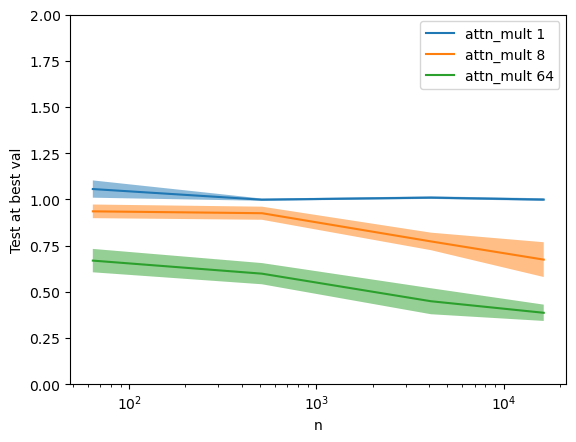

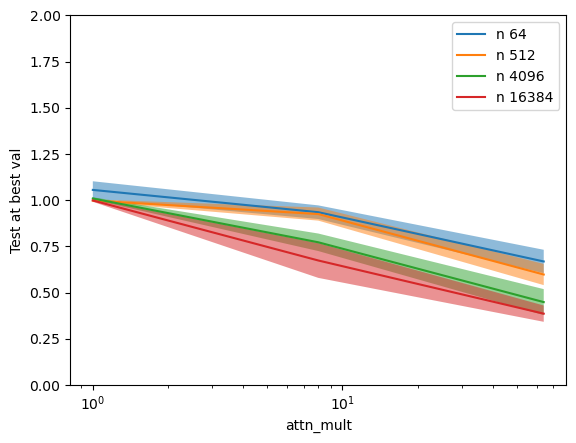

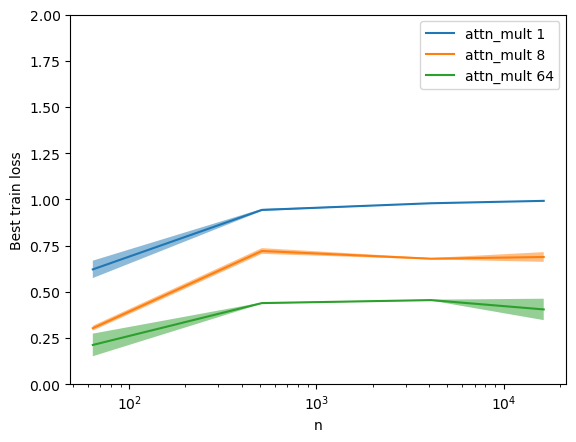

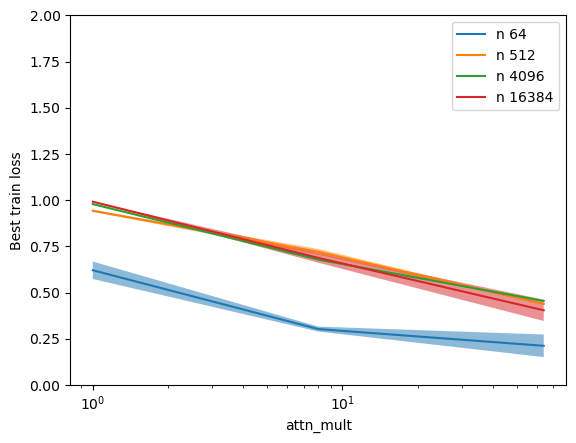

In [77]:
configs = {}
lr = 1e-3
# ns = [4096,64,16384,256,1024,4096] # A number of samples where results are not always perfect
# ns = [16384]
ns = [64,512,4096,16384]
num_heads = 64
depth = 1
num_trials = 2
epochs = 10000
embed_dim=128
attn_mults = [1,8,64]
# ns.sort()
for trialnum in range(num_trials):
    for n in ns:
        for attn_mult in attn_mults:
            optimizer = 'sgd'
            if optimizer == 'adam':
                optimizer_str = ''
            elif optimizer == 'sgd':
                optimizer_str = '_sgd'
            else:
                assert(False)
            config = {('logging', 'task_name') : f'assoc_memory_lastlayer{optimizer_str}_attnmult{attn_mult}_trainsamples{n}_trainsas{n}_lr{lr}_numheads{num_heads}_embeddim{embed_dim}_epochs{epochs}_depth{depth}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer,
                      ('training', 'lazy') : False,
                      ('training', 'train_only_last_layer') : True,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): embed_dim,
                      ('model', 'depth'): depth,
                      ('model', 'num_heads'): num_heads, # originally 16
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): attn_mult,
                     }
            configs[(n, attn_mult, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs,ns, attn_mults, 'n', 'attn_mult', num_trials)
plot_config_dict()

add_to_plot_config_dict(configs,ns, attn_mults, 'n', 'attn_mult', num_trials, config_func=get_best_train)
plot_config_dict()

#### Last layer, Transformer model, associative memory, Adam

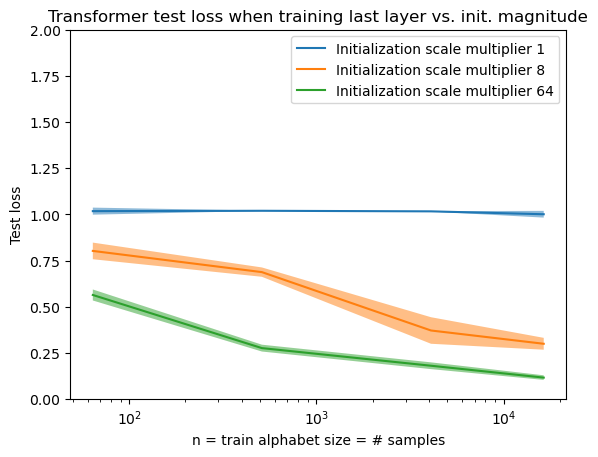

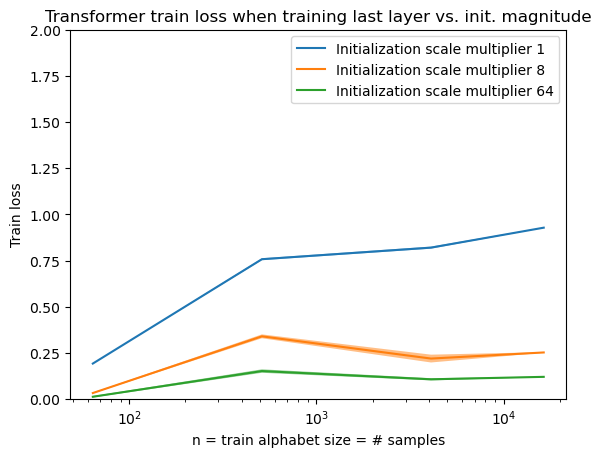

In [78]:
configs = {}
lr = 1e-4
# ns = [4096,64,16384,256,1024,4096] # A number of samples where results are not always perfect, but it does learn better and better as number of samples increases
# ns = [16384]
ns = [64,512,4096,16384]
num_heads = 64
depth = 2
num_trials = 2
epochs = 10000
embed_dim=1024 # 128
attn_mults = [1,8,64]
# ns.sort()
for trialnum in range(num_trials):
    for n in ns:
        for attn_mult in attn_mults:
            optimizer = 'adam'
            if optimizer == 'adam':
                optimizer_str = ''
            elif optimizer == 'sgd':
                optimizer_str = '_sgd'
            else:
                assert(False)
            config = {('logging', 'task_name') : f'assoc_memory_lastlayer{optimizer_str}_attnmult{attn_mult}_trainsamples{n}_trainsas{n}_lr{lr}_numheads{num_heads}_embeddim{embed_dim}_epochs{epochs}_depth{depth}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer,
                      ('training', 'lazy') : False,
                      ('training', 'train_only_last_layer') : True,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): embed_dim,
                      ('model', 'depth'): depth,
                      ('model', 'num_heads'): num_heads, # originally 16
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): attn_mult,
                     }
            configs[(n, attn_mult, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
            
            
            
add_to_plot_config_dict(configs,ns, attn_mults, 'n = train alphabet size = # samples', 'Initialization scale multiplier', num_trials)
curr_title = f'Transformer test loss when training last layer vs. init. magnitude'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lastlayer_1_gotu.pdf',
                 labely1='Test loss',
                 # labelx1 = 'learning rate',
                 plot2=False)


add_to_plot_config_dict(configs,ns, attn_mults, 'n = train alphabet size = # samples', 'Initialization scale multiplier', num_trials, config_func=get_best_train)
curr_title = f'Transformer train loss when training last layer vs. init. magnitude'
plot_config_dict(title1=curr_title,
                 savefile1=f'figs/transformer_lastlayer_1_train.pdf',
                 labely1='Train loss',
                 # labelx1 = 'learning rate',
                 plot2=False)

#### Last layer, pre-trained GPT, associative memory

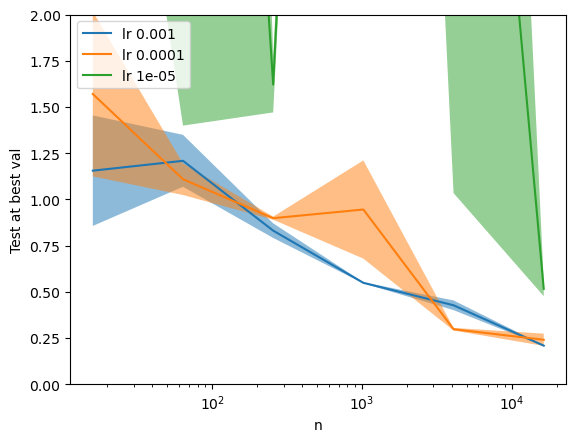

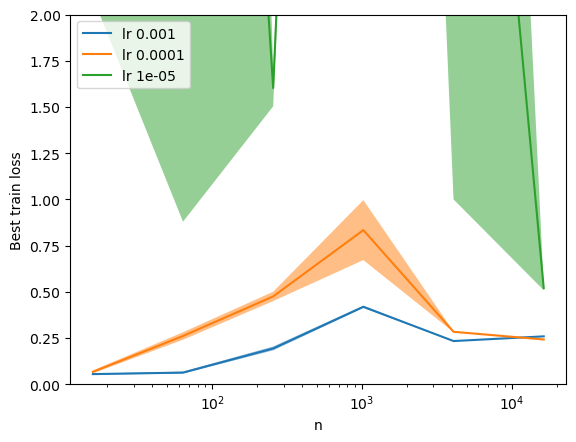

In [79]:
ns = [16,64,256,1024,4096,16384]
num_trials = 2
lrs = [1e-3, 1e-4, 1e-5]
epochs = 200
no_dropout = True
ns.sort()
configs = {}
for lr in lrs: # , 1e-6
    for trialnum in range(num_trials):
        for n in ns:
            optimizer_name = 'adam'
            if no_dropout:
                no_dropout_str = '_nodropout'
            else:
                no_dropout_str = ''
            config = {('logging', 'task_name') : f'assoc_memory_gpt2_lastlayer{no_dropout_str}_trainsamples{n}_trainsas{n}_lr{lr}_epochs{epochs}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr, # To get to lazy training limit, since we train with Adam
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      # ('training', 'weight_decay'): 0,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer_name,
                      ('training', 'train_only_last_layer') : True,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'no_dropout') : no_dropout,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials)
plot_config_dict(plot2=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials,config_func=get_best_train)
plot_config_dict(plot2=False)

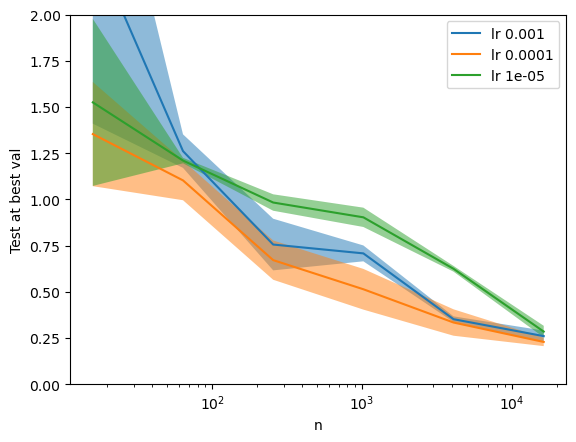

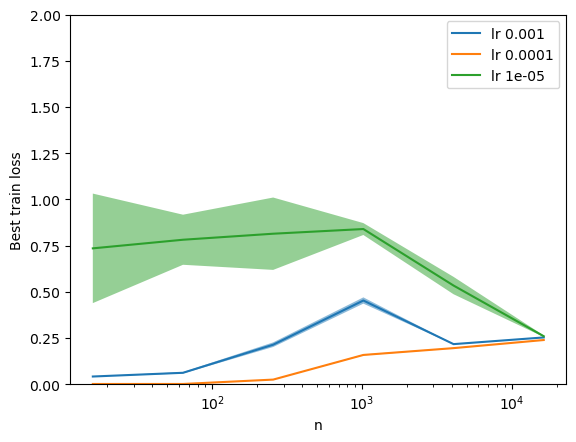

In [80]:
ns = [16,64,256,1024,4096,16384]
num_trials = 2
lrs = [1e-3, 1e-4, 1e-5]
epochs = 1000
no_dropout = True
ns.sort()
configs = {}
for lr in lrs: # , 1e-6
    for trialnum in range(num_trials):
        for n in ns:
            optimizer_name = 'adam'
            if no_dropout:
                no_dropout_str = '_nodropout'
            else:
                no_dropout_str = ''
            config = {('logging', 'task_name') : f'assoc_memory_gpt2_lastlayer{no_dropout_str}_trainsamples{n}_trainsas{n}_lr{lr}_epochs{epochs}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr, # To get to lazy training limit, since we train with Adam
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      # ('training', 'weight_decay'): 0,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer_name,
                      ('training', 'train_only_last_layer') : True,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'no_dropout') : no_dropout,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials)
plot_config_dict(plot2=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials,config_func=get_best_train)
plot_config_dict(plot2=False)

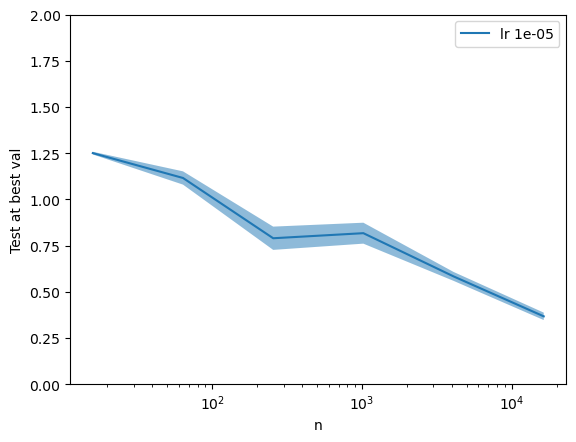

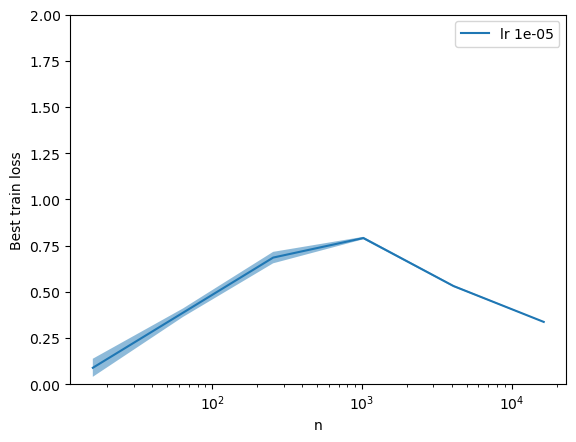

In [81]:
ns = [16,64,256,1024,4096,16384]
num_trials = 2
lrs = [1e-5]
epochs = 10000
no_dropout = True
ns.sort()
configs = {}
for lr in lrs: # , 1e-6
    for trialnum in range(num_trials):
        for n in ns:
            optimizer_name = 'sgd'
            if no_dropout:
                no_dropout_str = '_nodropout'
            else:
                no_dropout_str = ''
            config = {('logging', 'task_name') : f'assoc_memory_gpt2_sgd_lastlayer{no_dropout_str}_trainsamples{n}_trainsas{n}_lr{lr}_epochs{epochs}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr, # To get to lazy training limit, since we train with Adam
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      # ('training', 'weight_decay'): 0,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): optimizer_name,
                      ('training', 'train_only_last_layer') : True,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'no_dropout') : no_dropout,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            tr_l, val_l, ts_l = run_experiment_from_config(config, verbose=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials)
plot_config_dict(plot2=False)
add_to_plot_config_dict(configs,ns,lrs,'n','lr',num_trials,config_func=get_best_train)
plot_config_dict(plot2=False)

## Different sizes of GPT-2

##### GPT-2-small pretrained

In [82]:
def task_add_gpt2_by_size_assoc(config_func=get_test_at_best_val, size='small',lrs=None):
    if size == 'small':
        model_name = 'gpt2'
    elif size == 'medium':
        model_name = 'gpt2-medium'
    elif size == 'large':
        model_name = 'gpt2-large'
    configs = {}
    if lrs is None:
        lrs = [1e-4,1e-3,1e-5,1e-2] # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
    ns = [8, 16, 32, 64, 128]
    num_trials = 2
    for trialnum in range(num_trials):
        for lr in lrs:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_{model_name}_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'pretrained',
                          ('model', 'name') : model_name,
                          ('model', 'alpha') : 1,
                         }
                configs[(n, lr, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)

    lrs.sort()
    add_to_plot_config_dict(configs,ns,lrs,f'gpt2-{size} pretrained, n',f'gpt2-{size} pretrained, lr',num_trials,logscale2=True,config_func=config_func)
    # plot_config_dict()

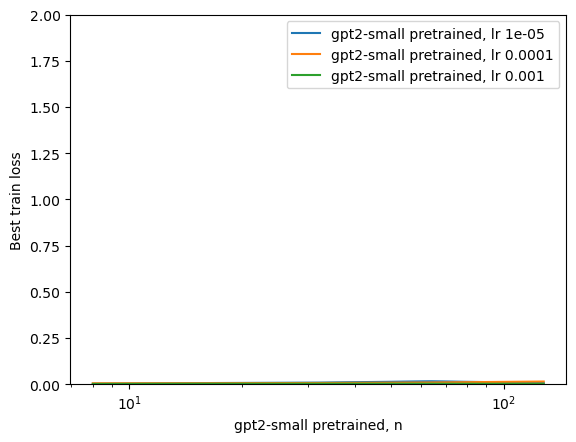

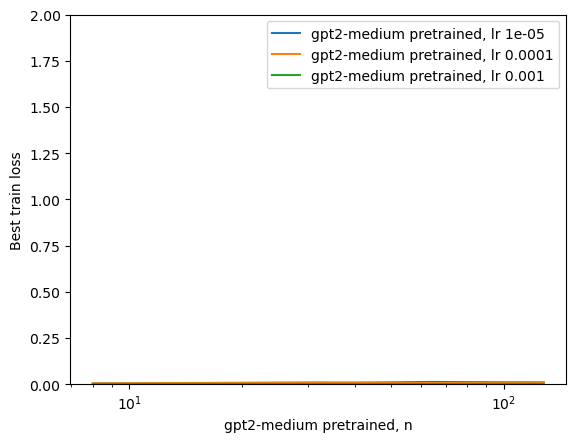

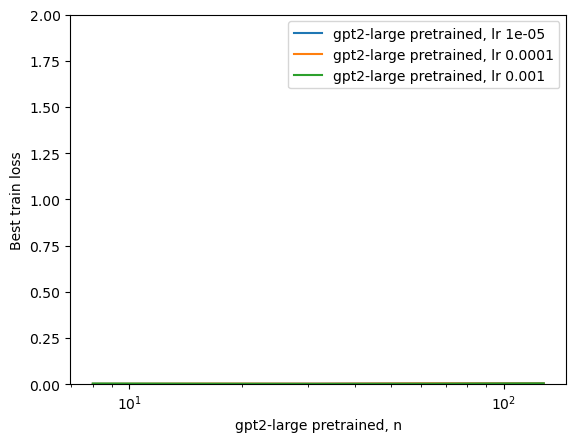

In [83]:
task_add_gpt2_by_size_assoc(size='small',config_func=get_best_train,lrs=[1e-5,1e-4,1e-3])
plot_config_dict(plot2=False)
task_add_gpt2_by_size_assoc(size='medium',config_func=get_best_train,lrs=[1e-5,1e-4,1e-3])
plot_config_dict(plot2=False)
task_add_gpt2_by_size_assoc(size='large',config_func=get_best_train,lrs=[1e-5,1e-4,1e-3])
plot_config_dict(plot2=False)

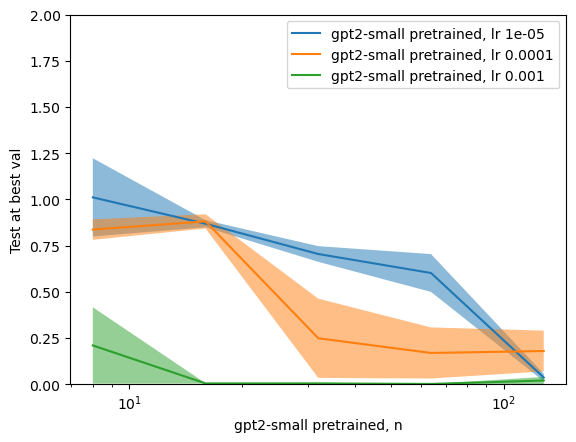

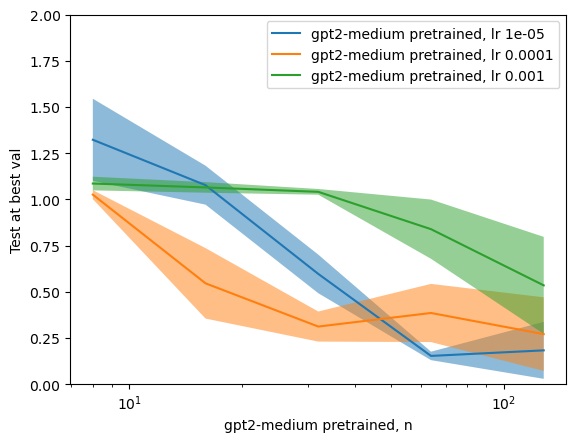

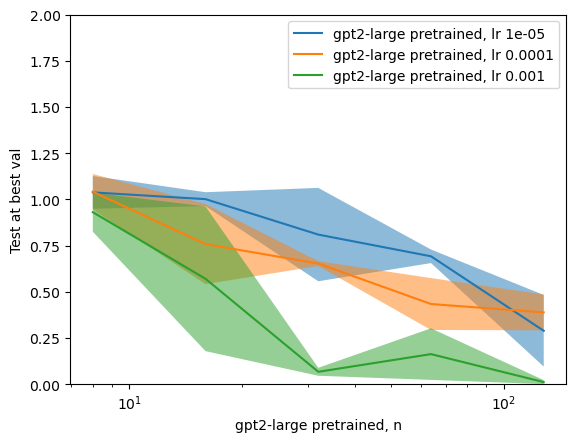

In [84]:
task_add_gpt2_by_size_assoc(size='small',lrs=[1e-5,1e-4,1e-3])
plot_config_dict(plot2=False)
task_add_gpt2_by_size_assoc(size='medium',lrs=[1e-5,1e-4,1e-3])
plot_config_dict(plot2=False)
task_add_gpt2_by_size_assoc(size='large',lrs=[1e-5,1e-4,1e-3])
plot_config_dict(plot2=False)

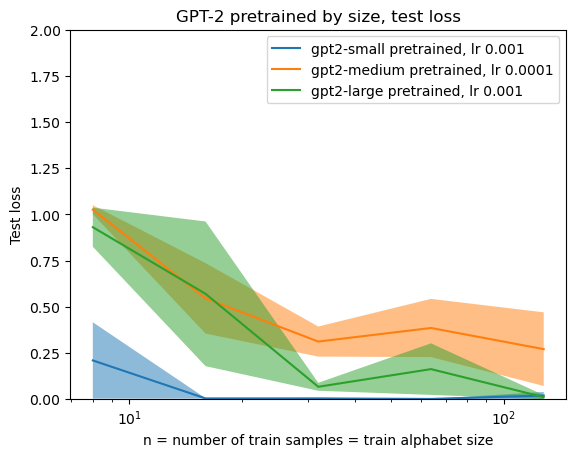

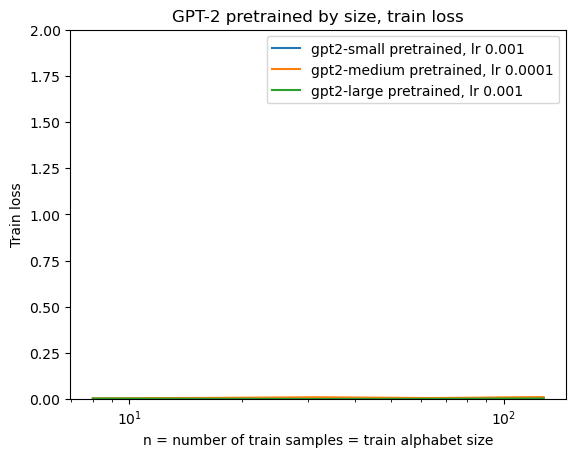

In [85]:
task_add_gpt2_by_size_assoc(size='small',lrs=[0.001])
task_add_gpt2_by_size_assoc(size='medium', lrs=[0.0001])
task_add_gpt2_by_size_assoc(size='large',lrs=[0.001])
plot_config_dict(plot2=False,title1='GPT-2 pretrained by size, test loss', labely1='Test loss',
                 labelx1='n = number of train samples = train alphabet size',
                 savefile1='figs/gpt2_small_medium_large_gotu.pdf')
task_add_gpt2_by_size_assoc(size='small',lrs=[0.001], config_func=get_best_train)
task_add_gpt2_by_size_assoc(size='medium', lrs=[0.0001], config_func=get_best_train)
task_add_gpt2_by_size_assoc(size='large',lrs=[0.001], config_func=get_best_train)
plot_config_dict(plot2=False, title1='GPT-2 pretrained by size, train loss', labely1='Train loss',
                 labelx1='n = number of train samples = train alphabet size',
                 savefile1='figs/gpt2_small_medium_large_train.pdf')

## Pretrained GPT-2 head investigations

#### Draw head weights

In [89]:
config = {('data', 'label_type') : 'regression',
          ('model', 'type'): 'pretrained',
          ('model', 'name') : 'gpt2',
          ('model', 'no_dropout') : True,
         }
model = make_model(config)

OSError: We couldn't connect to 'https://huggingface.co' to load this file, couldn't find it in the cached files and it looks like gpt2 is not the path to a directory containing a file named config.json.
Checkout your internet connection or see how to run the library in offline mode at 'https://huggingface.co/docs/transformers/installation#offline-mode'.

In [ ]:
model = model.model.model

In [ ]:
def get_wkwq_wvwo(model, layernum, ablatewqwk=True, ablatewvwo=True):
    with torch.no_grad():
        b = model.h[layernum]
        att = b.attn
        wq, wk, wv = att.c_attn.weight.split(768, dim=-1)
        wo = att.c_proj.weight.T
        def split_into_heads(tensor, num_heads, attn_head_size):
            new_shape = tensor.size()[:-1] + (num_heads, attn_head_size)
            tensor = tensor.view(new_shape).transpose(0,1)
            return tensor
        wq = split_into_heads(wq, 12, 64)
        wk = split_into_heads(wk, 12, 64)
        wv = split_into_heads(wv, 12, 64)
        wo = split_into_heads(wo, 12, 64)
        wvwo = wv @ wo.transpose(-1,-2)
        wqwk = wq @ wk.transpose(-1,-2)
        if ablatewqwk:
            idx = torch.arange(wqwk.shape[1])
            wqwk[:, idx, idx] = 0
        if ablatewvwo:
            idx = torch.arange(wvwo.shape[1])
            wvwo[:, idx, idx] = 0
    return wvwo, wqwk

In [88]:
def check_strong_id(m):
    with torch.no_grad():
        a = torch.mean(torch.diag(m)).item()
        b = torch.mean(m).item()
        c = torch.linalg.norm(m - torch.diag(torch.diag(m))).item()
        d = torch.linalg.norm(torch.diag(m)).item()
        id_idx = abs(a)*math.sqrt(768*768-768) / c
        
        tot_mean = torch.mean(m)
        l2other = torch.linalg.norm(m-tot_mean - torch.diag(torch.diag(m-tot_mean)))
        diag_centered_mean = torch.mean(torch.diag(m)) - tot_mean
        ctred_attr = abs(diag_centered_mean.item()) * math.sqrt(768) / (l2other.item() / math.sqrt(768 * 768 - 768))
    return ctred_attr, id_idx, a, b, c, d

0
1
172.61088609047414


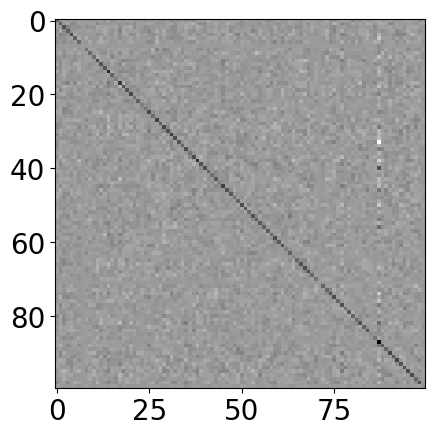

172.61088609047414


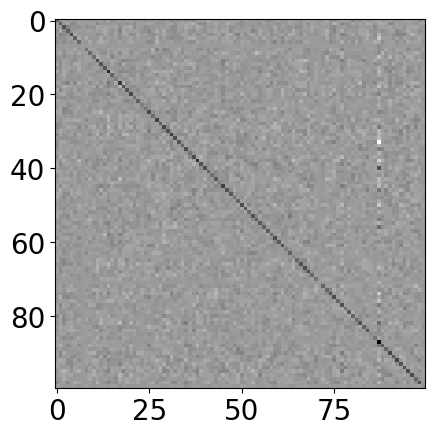

2
3
164.50845049972065


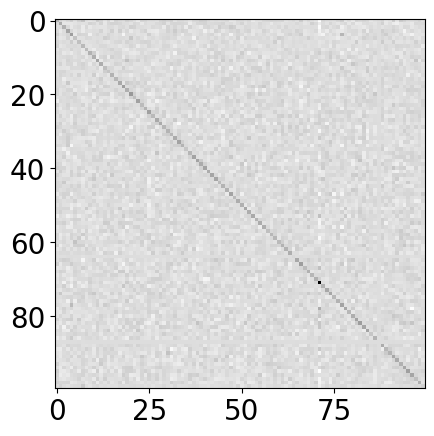

164.50845049972065


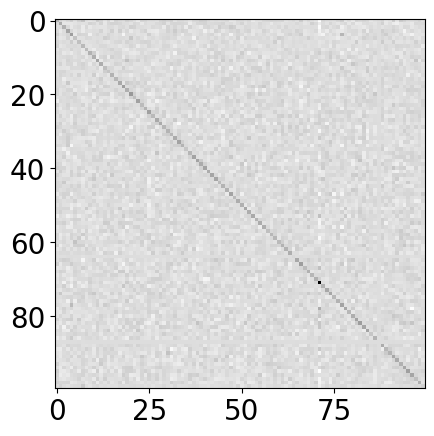

4
200.07842615700787


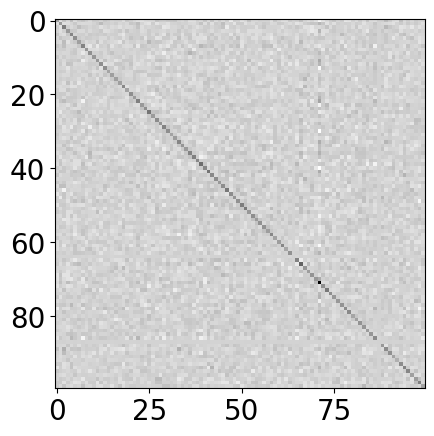

200.07842615700787


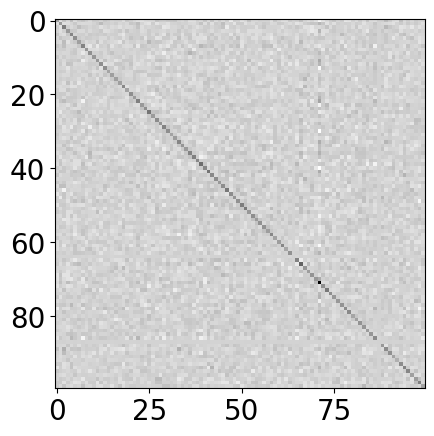

101.1925210308371


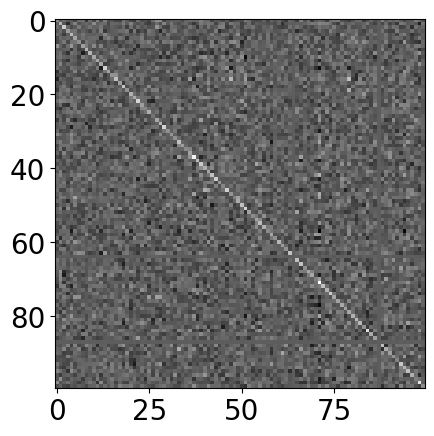

101.1925210308371


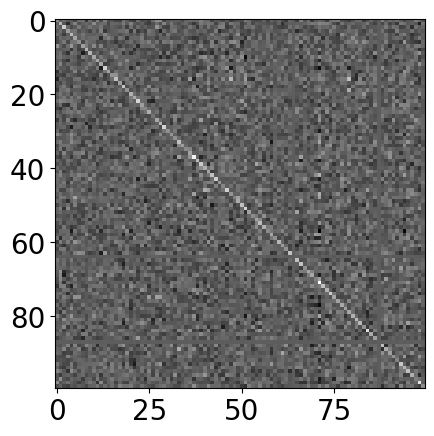

5
147.37612759605975


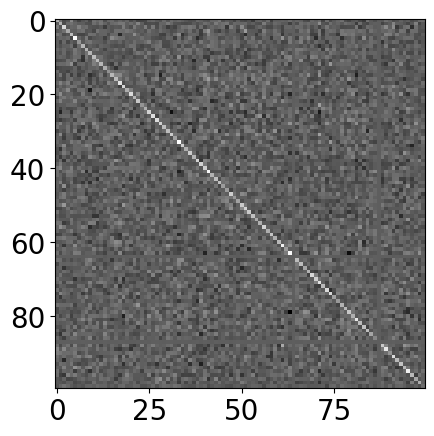

147.37612759605975


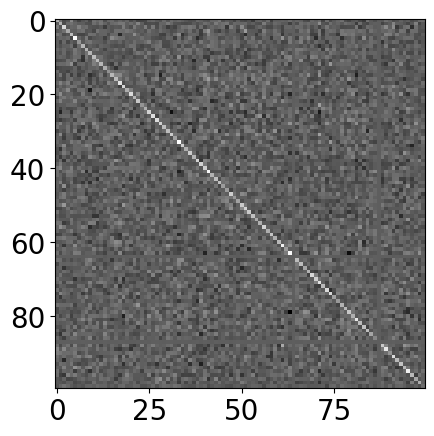

126.16982762165478


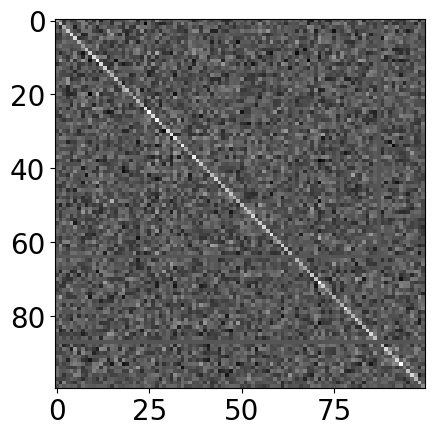

126.16982762165478


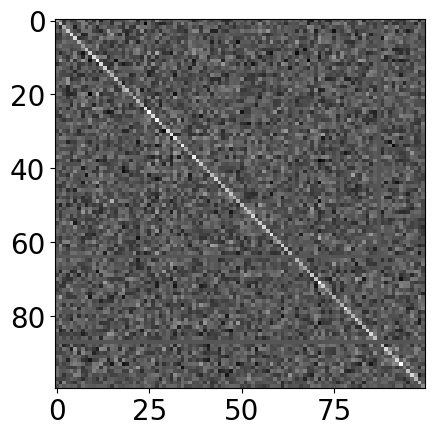

177.61529943986665


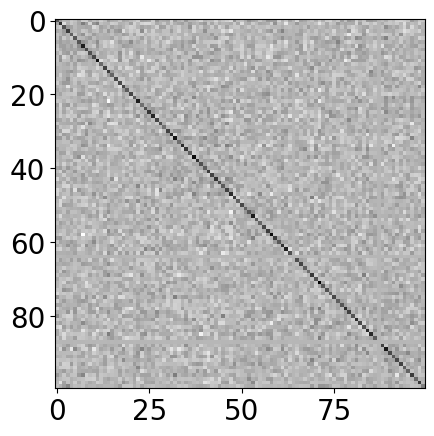

177.61529943986665


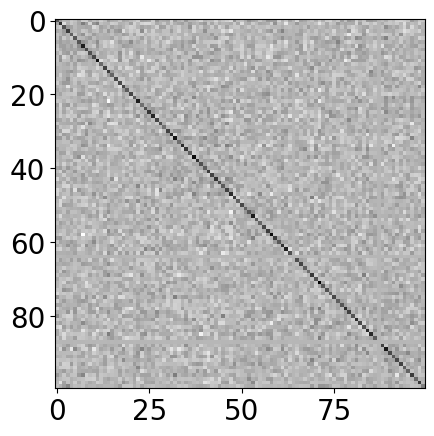

6
124.30946113253746


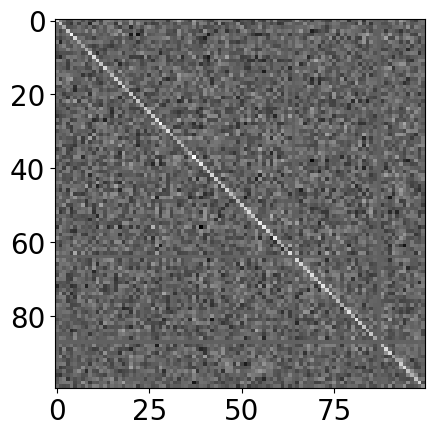

124.30946113253746


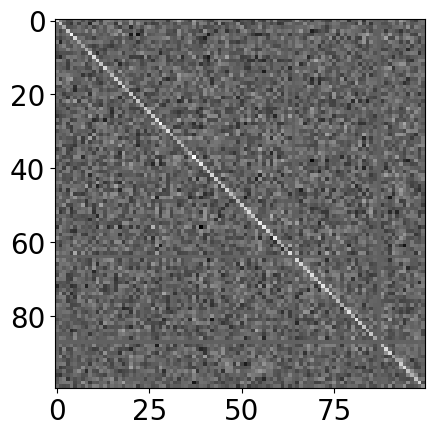

104.22105799371036


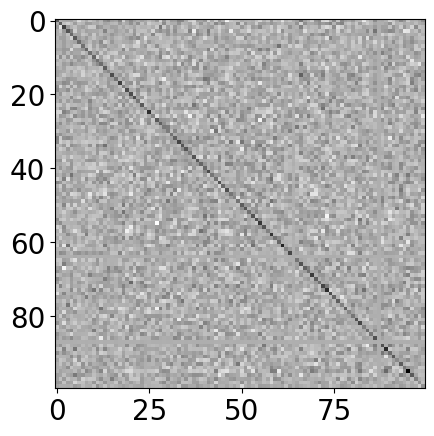

104.22105799371036


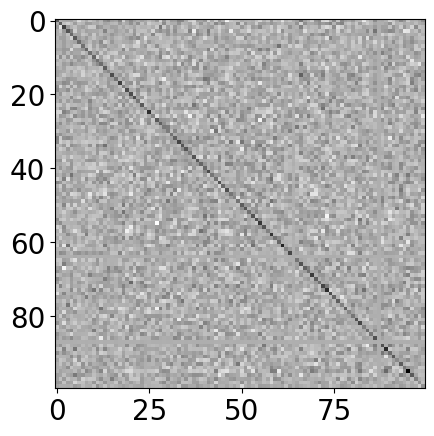

157.38475837285432


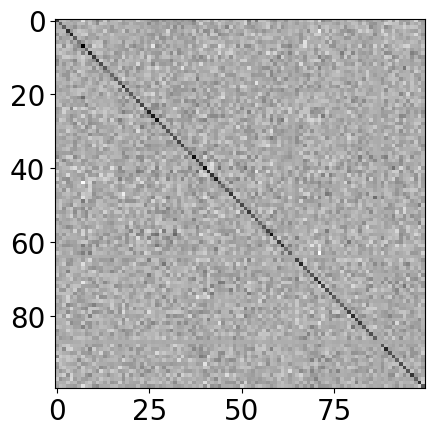

157.38475837285432


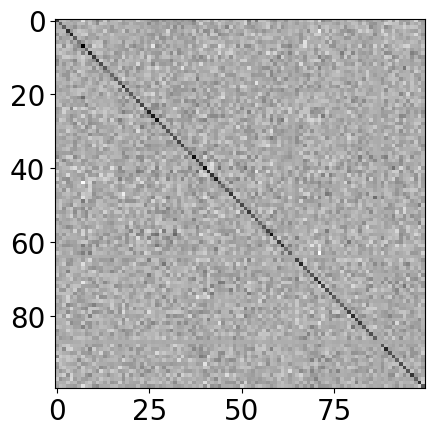

138.91482558402615


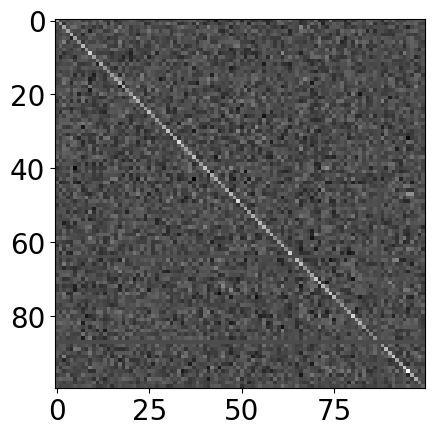

138.91482558402615


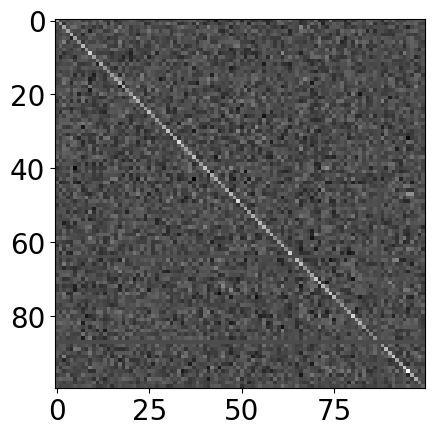

7
123.21663888118165


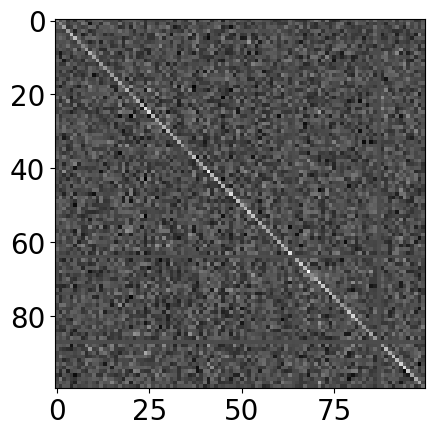

123.21663888118165


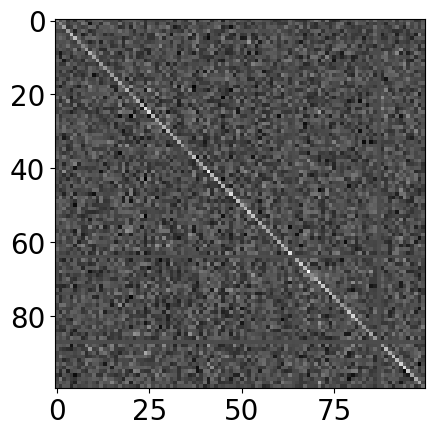

109.50768692104182


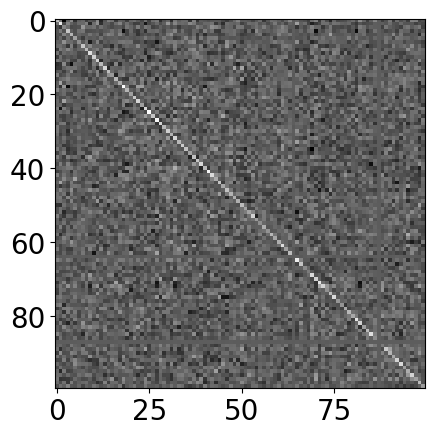

109.50768692104182


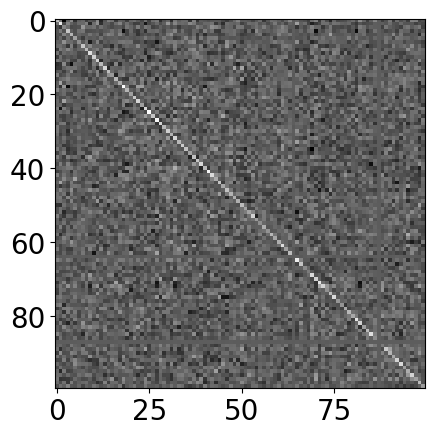

123.911196612346


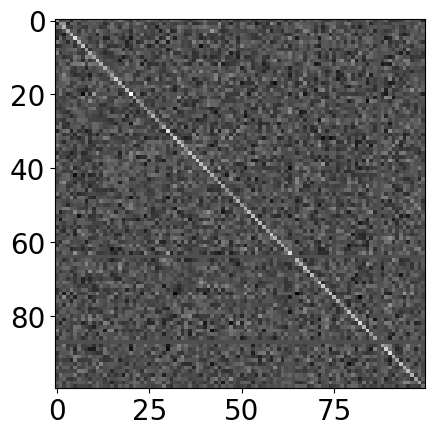

123.911196612346


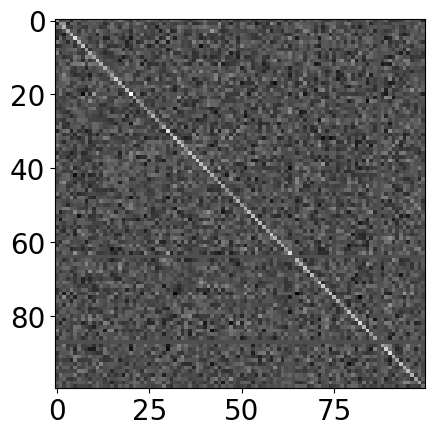

142.9231195327784


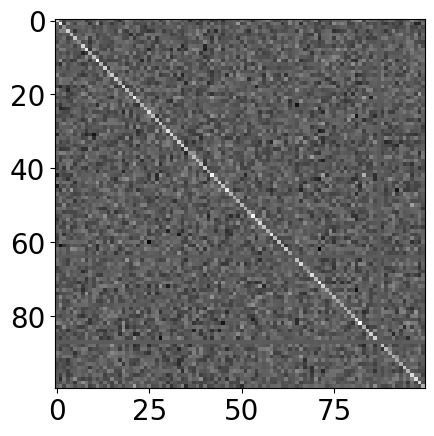

142.9231195327784


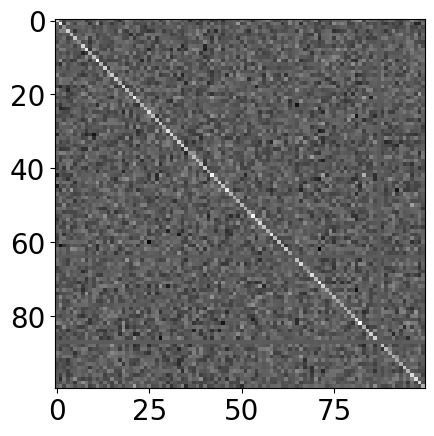

8
124.86099180744208


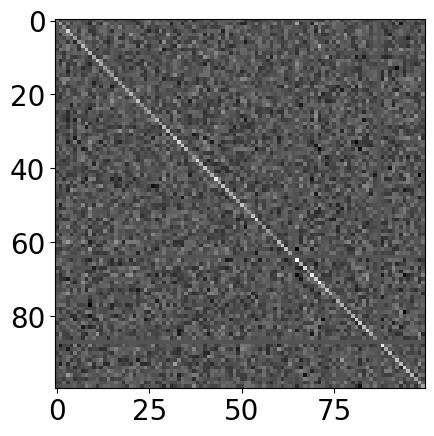

124.86099180744208


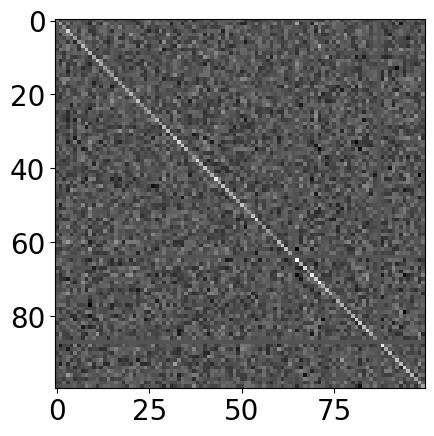

131.12325720844214


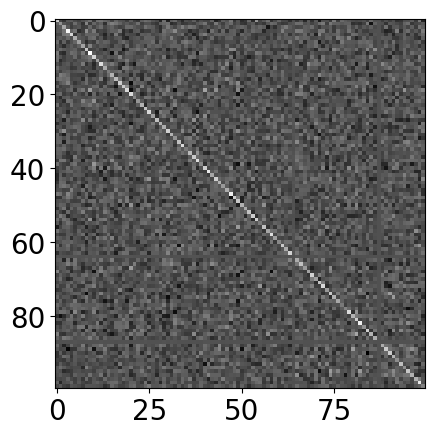

131.12325720844214


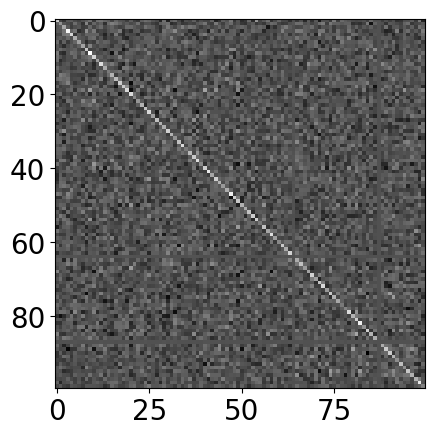

145.42809150058702


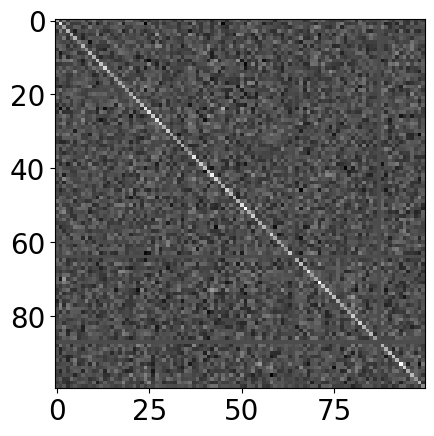

145.42809150058702


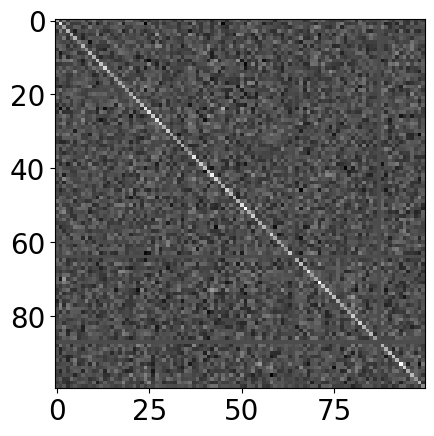

9
124.6848414914489


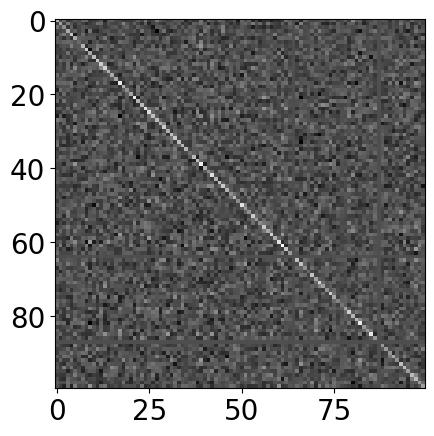

124.6848414914489


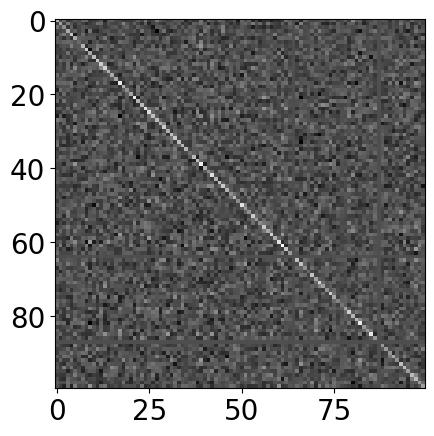

148.2106528220832


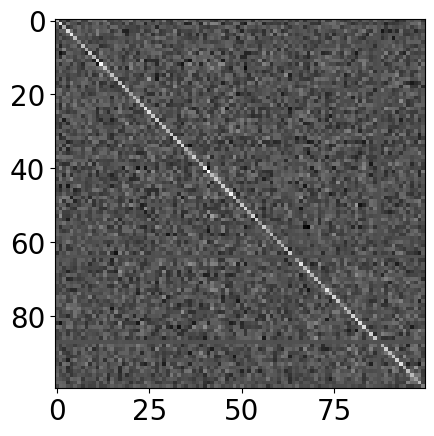

148.2106528220832


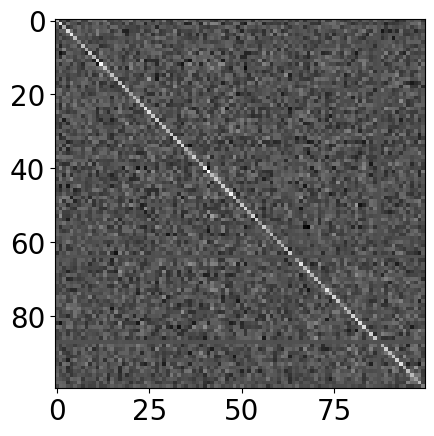

156.80755328085374


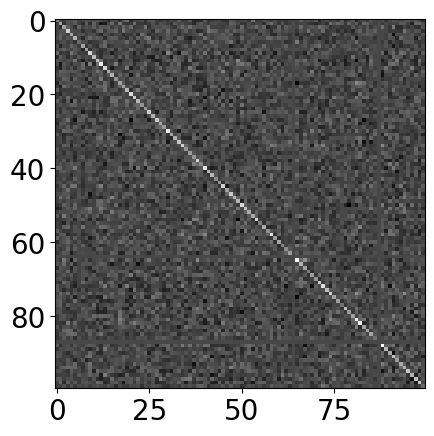

156.80755328085374


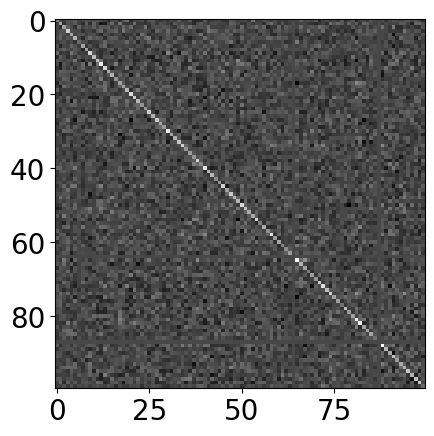

10
137.62592738278812


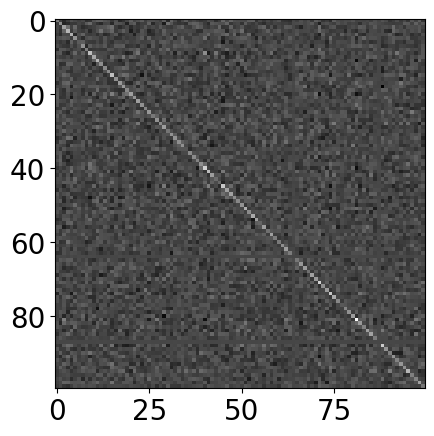

137.62592738278812


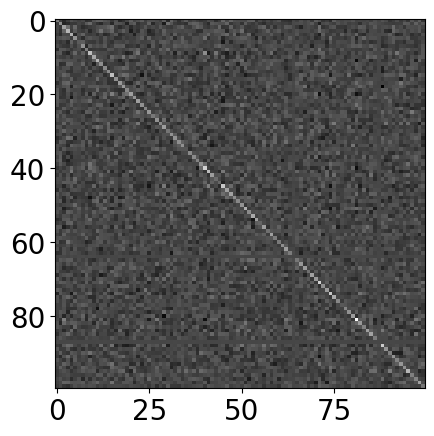

155.6147689094757


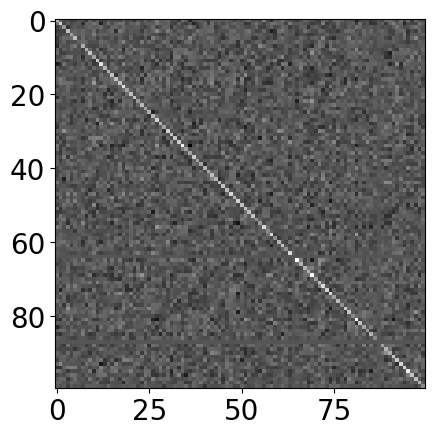

155.6147689094757


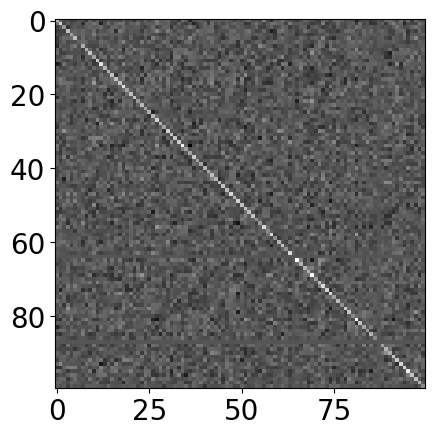

132.98649357738176


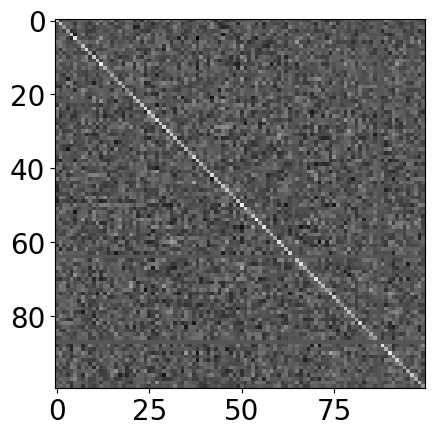

132.98649357738176


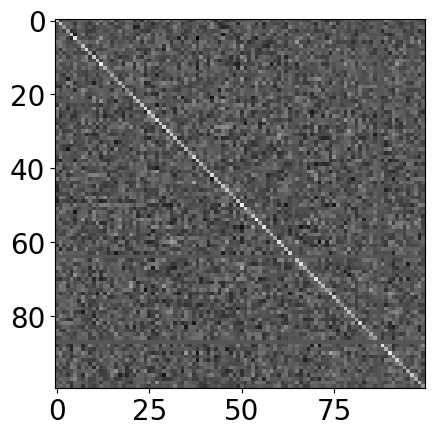

11
188.880725541844


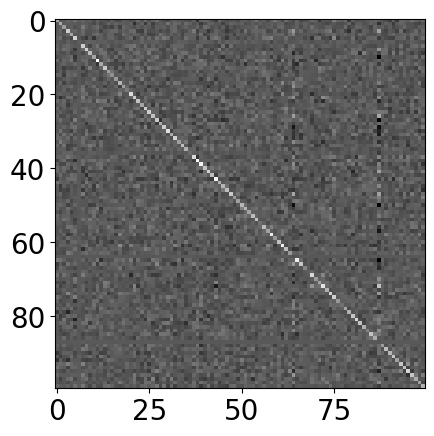

188.880725541844


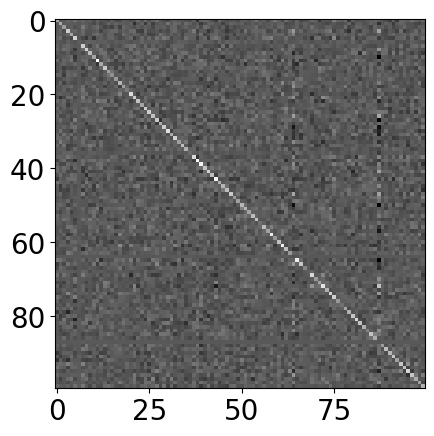

139.34555118637053


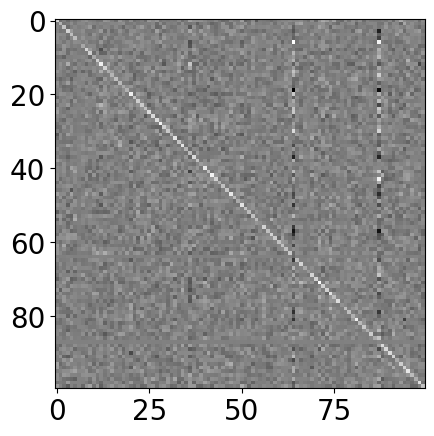

139.34555118637053


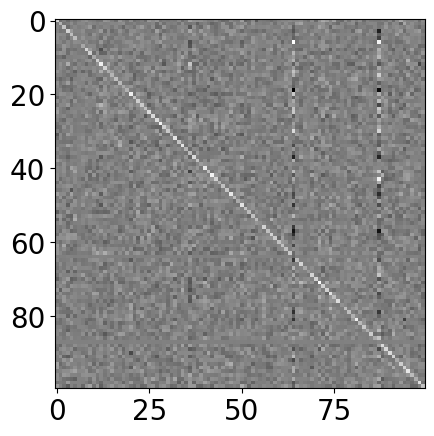

125.54517965444671


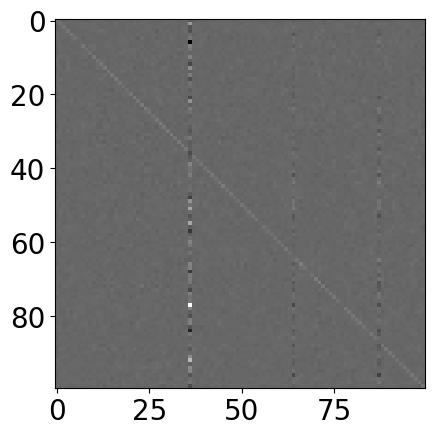

125.54517965444671


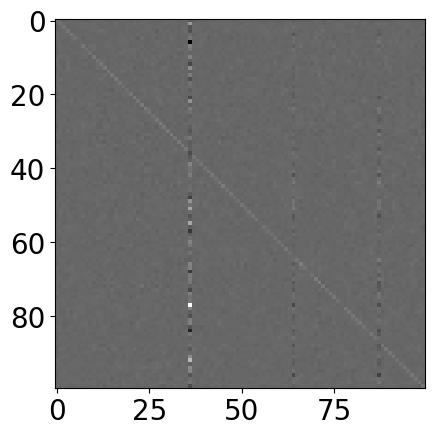

In [24]:
for l in range(len(model.h)):
    print(l)
    wvwo, wkwq = get_wkwq_wvwo(model, l, ablatewqwk=False,ablatewvwo=False)
    for h in range(wvwo.shape[0]):
        cm = wvwo[h,:,:]
        ctred_attr, id_idx, a,b,c,d = check_strong_id(cm)
        if ctred_attr > 100:
            print(ctred_attr)
            
            plt.rcdefaults()
            plt.rc('axes', titlesize=30)     # fontsize of the axes title
            plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
            plt.rc('xtick', labelsize=20)    # fontsize of the tick labels
            plt.rc('ytick', labelsize=20)    # fontsize of the tick labels
            plt.rc('legend', fontsize=25)    # legend fontsize
            plt.rc('figure', titlesize=30)  # fontsize of the figure title
            plt.rc('lines', linewidth=4)
            # plt.title(f'$W_KW_Q^T$ in Layer {l+1},\nHead {h+1} of GPT-2\n(zoomed in)')
            plt.imshow(cm[0:100,0:100].detach().cpu())
            # plt.set_cmap("hot")
            plt.set_cmap("gray")
            plt.savefig(f'figs/wkwq_layer{l}_head{h}_gpt2.pdf', bbox_inches='tight')
            plt.show()
        cm = wvwo[h,:,:]
        ctred_attr, id_idx, a,b,c,d = check_strong_id(cm)
        if ctred_attr > 100:
            print(ctred_attr)
            
            plt.rcdefaults()
            plt.rc('axes', titlesize=30)     # fontsize of the axes title
            plt.rc('axes', labelsize=30)    # fontsize of the x and y labels
            plt.rc('xtick', labelsize=20)    # fontsize of the tick labels
            plt.rc('ytick', labelsize=20)    # fontsize of the tick labels
            plt.rc('legend', fontsize=25)    # legend fontsize
            plt.rc('figure', titlesize=30)  # fontsize of the figure title
            plt.rc('lines', linewidth=4)
            # plt.title(f'$W_VW_O^T$ in Layer {l+1},\nHead {h+1} of GPT-2\n(zoomed in)')
            plt.imshow(cm[0:100,0:100].detach().cpu())
            # plt.set_cmap("hot")
            plt.set_cmap("gray")
            plt.savefig(f'figs/wvwo_layer{l}_head{h}_gpt2.pdf', bbox_inches='tight')
            plt.show()
        # if ctred_attr > 50:
            

### Discovering diagonals in products between different matrices of different heads

In [90]:
for l in range(len(model.h)):
    wvwo1, wkwq1 = get_wkwq_wvwo(model, l)
    for h in range(wvwo1.shape[0]):
        cm = wkwq1[h,:,:]
        if check_strong_id(cm) > 1000:
            plt.imshow(cm.detach().cpu())
            plt.show()

NameError: name 'model' is not defined

In [91]:
vals = []
for l in range(len(model.h)):
    print(l)
    wvwo1, _ = get_wkwq_wvwo(model, l)
    
    
    for m in range(l+1,len(model.h)): 
        _, wqwk2 = get_wkwq_wvwo(model, m)
        
        einsum_strs = ['ijk,skl->isjl', 'ijk,slk->isjl', 'ikj,slk->isjl', 'ikj,skl->isjl']
        for einsum_str in einsum_strs:
            mat = torch.einsum(einsum_str, wvwo1, wqwk2)

            for h in range(mat.shape[0]):
                for s in range(mat.shape[1]):
                    cm = mat[h,s,:,:]
                    vals.append((check_strong_id(cm), f'Layer {l}, head {h} -> Layer {m}, head {s}; {einsum_str}', (l, h, m, s, einsum_str)))
                    # print(vals[-1])
                    # if check_strong_id(cm):
                    #     plt.imshow(cm.detach().cpu())
                    #     plt.title(f'Layer {l}, head {h} -> Layer {m}, head {s}; {einsum_str}')
                    #     plt.show()
        
    

NameError: name 'model' is not defined

In [92]:
vals.sort()

In [93]:
def recon_mat(spec):
    l, h, m, s, einsum_str = spec
    wvwo1, _ = get_wkwq_wvwo(model, l)
    _, wqwk2 = get_wkwq_wvwo(model, m)
    mat = torch.einsum(einsum_str, wvwo1, wqwk2)
    cm = mat[h,s,:,:]
    return cm, wvwo1[h,:,:], wqwk2[s,:,:]

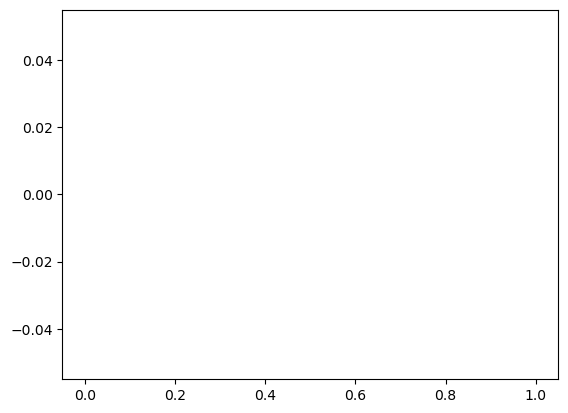

In [94]:
plt.hist([x[0][0] for x in vals],bins=1000)
plt.show()

In [ ]:
vals[-1]

In [ ]:
len(vals)

In [ ]:
hpairs = {}
for v in vals:
    # 4/math.sqrt(768)
    if v[0][0] < 4:
        continue
    currh = f'WKWQ Layer {v[-1][2]}, Head {v[-1][3]}'
    if currh not in hpairs.keys():
        hpairs[currh] = []
    hpairs[currh].append(f'WVWO Layer {v[-1][0]}, Head {v[-1][1]}')


In [ ]:
headpair_num_inter = [len(v) for k, v in hpairs.items()]  
plt.hist(headpair_num_inter,bins=100)
plt.show()

In [ ]:
sum(headpair_num_inter)

In [ ]:
for i in range(1,100):
    cv = vals[-i]
    cm, wvwo, wqwk = recon_mat(cv[-1])
    t = check_strong_id(wvwo)[0]
    k = check_strong_id(wqwk)[0]
    print(t,k,cv[0][0])
    print(cv[1])
    # if t < 0.5 and k < 0.5 and cv[0][0] > 3:
    #     print(i)
    # print(vals[-i][-1][-1])
    plt.figure(figsize=(10,3))
    # print(cv[1])
    plt.subplot(1,3,1)
    plt.imshow(cm.detach().cpu())
    plt.title(f'product, {cv[-1][-1]}')
    plt.subplot(1,3,2)
    plt.imshow(wvwo.detach().cpu())
    plt.title('wvwo')
    plt.subplot(1,3,3)
    plt.title('wqwk')
    plt.imshow(wqwk.detach().cpu())
    plt.show()

In [ ]:
# torch.einsum('kj,kl->jl', wvwo, wqwk) - cm

In [ ]:
plt.imshow(wvwo.detach().cpu())
plt.show()

In [ ]:
plt.imshow(wqwk.detach().cpu())
plt.show()

In [ ]:

    
    print(mats.shape)
    traces = []
    frobs = []
    for h in range(mats.shape[0]):
        traces.append(torch.trace(mats[h,:,:]).detach().cpu())
        frobs.append(torch.norm(mats[h,:,:]).detach().cpu())
    plt.hist(traces, label=f'tr {l}', range=[-1000,4000],bins=100)
    # plt.hist(frobs, label=f'frob {l}', range=[-1000,4000],bins=100)
    # plt.hist([traces[i] / frobs[i] for i in range(len(traces))], range=[-7,7], label=f' {l}', bins=100)
    plt.legend()
    plt.show()
    
    
    # Ablation study -- remove diagonal part
    for h in range(mats.shape[0]):
        cm = mats[h,:,:]
        print(torch.trace(cm))
        # U,S,V = torch.linalg.svd(cm)
        # print(torch.norm(cm))
        # # print(S)
        # print(torch.norm(U @ torch.diag(S) @ V - cm))
        
        cm = cm - torch.diag(torch.diag(cm))
        print(torch.trace(cm))
        U,S,V = torch.linalg.svd(cm)
        S[64:] = 0
        # print(U @ torch.diag(S) @ V - cm)
        print(torch.trace(U @ torch.diag(S) @ V))
        assert(False)
        # print(mats[h,:,:])
    
    traces = []
    frobs = []
    for h in range(mats.shape[0]):
        traces.append(torch.trace(mats[h,:,:]).detach().cpu())
        frobs.append(torch.norm(mats[h,:,:]).detach().cpu())
    # plt.hist(traces, label=f'tr {l}', range=[-1000,4000],bins=100)
    # plt.hist(frobs, label=f'frob {l}', range=[-1000,4000],bins=100)
    plt.hist([traces[i] / frobs[i] for i in range(len(traces))], range=[-7,7], label=f'rm {l}', bins=100)
    plt.legend()
    plt.show()
    # 
    
plt.title(f'$W_KW_Q^T$ traces')
plt.legend()
plt.show()
        # plt.imshow(mats[h,:,:].detach().cpu())
        # plt.title(f'$W_KW_Q^T$, Layer {l}, Head {h}')
        # plt.show()
    # assert(False)

In [ ]:
wtcross = model.wte.weight @ model.wte.weight.T
torch.sum(wtcross)
plt.imshow(wtcross.detach().cpu())
plt.show()
torch.mean(torch.diag(wtcross))
torch.mean(wtcross)

## MLP with XX^T

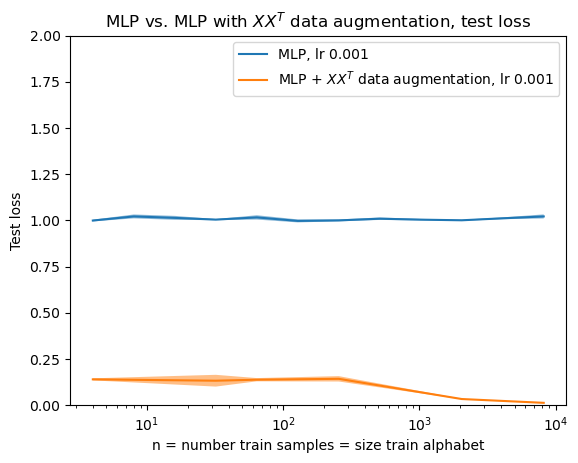

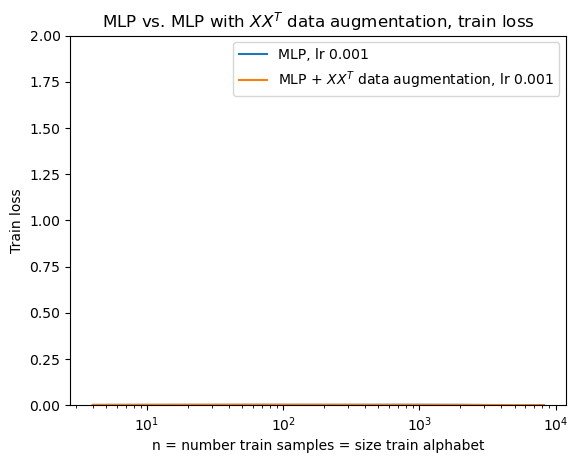

In [95]:
configs = {}
lrs = [1e-3]
ns = [4, 32, 64, 256, 2048, 8192]
num_trials = 2
depth = 2
hidden_dim = 128
lrs.sort()
xxt_scaling = 1.0
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'assoc_memory_mlpwithxxt_xxtscaling{xxt_scaling}_depth{depth}_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): [-1, 1],
                      ('data', 'label_type'): 'regression',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'mlp_with_xxt',
                      ('model', 'hidden_dim'): hidden_dim,
                      ('model', 'depth'): depth,
                      ('model', 'xxt_scaling'): xxt_scaling,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

            
task_add_fcnet_depth3_aba_abb(task_label='MLP, ')
add_to_plot_config_dict(configs, ns, lrs, 'n', 'MLP + $XX^T$ data augmentation, lr', num_trials=num_trials, logscale2=True)
plot_config_dict(title1='MLP vs. MLP with $XX^T$ data augmentation, test loss', labelx1='n = number train samples = size train alphabet', labely1='Test loss', plot2=False,
                 savefile1='figs/mlp_concat_XXT_gotu.pdf')

task_add_fcnet_depth3_aba_abb(task_label='MLP, ', config_func=get_best_train)
add_to_plot_config_dict(configs, ns, lrs, 'n', 'MLP + $XX^T$ data augmentation, lr', num_trials=num_trials, logscale2=True, config_func=get_best_train)
plot_config_dict(title1='MLP vs. MLP with $XX^T$ data augmentation, train loss', labelx1='n = number train samples = size train alphabet', labely1='Train loss', plot2=False,
                 savefile1='figs/mlp_concat_XXT_train.pdf')

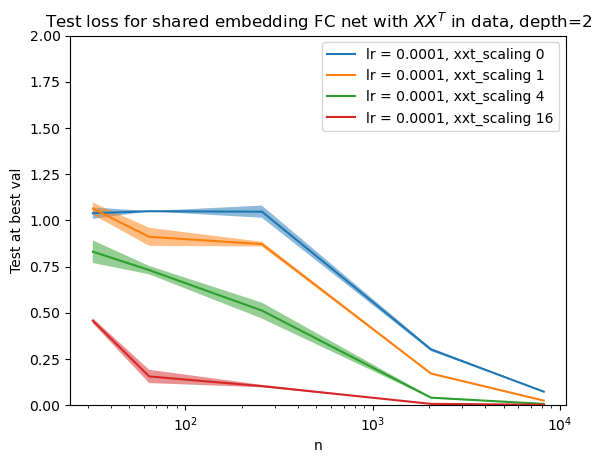

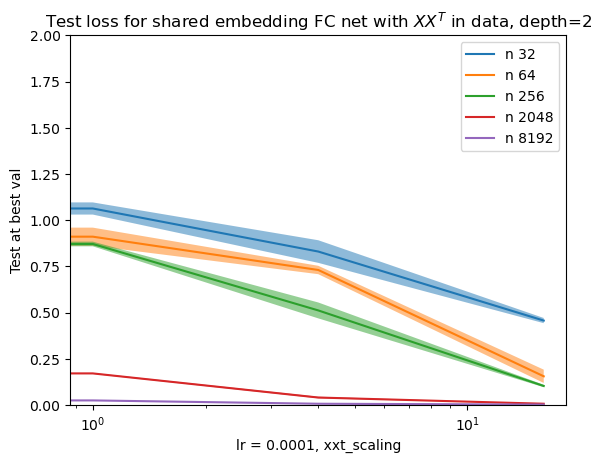

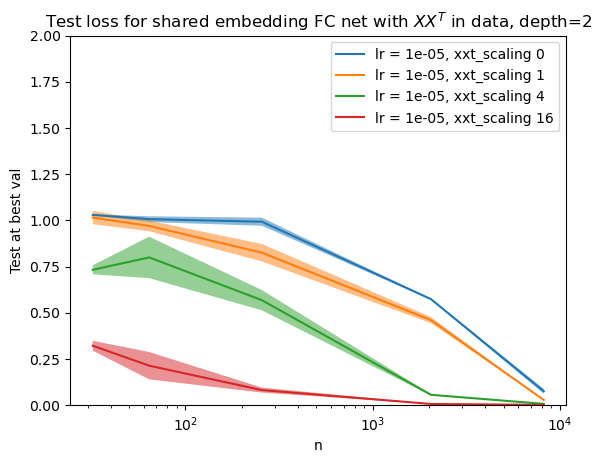

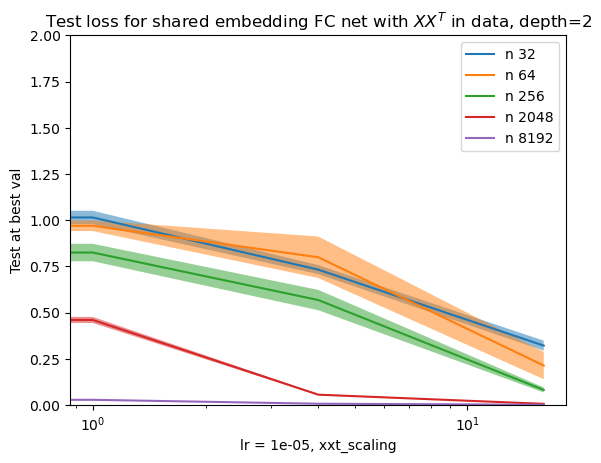

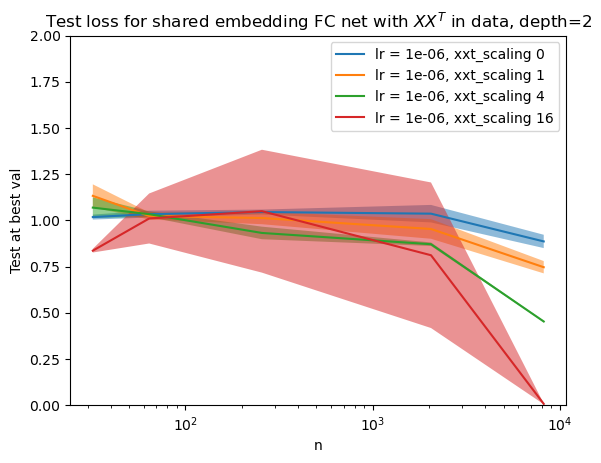

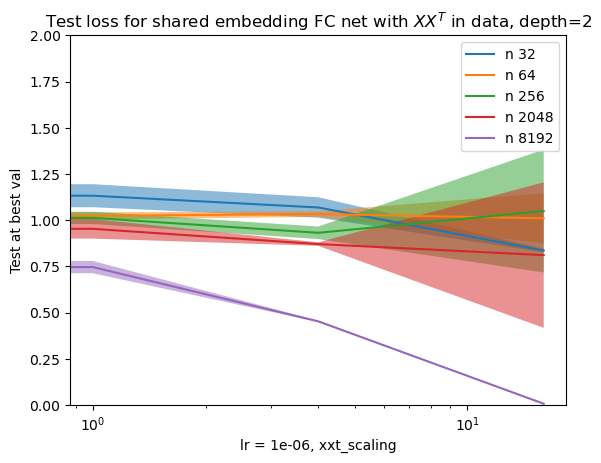

In [96]:
configs = {}
lrs = [1e-4, 1e-5, 1e-6] # , # 1e-4
xxt_scalings = [0, 1, 4, 16]
hidden_dim = 128 # 128
for lr in lrs:
    ns = [32, 64, 256, 2048, 8192]
    num_trials = 2
    depth = 2
    for trialnum in range(num_trials):
        for xxt_scaling in xxt_scalings:
            for n in ns:
                config = {('logging', 'task_name') : f'assoc_memory_mlpsharedembeddingXXT_xxtscaling{xxt_scaling}_depth{depth}_hiddendim{hidden_dim}_trainsamples{n}_trainsas{n}_lr{lr}_trial{trialnum}',
                          ('data', 'templates'): ['#$$', '#$#'],
                          ('data', 'wildcards'): '#$',
                          ('data', 'template_probs'): [0.5, 0.5],
                          ('data', 'template_labels'): [-1, 1],
                          ('data', 'label_type'): 'regression',

                          ('data', 'num_train_samples'): n,
                          ('data', 'train_substitution_alphabet_size') : n,
                          ('data', 'num_val_samples'): 100,
                          ('data', 'val_substitution_alphabet_size') : 100,
                          ('data', 'num_test_samples'): 100,
                          ('data', 'test_substitution_alphabet_size') : 100,

                          ('training', 'lr'): lr,
                          ('training', 'epochs'): 1000,
                          ('training', 'batch_size'): 1024,
                          ('training', 'num_workers'): 8,
                          ('training', 'optimizer'): 'adam',
                          ('training', 'lazy') : False,

                          ('model', 'type'): 'mlp_sharedembedding_with_XXT',
                          ('model', 'hidden_dim'): hidden_dim,
                          ('model', 'xxt_scaling'): xxt_scaling,
                          ('model', 'depth'): depth,
                         }
                configs[(n, xxt_scaling, trialnum)] = config
                # # print(config[('logging', 'task_name')])
                run_experiment_from_config(config, verbose=False)


    add_to_plot_config_dict(configs, ns, xxt_scalings, 'n', f'lr = {lr}, xxt_scaling', num_trials=num_trials, logscale2=True)
    curr_title = f'Test loss for shared embedding FC net with $XX^T$ in data, depth={depth}'
    plot_config_dict(title1=curr_title, title2=curr_title)

## Multi-class classification variant

#### Transformer, associative memory where labels are wildcards

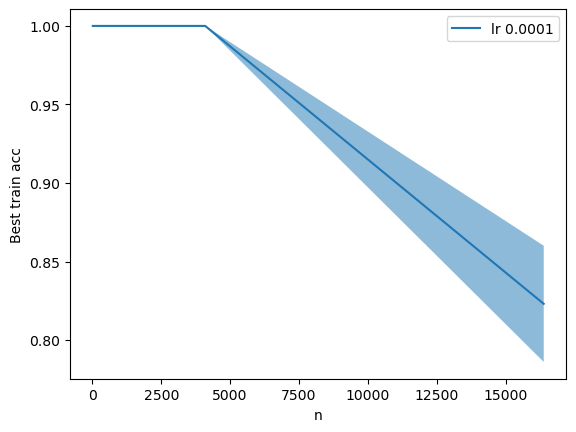

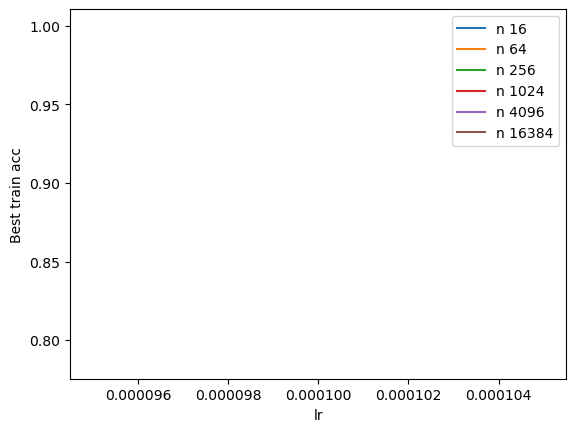

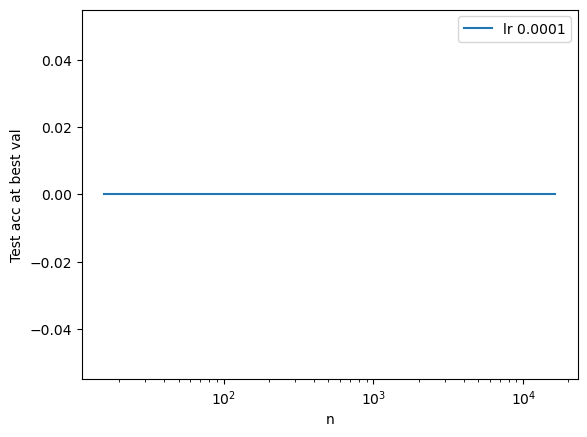

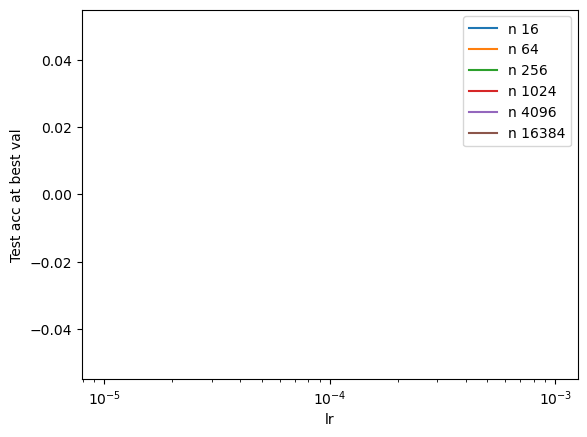

In [97]:
configs = {}
lrs = [1e-4]
ns = [16, 64, 256, 1024, 4096, 16384]
num_trials = 2
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'outputrepeated_multiclass_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): ['$', '#'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
plot_config_dict()

#### Transformer, associative memory where labels are regular tokens

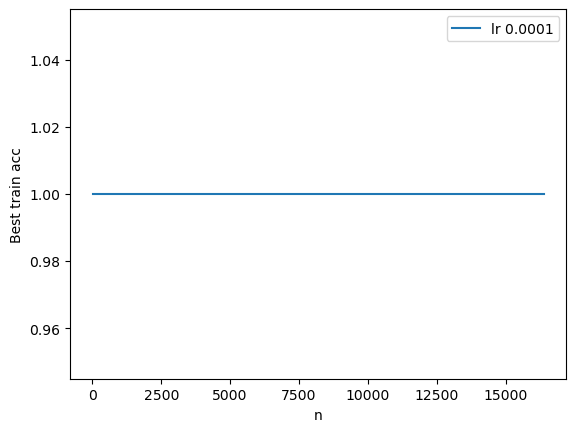

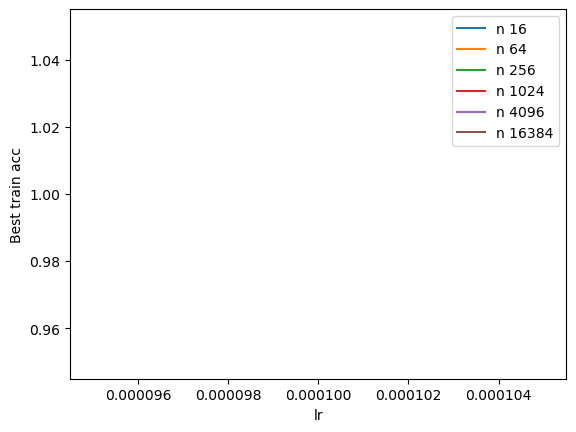

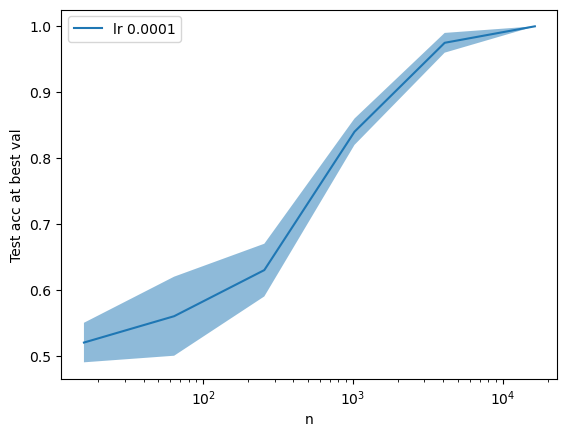

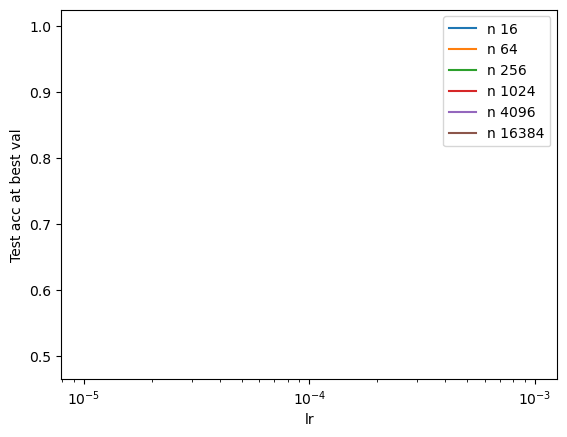

In [98]:
configs = {}
# lrs = [1e-4]
# ns = [16, 64, 256, 1024, 4096, 16384]
lrs = [1e-4]
ns = [16, 64, 256, 1024, 4096, 16384]
num_trials = 2
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'assoc_memory_multiclass_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): ['A', 'B'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)
            
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
plot_config_dict()

#### Pretrained GPT-2, associative memory where labels are wildcards

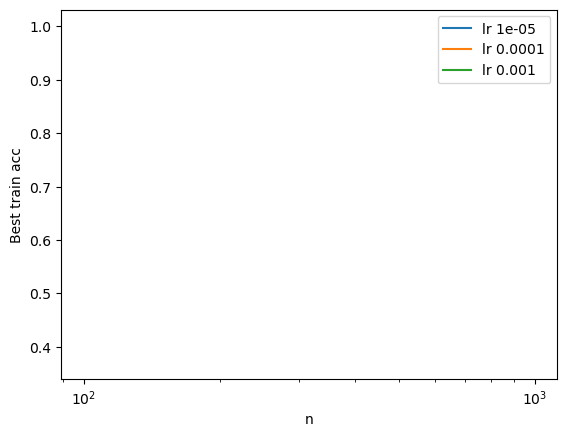

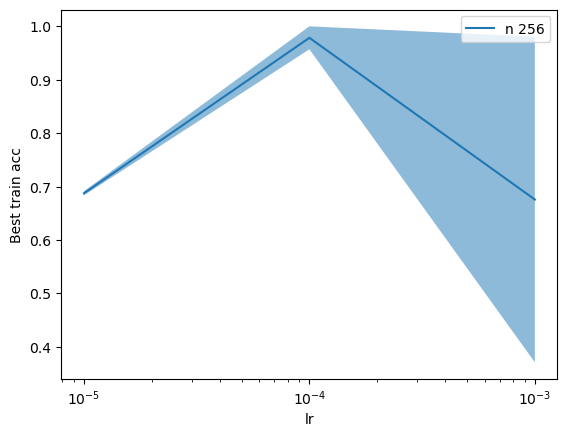

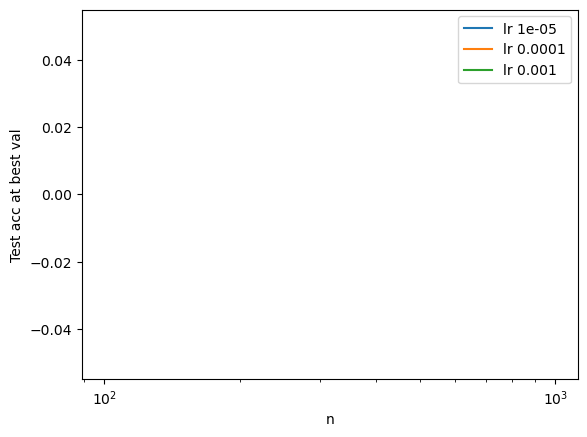

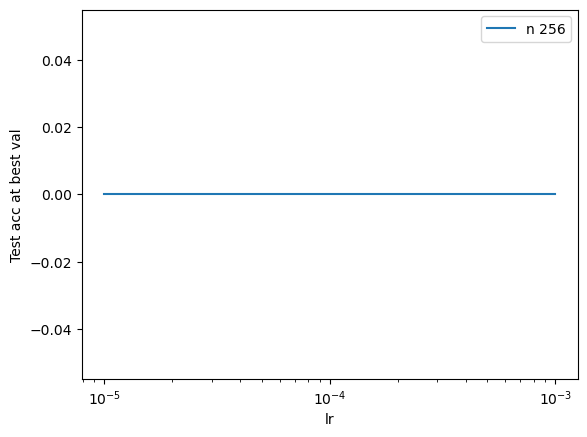

In [99]:
configs = {}
lrs = [1e-5, 1e-4, 1e-3] # 1e-4,  # 1e-3, 1e-4, 1e-5 # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [256] # , 1024, 4096, 16384 #, 16, 64 , 
num_trials = 2
epochs = 2000
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            epochs_str = ''
            if epochs != 1000:
                epochs_str = f'_epochs{epochs}'
            config = {('logging', 'task_name') : f'copyout_multiclass_gpt2{epochs_str}_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#'],
                      ('data', 'wildcards'): '#',
                      ('data', 'template_probs'): [1],
                      ('data', 'template_labels'): ['#'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): epochs,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)
            
ns.sort()
lrs.sort()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_best_train_acc, ylim=None)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
plot_config_dict()

#### Pretrained GPT-2, associative memory where labels are tokens

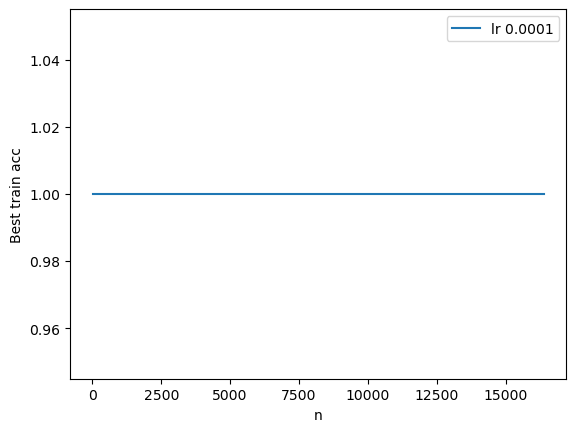

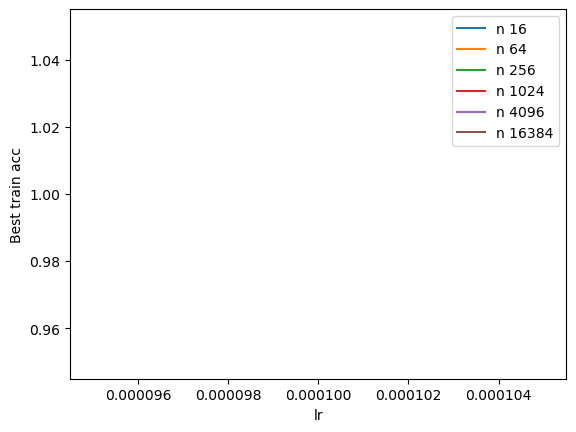

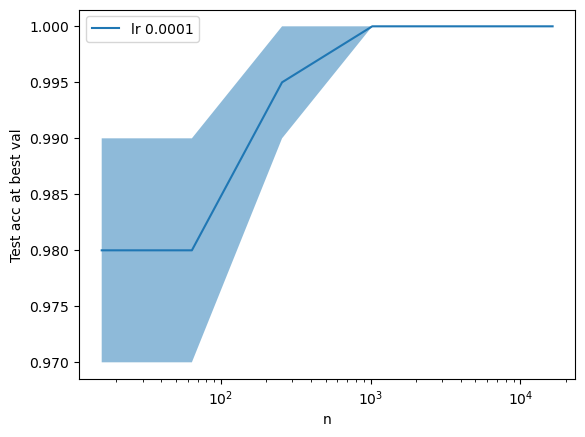

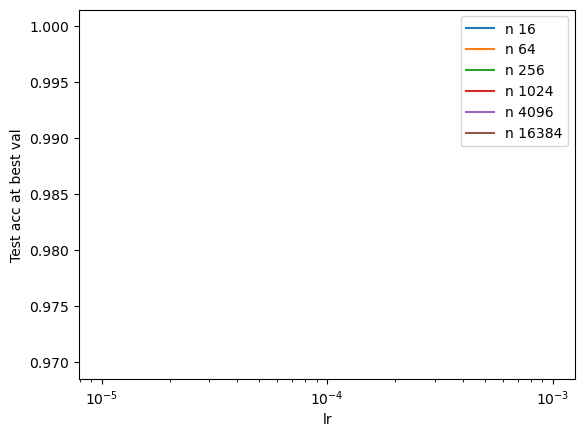

In [100]:
configs = {}
# lrs = [1e-4]
# ns = [16, 64, 256, 1024, 4096, 16384]
lrs = [1e-4]
ns = [16, 64, 256, 1024, 4096, 16384]
num_trials = 2
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'assoc_memory_multiclass_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$$', '#$#'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): ['A', 'B'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)
            
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
plot_config_dict()

### Symlink explorations

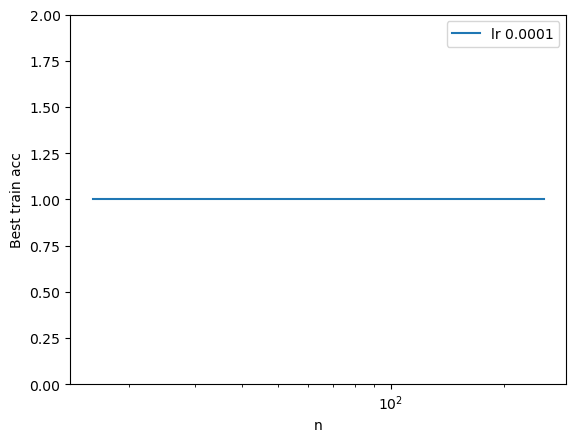

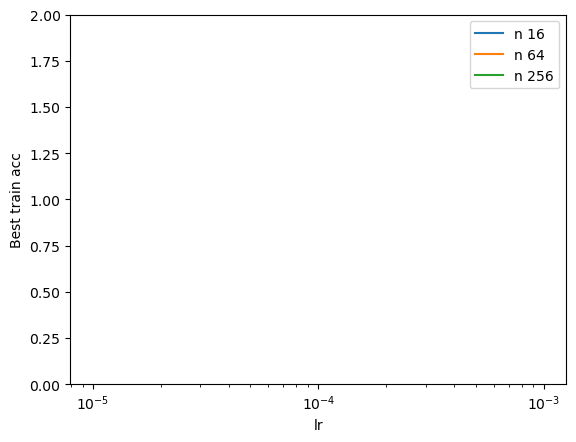

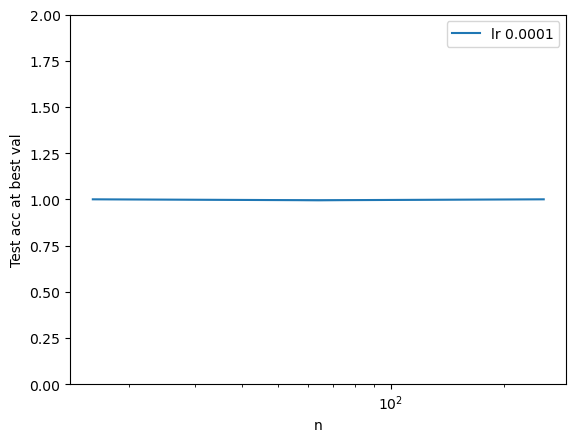

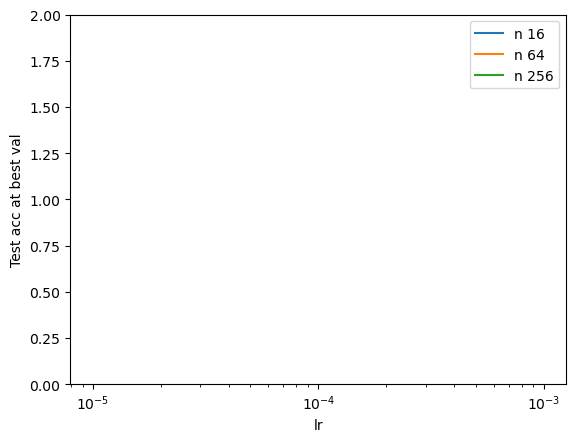

In [101]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256]
num_symlinks = 3
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'copyout_multiclass_numsymlinks{num_symlinks}_multiclass_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#'],
                      ('data', 'wildcards'): '#',
                      ('data', 'template_probs'): [1],
                      ('data', 'template_labels'): ['#'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

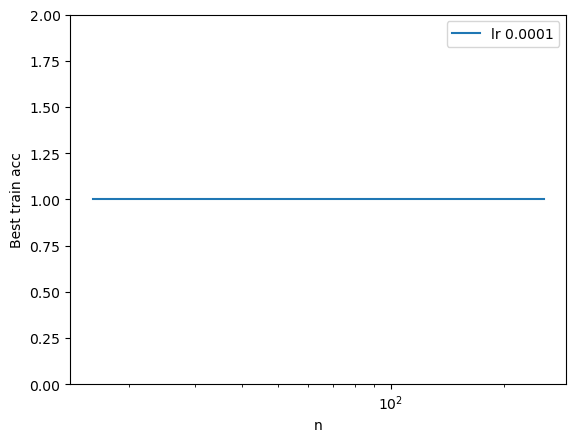

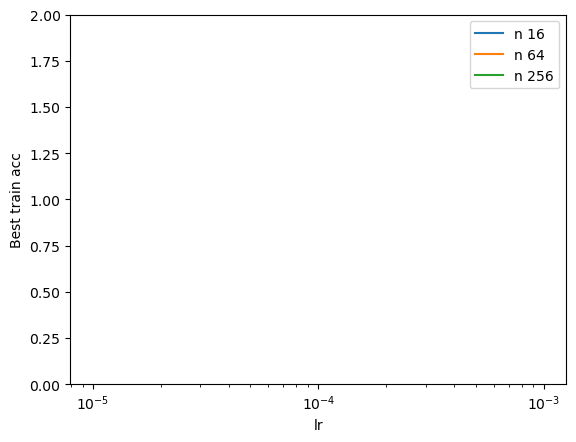

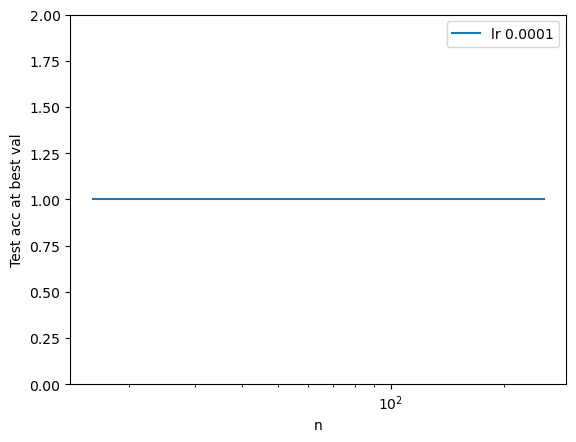

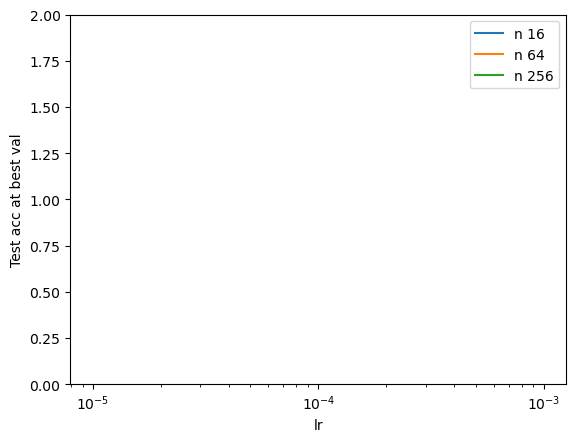

In [102]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256]
num_symlinks = 3
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'majority3_multiclass_numsymlinks{num_symlinks}_multiclass_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['###', '##$', '#$#', '#$$'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.25, 0.25, 0.25, 0.25],
                      ('data', 'template_labels'): ['#', '#', '#', '$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

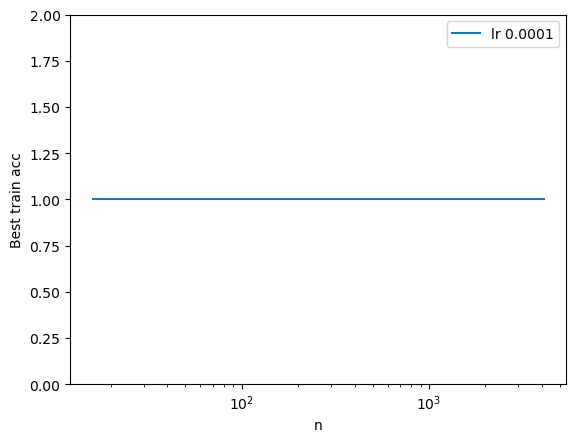

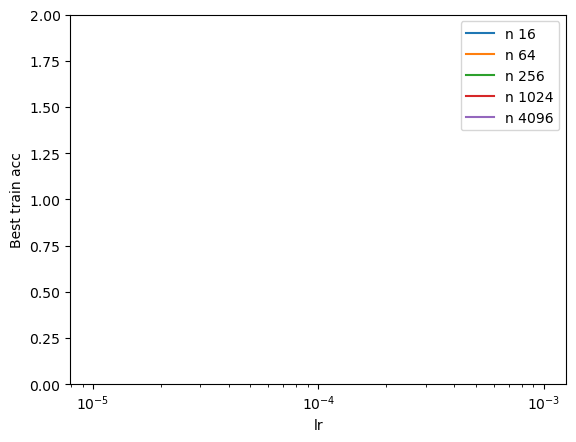

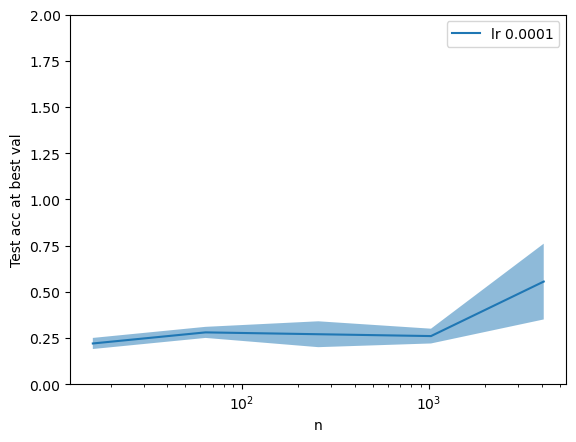

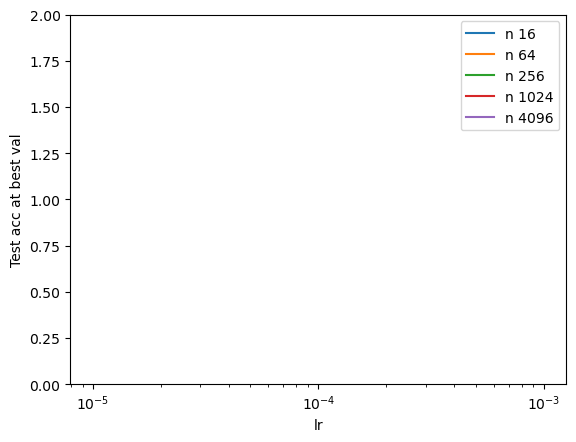

In [103]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256, 1024, 4096]
num_symlinks = 3
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'majority3regtest_multiclass_numsymlinks{num_symlinks}_multiclass_gpt2fromscratch_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['###', '##$', '#$#', '#$$'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.25]*4,
                      ('data', 'template_labels'): ['A','B','C','D'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'from_scratch',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

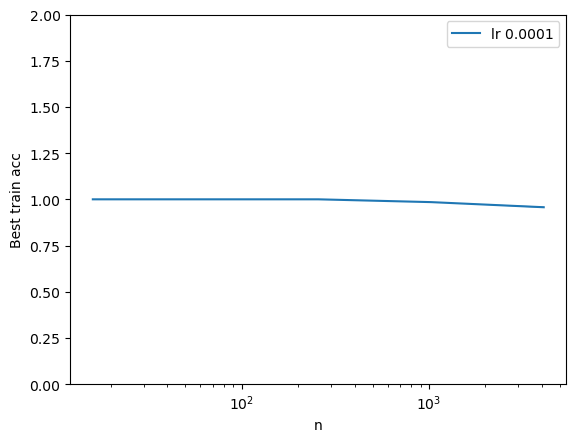

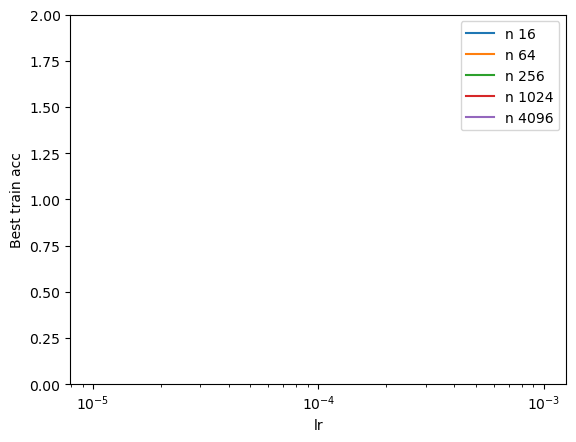

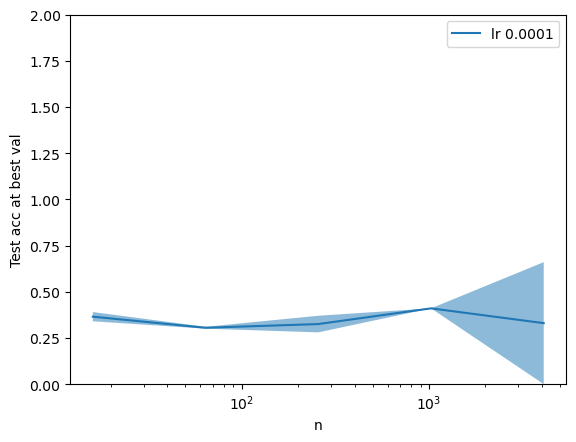

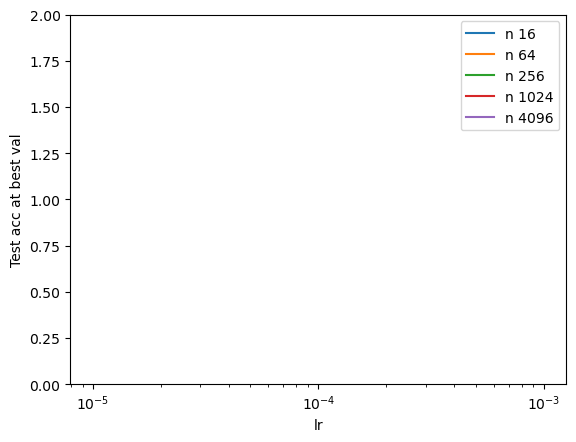

In [104]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256, 1024, 4096]
num_symlinks = 3
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'minority3_multiclass_numsymlinks{num_symlinks}_multiclass_gpt2fromscratch_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['##$', '#$#', '$##'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [1/3, 1/3, 1/3],
                      ('data', 'template_labels'): ['$','$','$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'from_scratch',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

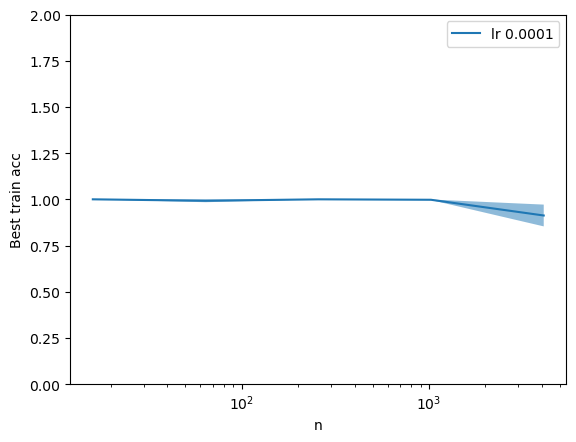

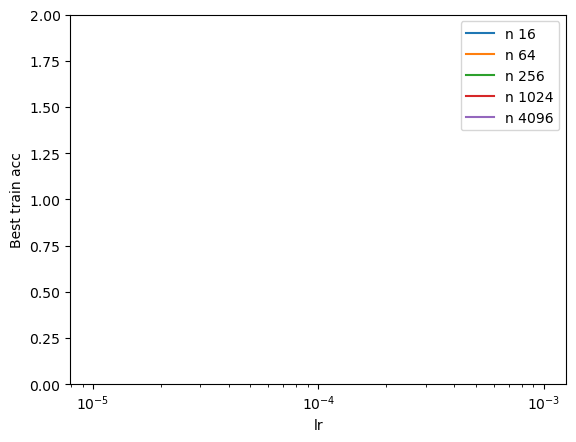

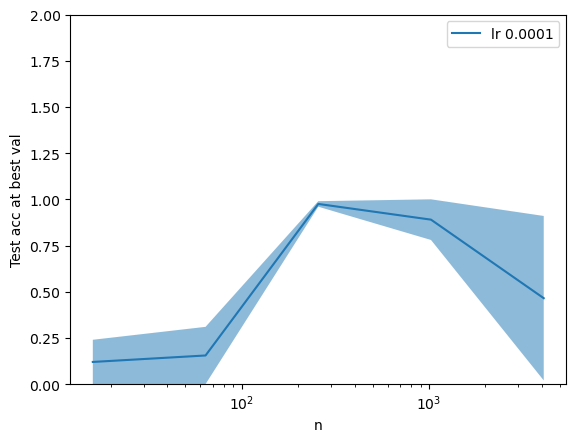

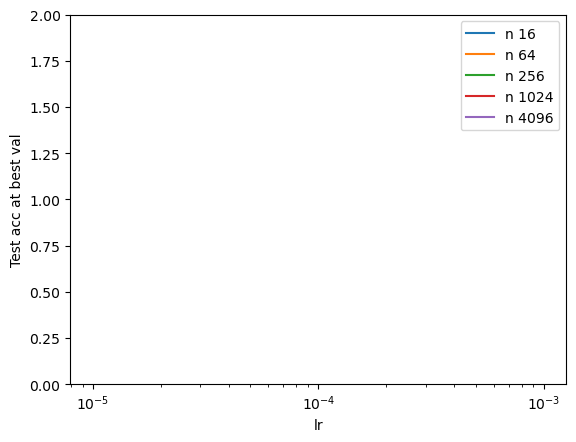

In [105]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256, 1024, 4096]
num_symlinks = 3
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'minority3_multiclass_numsymlinks{num_symlinks}_multiclass_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['##$', '#$#', '$##'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [1/3, 1/3, 1/3],
                      ('data', 'template_labels'): ['$','$','$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

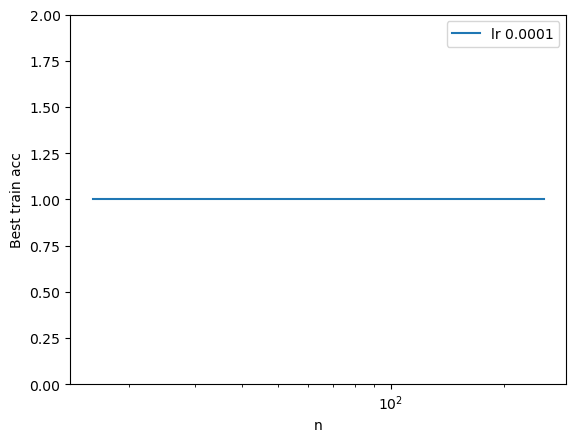

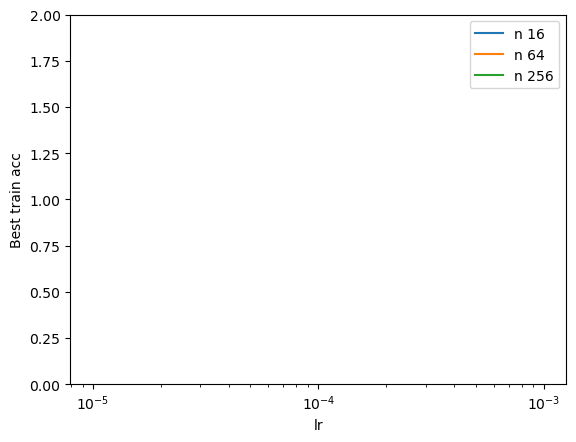

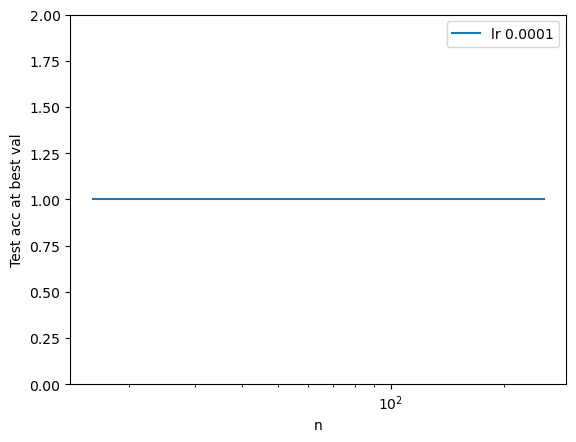

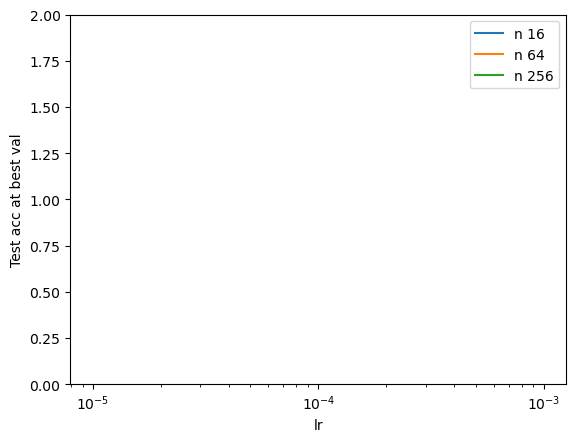

In [106]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256]
num_symlinks = 3
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'majority3_multiclass_numsymlinks{num_symlinks}_multiclass_gpt2fromscratch_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['###', '##$', '#$#', '#$$'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.25, 0.25, 0.25, 0.25],
                      ('data', 'template_labels'): ['#', '#', '#', '$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'from_scratch',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

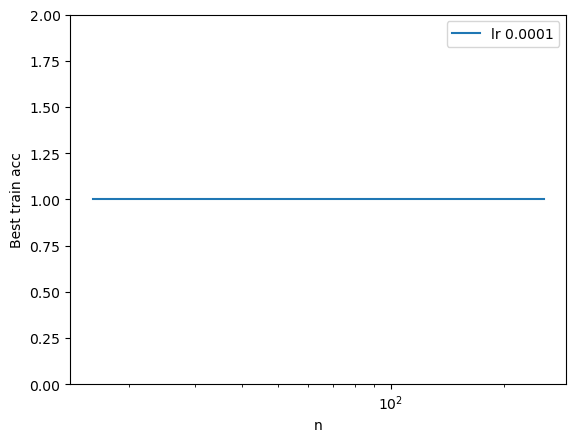

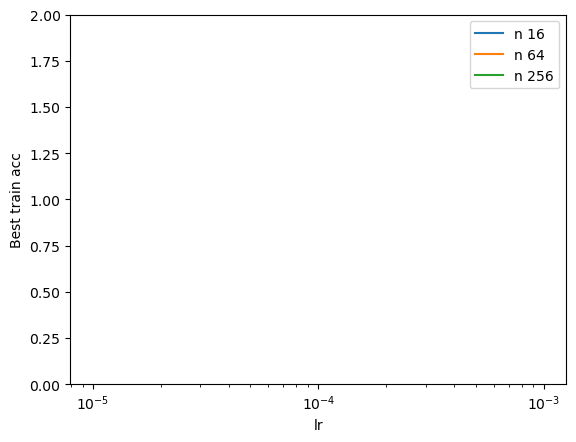

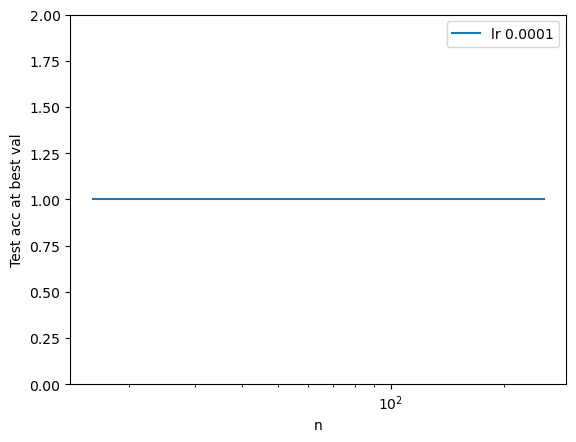

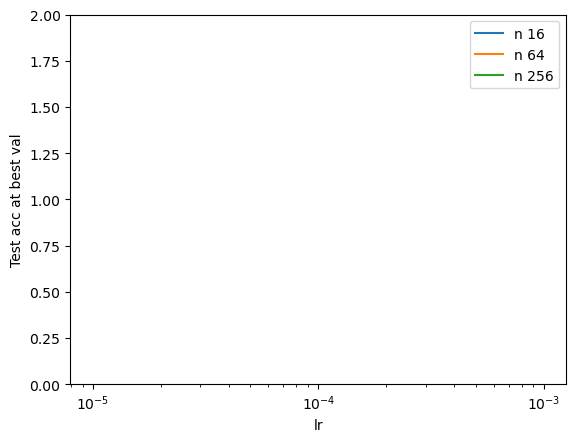

In [107]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256]
num_symlinks = 3
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'assoc_memory_multiclass_numsymlinks{num_symlinks}_multiclass_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#$#', '#$$'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [0.5, 0.5],
                      ('data', 'template_labels'): ['#', '$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

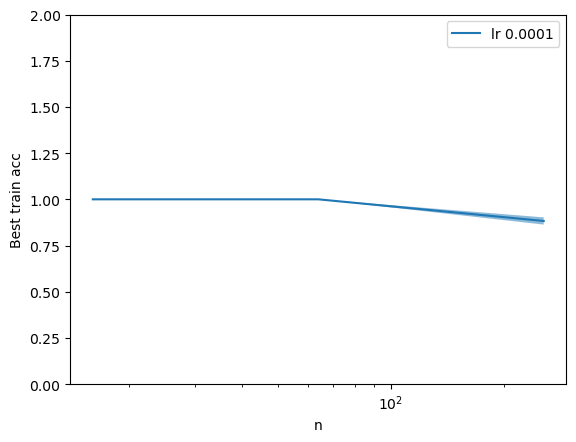

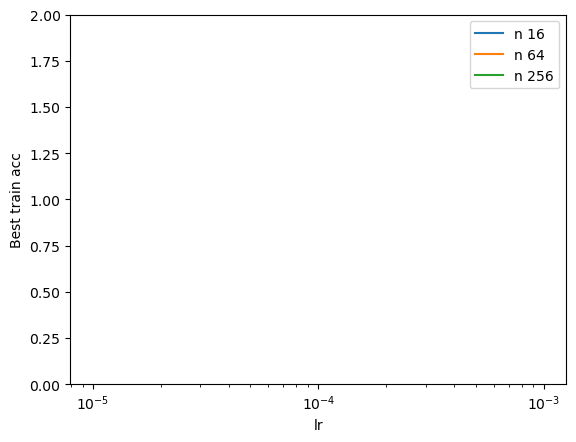

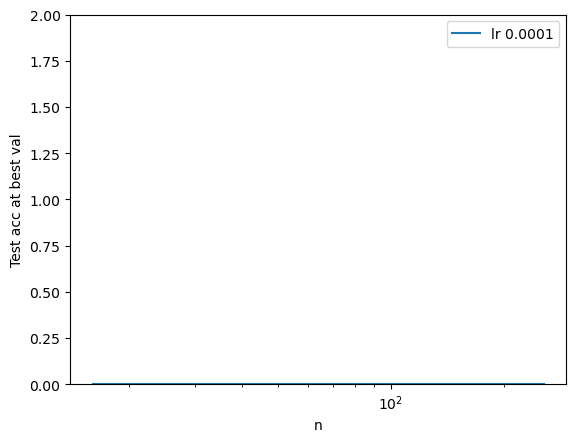

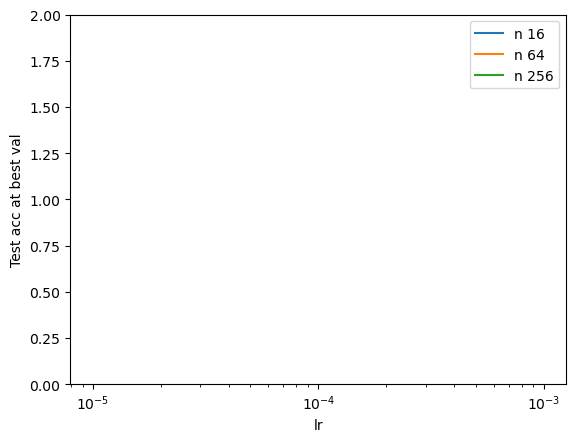

In [108]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256]
num_symlinks = 0
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'copyout_numsymlinks{num_symlinks}_multiclass_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#'],
                      ('data', 'wildcards'): '#',
                      ('data', 'template_probs'): [1],
                      ('data', 'template_labels'): ['#'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

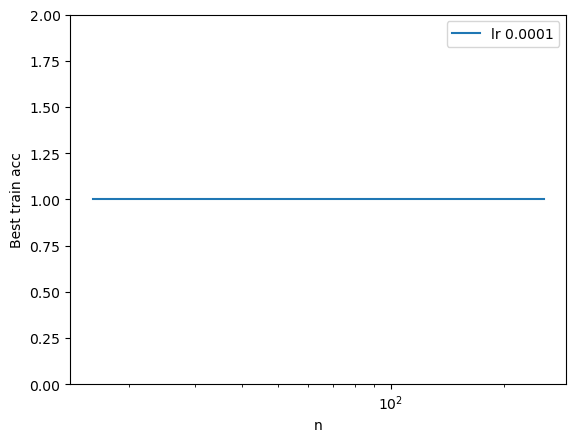

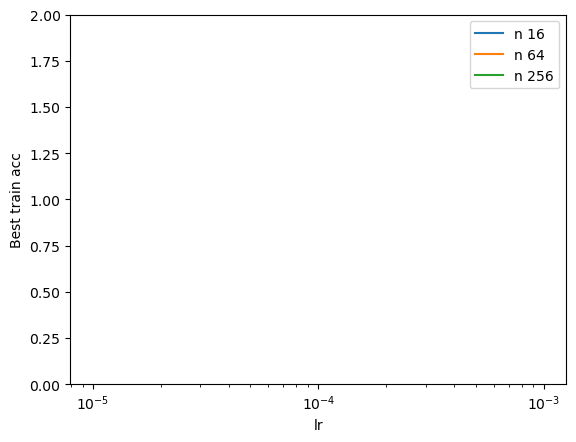

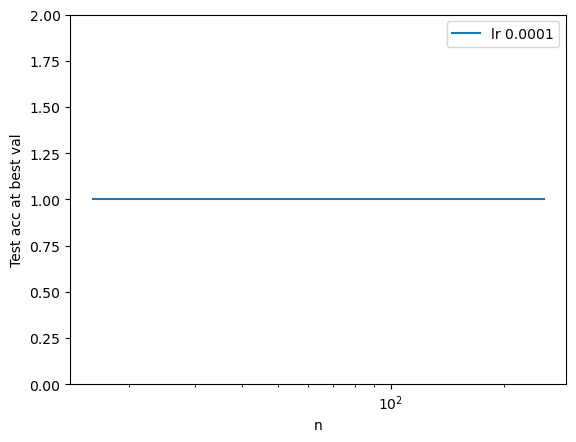

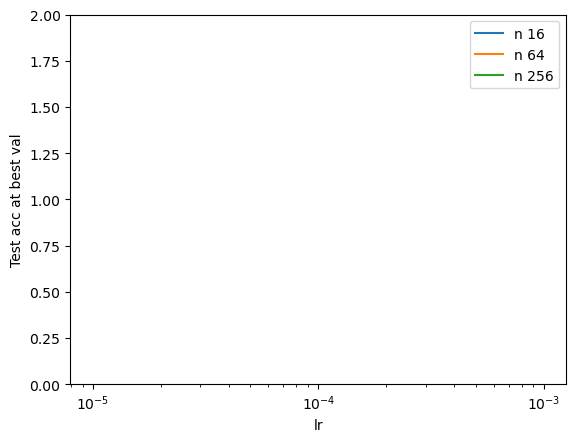

In [109]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256]
num_symlinks = 1
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'copyout_numsymlinks{num_symlinks}_multiclass_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#'],
                      ('data', 'wildcards'): '#',
                      ('data', 'template_probs'): [1],
                      ('data', 'template_labels'): ['#'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

### Multiclass with tied-embedding transformers

In [110]:
configs = {}
lr = 1e-4
ns = [16, 64, 256]
num_trials = 1
vocab_size = 50000
wkwq_id_mult = 100
wvwo_id_mult = 100
embed_dims = [128, 512, 1024]
for trialnum in range(num_trials):
    for embed_dim in embed_dims:
        for n in ns:
            embed_dim_str = ''
            if embed_dim != 128:
                embed_dim_str = f'embeddim{embed_dim}_'
            config = {('logging', 'task_name') : f'minority3_transformertied_wvwoidmult{wvwo_id_mult}_wkwqidmult{wkwq_id_mult}_vocsize{vocab_size}_copyout_multiclass_{n}trainsamples_{n}trainsas_lr{lr}{embed_dim_str}_trial{trialnum}',
                      ('data', 'templates'): ['##$', '#$#', '$##'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [1/3, 1/3, 1/3],
                      ('data', 'template_labels'): ['$','$','$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer_tiedembeddingunembedding',
                      ('model', 'embed_dim'): embed_dim,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                      ('model', 'input_alphabet_size') : vocab_size,
                      ('model', 'trainable_wvwo_identity') : True,
                      ('model', 'wvwo_id_mult') : wvwo_id_mult,
                      ('model', 'trainable_wkwq_identity') : True,
                      ('model', 'wkwq_id_mult') : wkwq_id_mult
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

# add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
# plot_config_dict()
# add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
# plot_config_dict()

In [111]:
configs = {}
lr = 1e-4
ns = [16, 64, 256, 1024, 4096, 16384]
num_trials = 2
vocab_size = 50000
wkwq_id_mult = 1
wvwo_id_mult = 1
embed_dims = [1024, 128, 512]
for trialnum in range(num_trials):
    for embed_dim in embed_dims:
        for n in ns:
            embed_dim_str = ''
            if embed_dim != 128:
                embed_dim_str = f'embeddim{embed_dim}_'
            config = {('logging', 'task_name') : f'minority3_transformertied_wvwoidmult{wvwo_id_mult}_wkwqidmult{wkwq_id_mult}_vocsize{vocab_size}_copyout_multiclass_{n}trainsamples_{n}trainsas_lr{lr}{embed_dim_str}_trial{trialnum}',
                      ('data', 'templates'): ['##$', '#$#', '$##'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [1/3, 1/3, 1/3],
                      ('data', 'template_labels'): ['$','$','$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer_tiedembeddingunembedding',
                      ('model', 'embed_dim'): embed_dim,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                      ('model', 'input_alphabet_size') : vocab_size,
                      ('model', 'trainable_wvwo_identity') : True,
                      ('model', 'wvwo_id_mult') : wvwo_id_mult,
                      ('model', 'trainable_wkwq_identity') : True,
                      ('model', 'wkwq_id_mult') : wkwq_id_mult
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

# add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
# plot_config_dict()
# add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
# plot_config_dict()

In [112]:
configs = {}
lr = 1e-4
ns = [16, 64, 256, 1024, 4096, 16384]
num_trials = 2
vocab_size = 50000
wkwq_id_mult = 1
embed_dims = [1024, 128, 512]
for trialnum in range(num_trials):
    for embed_dim in embed_dims:
        for n in ns:
            embed_dim_str = ''
            if embed_dim != 128:
                embed_dim_str = f'embeddim{embed_dim}_'
            config = {('logging', 'task_name') : f'minority3_transformertied_wkwqidmult{wkwq_id_mult}_vocsize{vocab_size}_copyout_multiclass_{n}trainsamples_{n}trainsas_lr{lr}{embed_dim_str}_trial{trialnum}',
                      ('data', 'templates'): ['##$', '#$#', '$##'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [1/3, 1/3, 1/3],
                      ('data', 'template_labels'): ['$','$','$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer_tiedembeddingunembedding',
                      ('model', 'embed_dim'): embed_dim,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                      ('model', 'input_alphabet_size') : vocab_size,
                      # ('model', 'trainable_wvwo_identity') : False,
                      # ('model', 'wvwo_id_mult') : wvwo_id_mult,
                      ('model', 'trainable_wkwq_identity') : True,
                      ('model', 'wkwq_id_mult') : wkwq_id_mult
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

# add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
# plot_config_dict()
# add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
# plot_config_dict()

In [113]:
configs = {}
lr = 1e-4
ns = [16, 64, 256, 1024, 4096, 16384]
num_trials = 2
vocab_size = 50000
wvwo_id_mult = 100
embed_dims = [1024, 128, 512]
for trialnum in range(num_trials):
    for embed_dim in embed_dims:
        for n in ns:
            embed_dim_str = ''
            if embed_dim != 128:
                embed_dim_str = f'embeddim{embed_dim}_'
            config = {('logging', 'task_name') : f'minority3_transformertied_trainwvwoid_wvwoidmult{wvwo_id_mult}_vocsize{vocab_size}_copyout_multiclass_{n}trainsamples_{n}trainsas_lr{lr}{embed_dim_str}_trial{trialnum}',
                      ('data', 'templates'): ['##$', '#$#', '$##'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [1/3, 1/3, 1/3],
                      ('data', 'template_labels'): ['$','$','$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer_tiedembeddingunembedding',
                      ('model', 'embed_dim'): embed_dim,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                      ('model', 'input_alphabet_size') : vocab_size,
                      ('model', 'trainable_wvwo_identity') : True,
                      ('model', 'wvwo_id_mult') : wvwo_id_mult
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

# add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
# plot_config_dict()
# add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
# plot_config_dict()

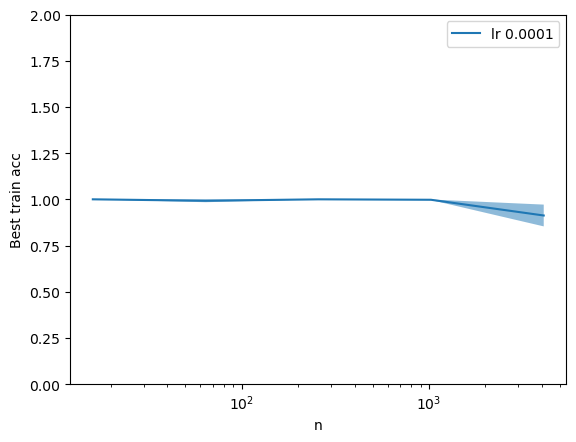

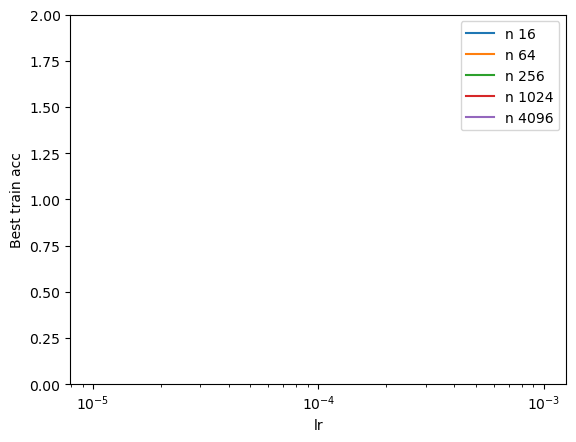

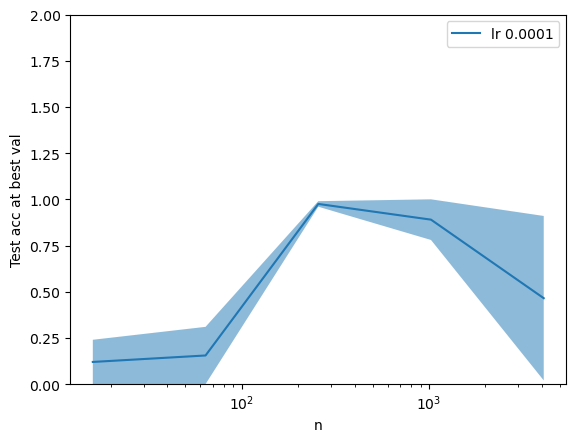

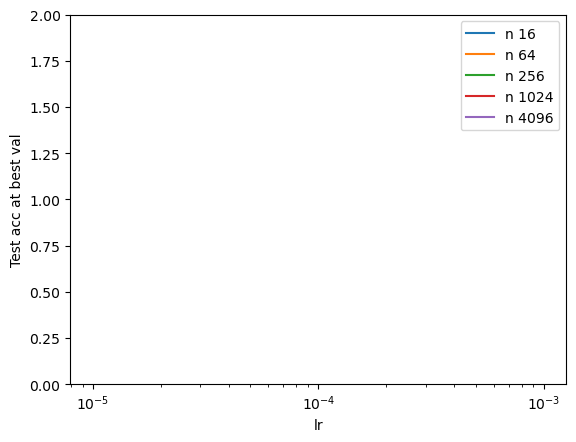

In [114]:
configs = {}
lrs = [1e-4] # ,1e-3,1e-5 # , 3e-2, 3e-3, 1e-2, 1e-1, 3e-4, 1e-4
ns = [16, 64, 256, 1024, 4096]
num_symlinks = 3
num_trials = 2
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'minority3_multiclass_numsymlinks{num_symlinks}_multiclass_gpt2_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['##$', '#$#', '$##'],
                      ('data', 'wildcards'): '#$',
                      ('data', 'template_probs'): [1/3, 1/3, 1/3],
                      ('data', 'template_labels'): ['$','$','$'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'pretrained',
                      ('model', 'name') : 'gpt2',
                      ('model', 'num_symlinks') : num_symlinks,
                      ('model', 'alpha') : 1,
                     }
            configs[(n, lr, trialnum)] = config
            # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

lrs.sort()
clear_plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_best_train_acc)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True,config_func=get_test_acc_at_best_val)
plot_config_dict()

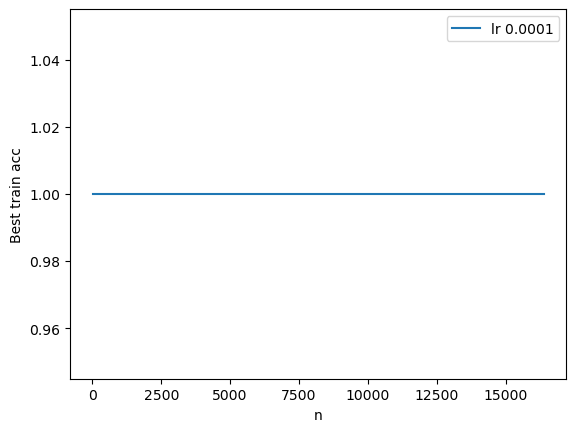

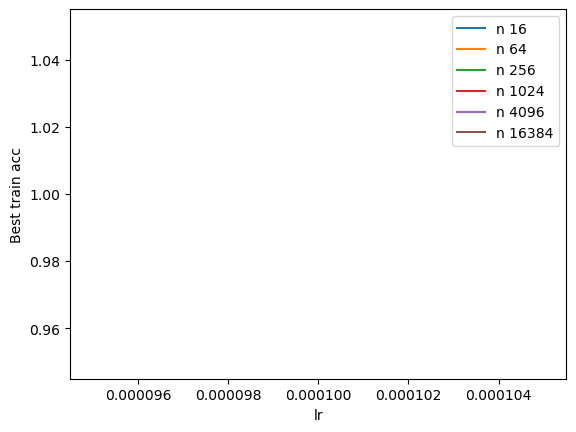

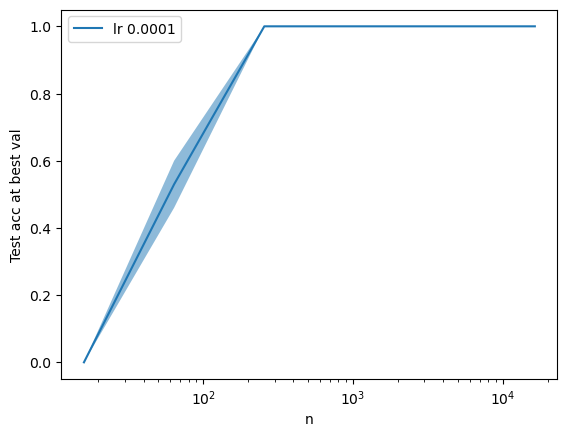

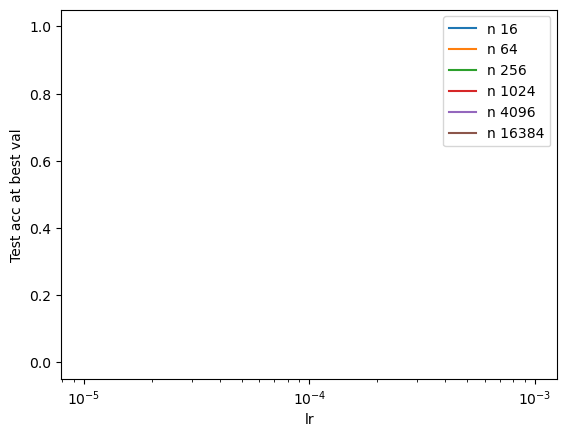

In [115]:
configs = {}
lrs = [1e-4]
ns = [16, 64, 256, 1024, 4096, 16384]
num_trials = 2
vocab_size = 50000
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'transformertied_vocsize{vocab_size}_copyout_multiclass_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#'],
                      ('data', 'wildcards'): '#',
                      ('data', 'template_probs'): [1],
                      ('data', 'template_labels'): ['#'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer_tiedembeddingunembedding',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                      ('model', 'input_alphabet_size') : vocab_size,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
plot_config_dict()

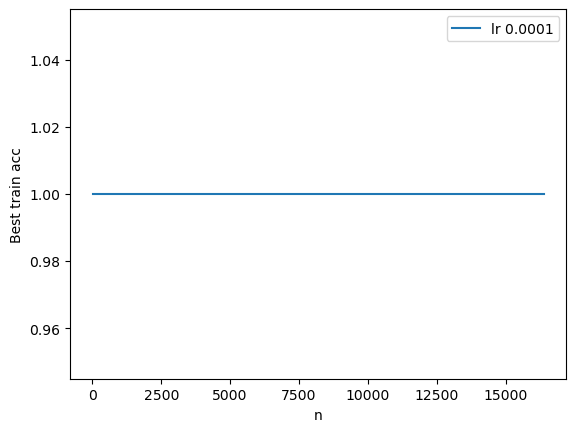

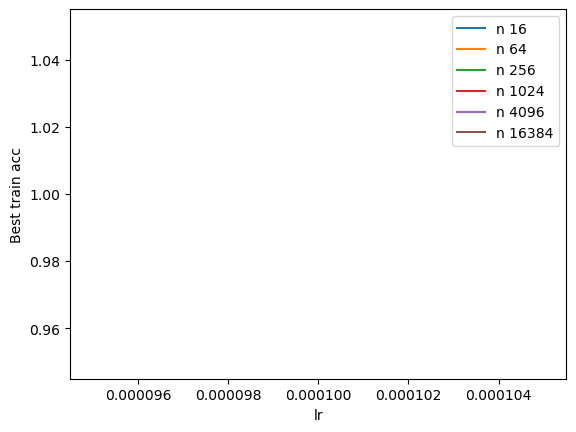

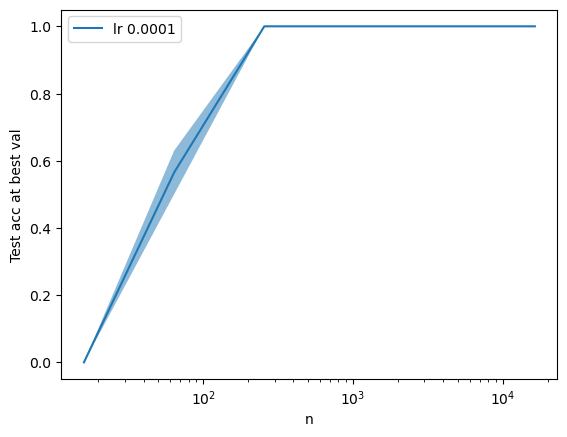

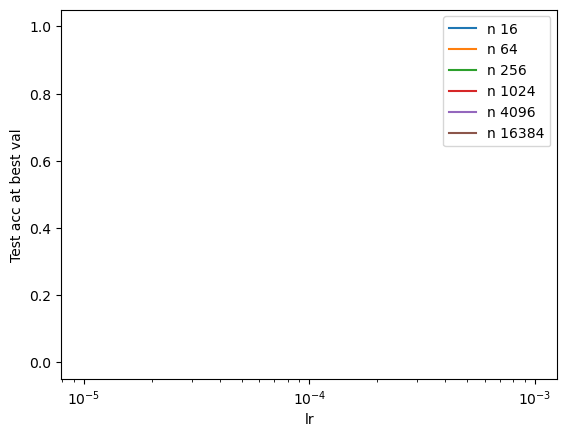

In [116]:
configs = {}
lrs = [1e-4]
ns = [16, 64, 256, 1024, 4096, 16384]
num_trials = 2
lrs.sort()
for trialnum in range(num_trials):
    for lr in lrs:
        for n in ns:
            config = {('logging', 'task_name') : f'transformertied_copyout_multiclass_{n}trainsamples_{n}trainsas_lr{lr}_trial{trialnum}',
                      ('data', 'templates'): ['#'],
                      ('data', 'wildcards'): '#',
                      ('data', 'template_probs'): [1],
                      ('data', 'template_labels'): ['#'],
                      ('data', 'label_type'): 'multiclass',

                      ('data', 'num_train_samples'): n,
                      ('data', 'train_substitution_alphabet_size') : n,
                      ('data', 'num_val_samples'): 100,
                      ('data', 'val_substitution_alphabet_size') : 100,
                      ('data', 'num_test_samples'): 100,
                      ('data', 'test_substitution_alphabet_size') : 100,

                      ('training', 'lr'): lr,
                      ('training', 'epochs'): 1000,
                      ('training', 'batch_size'): 1024,
                      ('training', 'num_workers'): 8,
                      ('training', 'optimizer'): 'adam',
                      ('training', 'lazy') : False,

                      ('model', 'type'): 'transformer_tiedembeddingunembedding',
                      ('model', 'embed_dim'): 128,
                      ('model', 'depth'): 2,
                      ('model', 'num_heads'): 16,
                      ('model', 'dropout'): 0,
                      ('model', 'attn_mult'): 1.0,
                      ('model', 'alpha') : 1,
                      ('model', 'input_alphabet_size') : None,
                     }
            configs[(n, lr, trialnum)] = config
            # # print(config[('logging', 'task_name')])
            run_experiment_from_config(config, verbose=False)

add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=False, logscale2=False, config_func=get_best_train_acc, ylim=None)
plot_config_dict()
add_to_plot_config_dict(configs, ns, lrs, 'n', 'lr', num_trials, logscale1=True, logscale2=True, config_func=get_test_acc_at_best_val, ylim=None)
plot_config_dict()

## Util

In [ ]:
# for f in os.listdir('./saved_runs'):
#     if '.pkl' not in f:
#         continue
#     if '_trial' in f:
#         continue
#     newname = f[0:-4] + '_trial0.pkl'
#     print(f)
#     print(newname)
#     os.rename('./saved_runs/' + f, './saved_runs/' + newname)